
# RNN Dead Layer Fit Project
## MC2 Fixed DLF=1, Quantile Regression Loss on DLF Label


## Import general packages

In [1]:
#check env
import os
print (os.environ['CONDA_DEFAULT_ENV'])

/unix/legend/abi/ML_DL/MLenv


In [2]:
#General
import sys
import json
import yaml
import pandas as pd

#RNN imports
import numpy as np
import os
import argparse
import time
import math
import random
import torch.nn as nn
import torch.optim as optim
from torch.nn.parameter import Parameter
from torch.nn import init
import torch.nn.functional as F
import torch
import torch.utils.data as data_utils
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
import gzip
import pickle
import numpy as np
from torch.autograd import Variable
from scipy import sparse
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.preprocessing import StandardScaler
import matplotlib
import matplotlib.pyplot as plt
from matplotlib import cm
import torchsnooper #problem installing: !pip install torchsnooper --user #this worked for installing torchsnooper
import h5py
import re
from tqdm import tqdm
from torch.cuda.amp import autocast

torch.cuda.empty_cache()


DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# DEVICE = torch.device("cuda:0")
print(DEVICE)
torch.cuda.is_available()

/unix/legend/abi/ML_DL/MLenv/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


cuda:0


True

## Import dataset and RNN functions

In [3]:
from src.data import *
from src.RNN import *
from src.training import *
from src.misc import *

## Get relevant paths

In [4]:
# Data paths:
CodePath = os.path.dirname(os.path.abspath("__file__"))
MC_PATH = CodePath+"/data/V05268A_data/training_data_V05268A_5000randomFCCDs_randomDLFs/"
MC_PATH_FCCDonly = CodePath+"/data/V05268A_data/training_data_V05268A_5000randomFCCDs_DLF1/"

DATA_PATH = CodePath+"/data/V05268A_data/experimental_data_V05268A.h5"
MCBESTFIT_FOLDER = CodePath+"/data/V05268A_data/MCBestFit_data_V05268A_FCCD0.97mm/"

## Plot Training Data

no files:  4908


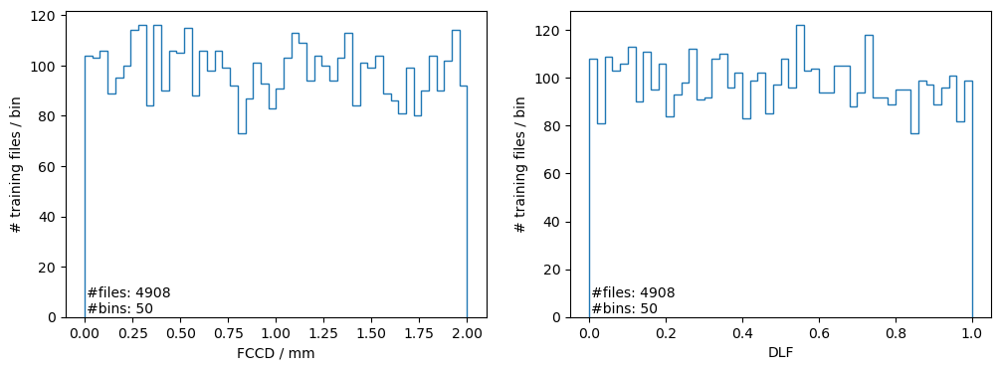

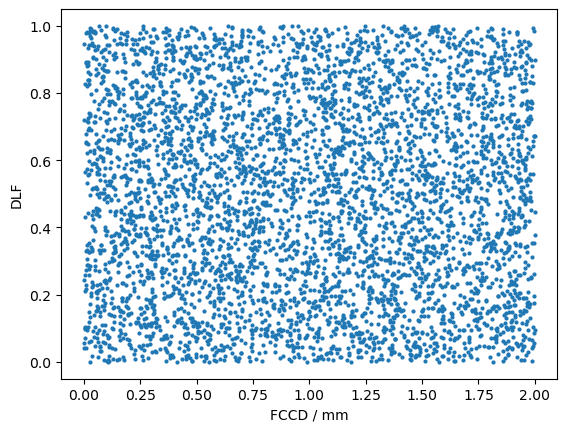

In [5]:
#Plot Training Data
plotTrainingData(MC_PATH)

no files:  4991


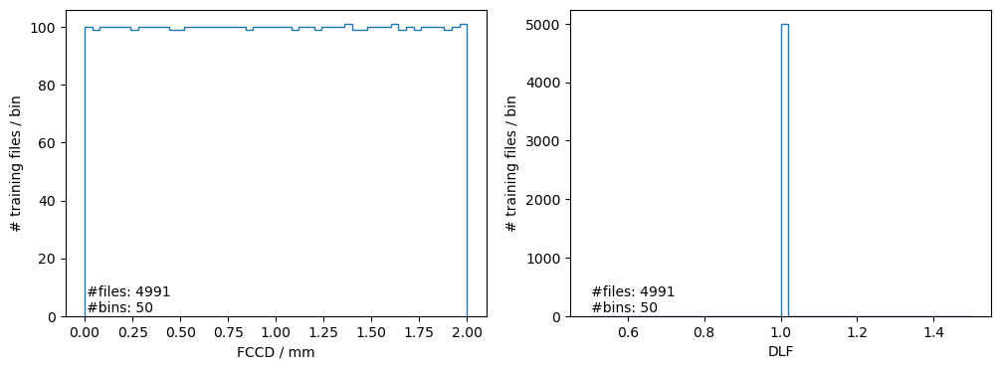

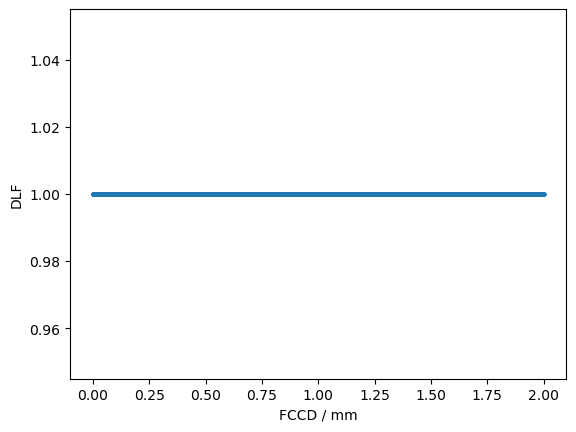

In [6]:
#Plot Training Data
plotTrainingData(MC_PATH_FCCDonly)

# -------------------------------------------------------
# WORKFLOW
# -------------------------------------------------------

# TRAINING 1: full dataset

In [7]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
RNN_ID = "RNN_MC2DLF1_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_fulldataset_"+str(dataset_size)+"trials"
# RNN_ID = "RNN_MC2DLF1_norm1_ratioInput_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_fulldataset_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Training  (DO NOT RERUN UNLESS NECESSARY)

In [8]:
# #load dataset
# BATCH_SIZE = 4 
# # train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly)
# train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly,
#                 normaliseSpectraUnity = True, ratioSpectraRNNInput = True)


In [9]:
# #run training
# FCCD_accuracy_values, DLF_accuracy_values, loss_values = train_RNN(dataset, train_loader, test_loader, NUM_EPOCHS, LEARNING_RATE, saveRNN=True, 
#                                                                    plot_training_results = True, RNN_ID = RNN_ID, quantileRegressionDLF=True)


In [10]:
# #Training Results
# training_results(NUM_EPOCHS, loss_values, FCCD_accuracy_values, DLF_accuracy_values, save_plots = False, RNN_ID = RNN_ID)


## Testing

In [11]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly)
# train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly,
#                                                normaliseSpectraUnity = True, ratioSpectraRNNInput = True)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:24<00:00, 203.04it/s]


(4908, 890)


In [12]:
# Load saved model
RNNclassifier_fulldataset = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_fulldataset.load_state_dict(torch.load(model_path))
RNNclassifier_fulldataset.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.99it/s]


FCCD accuracies: 
total:  3000
TP:  1468
FP:  14
TN:  1516
FN:  2
accuracy:  0.9946666666666667
precision:  0.99055330634278
recall:  0.998639455782313

DLF accuracies: 
accuracy_DLF:  0.973

roc auc FCCD:  0.9999021830954604

Total # misclassified trials FCCD:  16  / 3000
Total # misclassified trials DLF:  81  / 3000


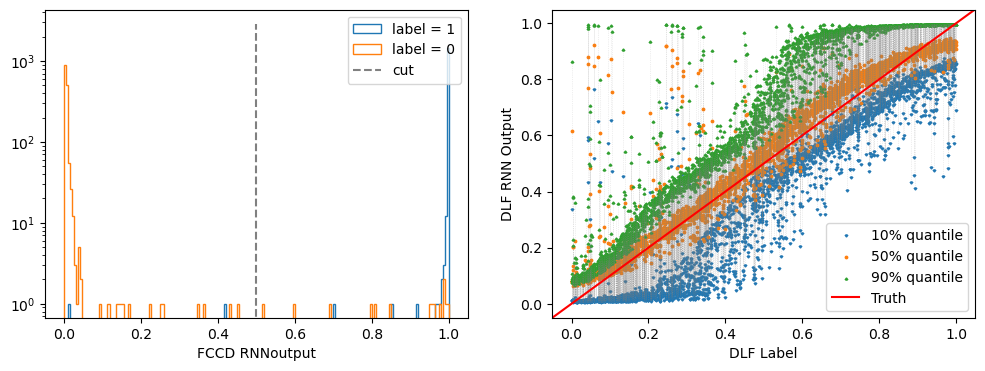

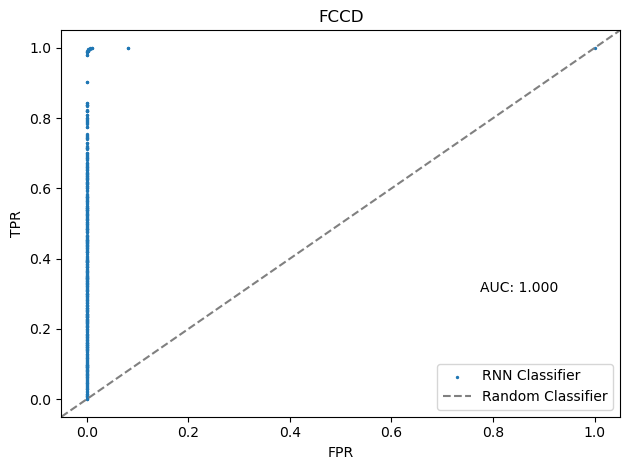

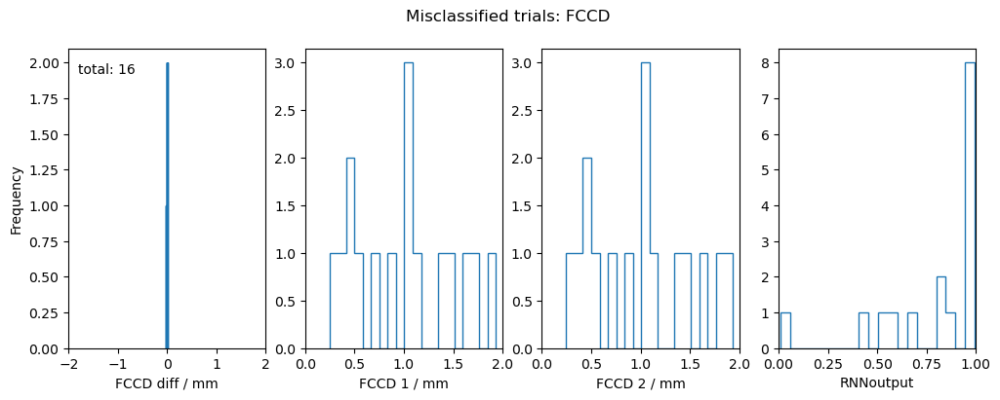

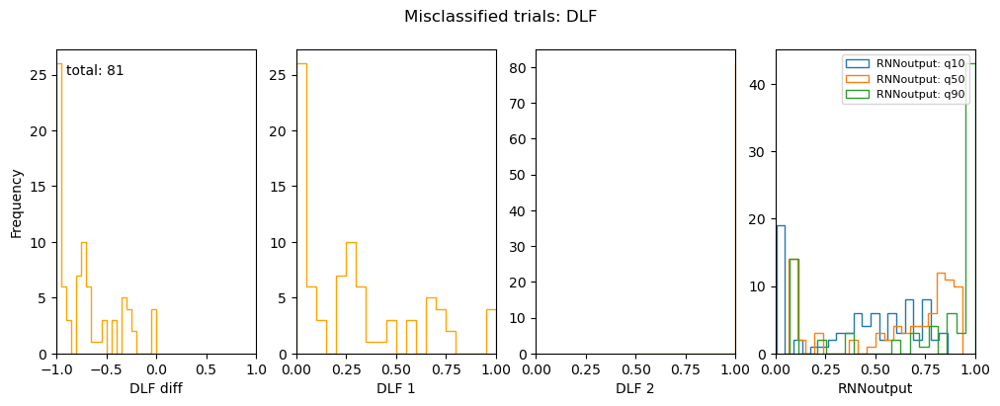

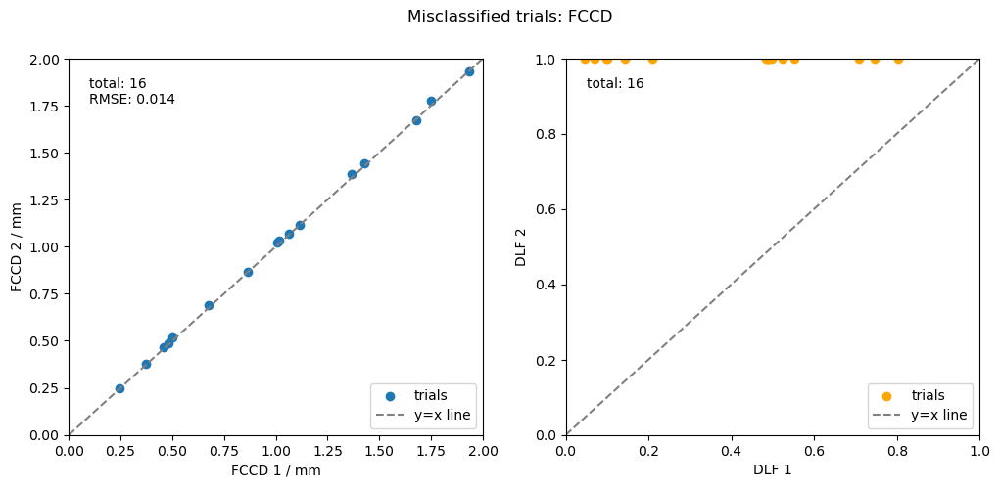

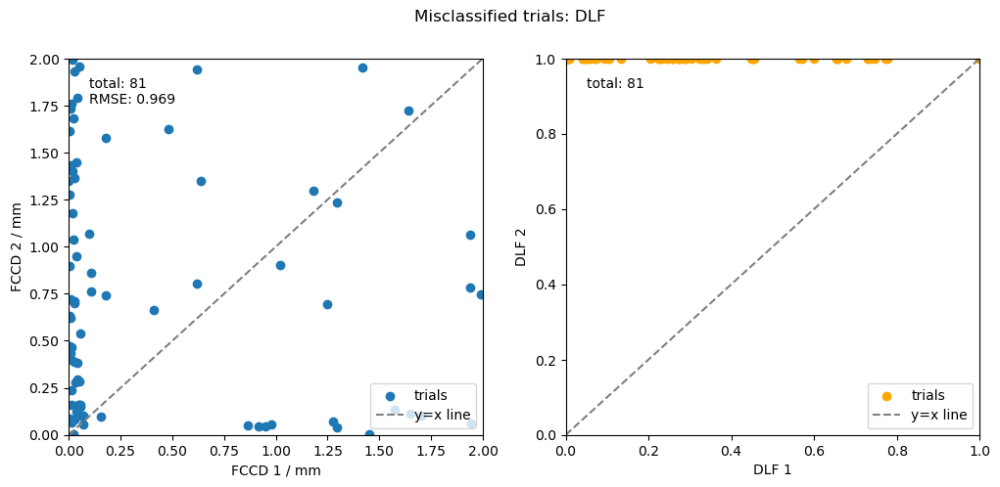

In [13]:
#testing
accuracies_fulldataset = test_RNN(RNNclassifier_fulldataset, test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

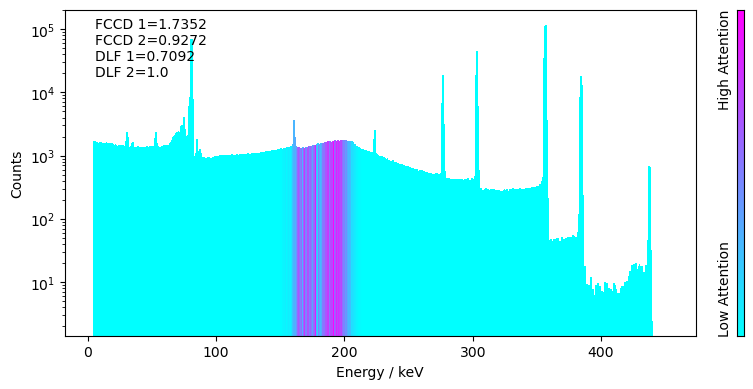

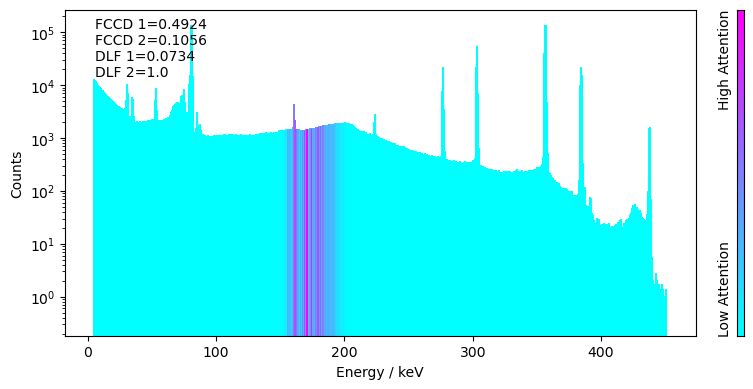

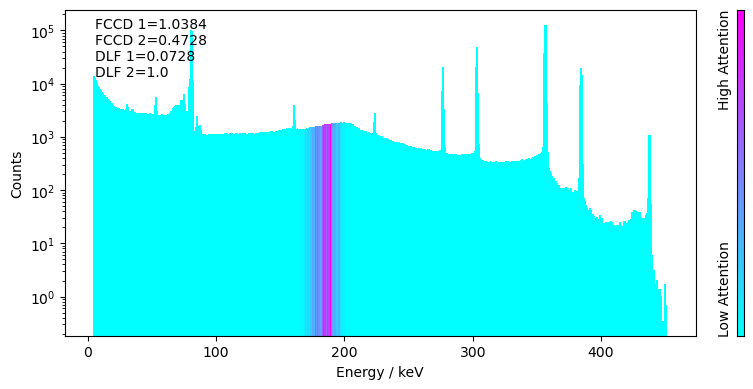

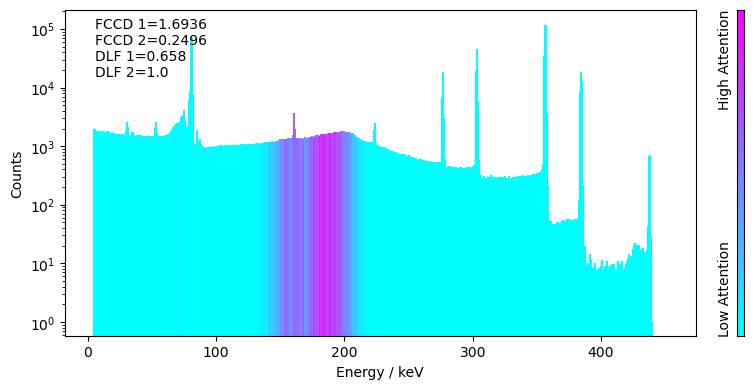

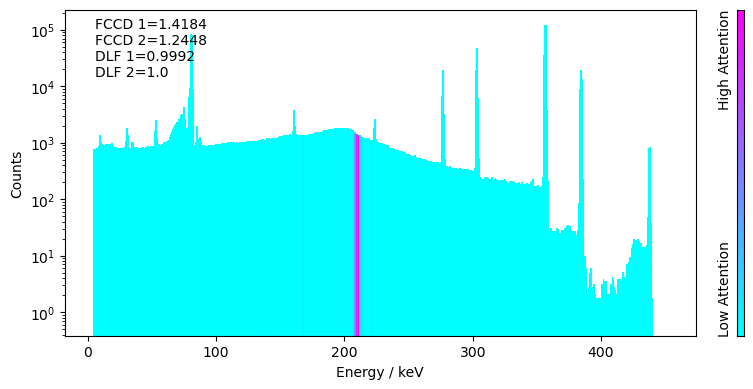

...

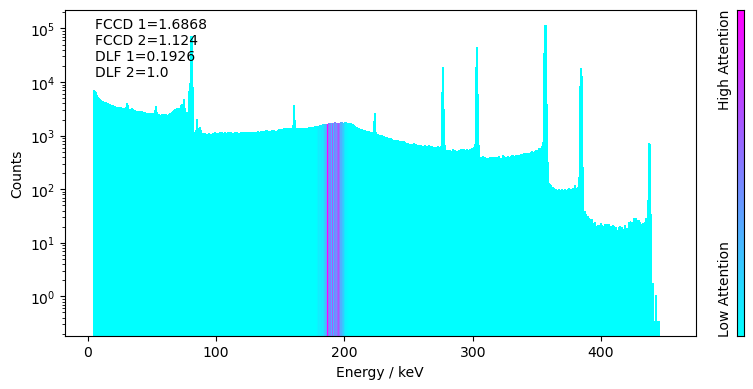

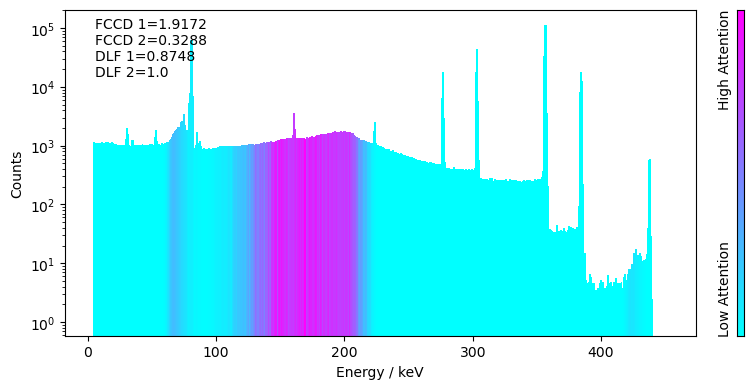

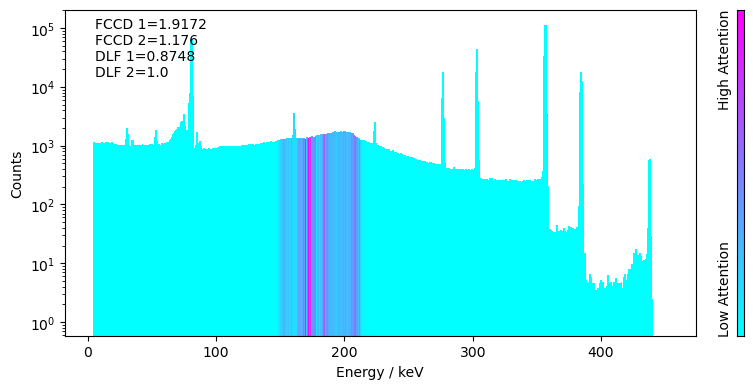

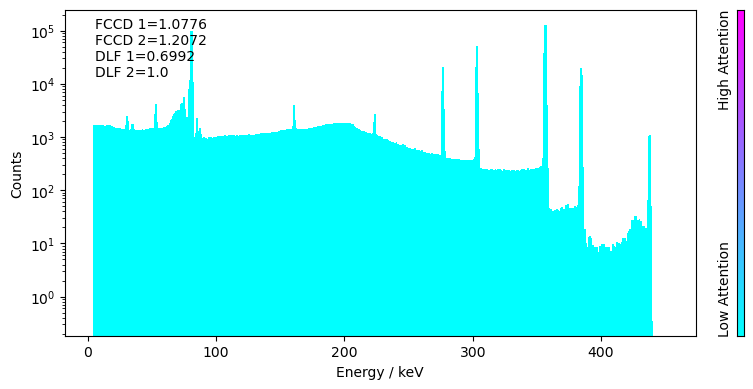

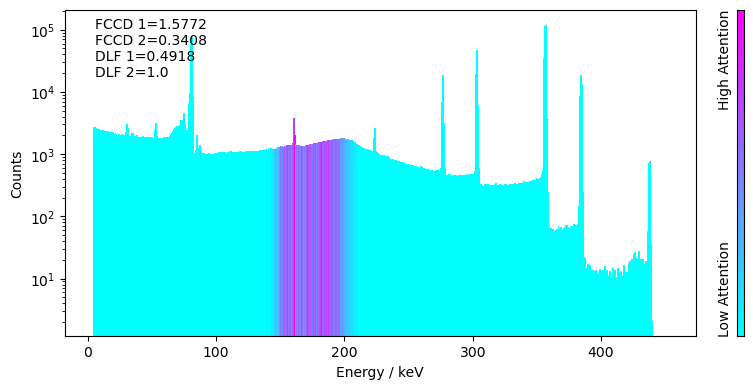

In [14]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)
    

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.93it/s]


saved average attention to csv file


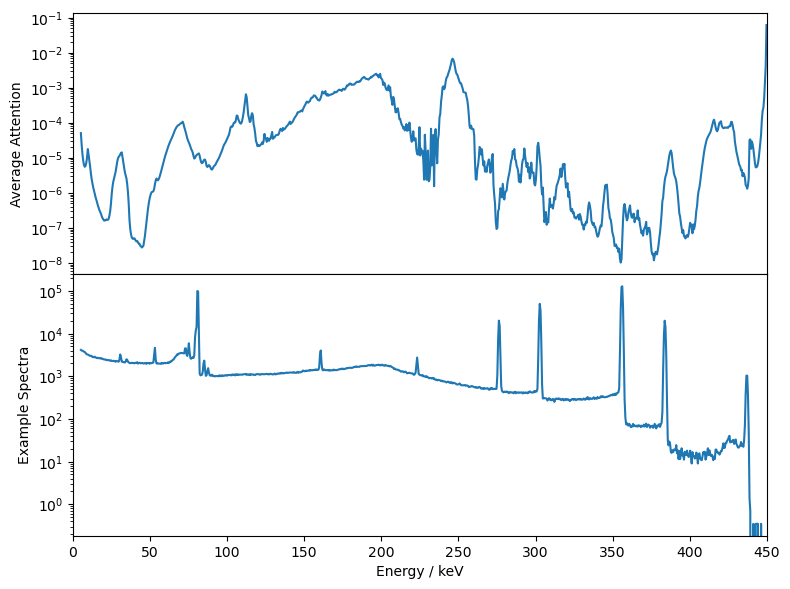

In [15]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, RNN_ID=RNN_ID, save_plots = True,
                                          quantileRegressionDLF=True)


# TRAINING 2: restircted dataset - Max FCCD diff = 0.5 mm
Only train on FCCDs with a max diff of 0.5 mm

In [16]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.5
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxFCCDdiff=0.5mm

In [17]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly)


100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:26<00:00, 184.41it/s]


(4908, 890)


In [18]:
# Load saved model
RNNclassifier_maxFCCDdiff0_5mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_5mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_5mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:07<00:00, 11.06it/s]


FCCD accuracies: 
total:  3000
TP:  1463
FP:  15
TN:  1501
FN:  21
accuracy:  0.988
precision:  0.989851150202977
recall:  0.9858490566037735

DLF accuracies: 
accuracy_DLF:  0.987

roc auc FCCD:  0.9993292570176874

Total # misclassified trials FCCD:  36  / 3000
Total # misclassified trials DLF:  39  / 3000


{'accuracy_FCCD': 0.988,
 'precision_FCCD': 0.989851150202977,
 'recall_FCCD': 0.9858490566037735,
 'accuracy_DLF': 0.987,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9993292570176874,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.02315071393187594,
  'RMSE_DLFmisclassified_FCCD': 0.268753857455918,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 36,
  'NoMisclassifiedDLF': 39}}

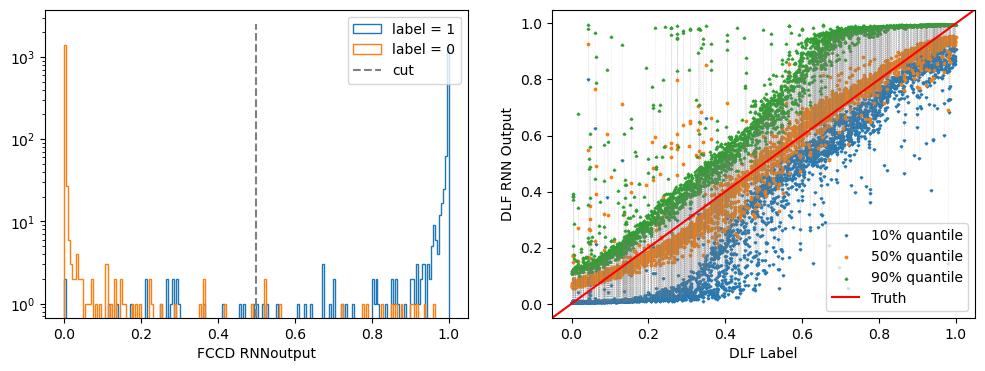

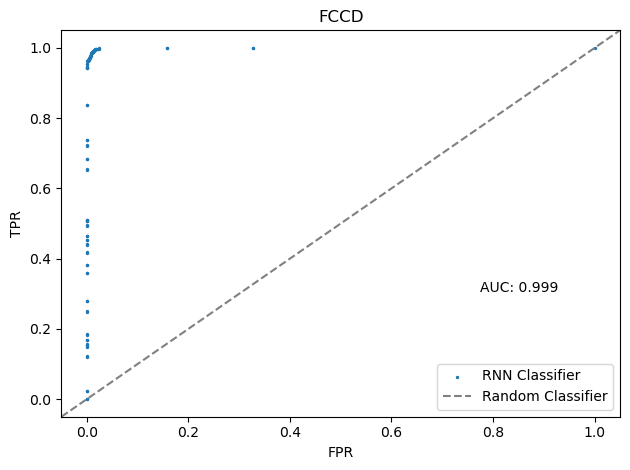

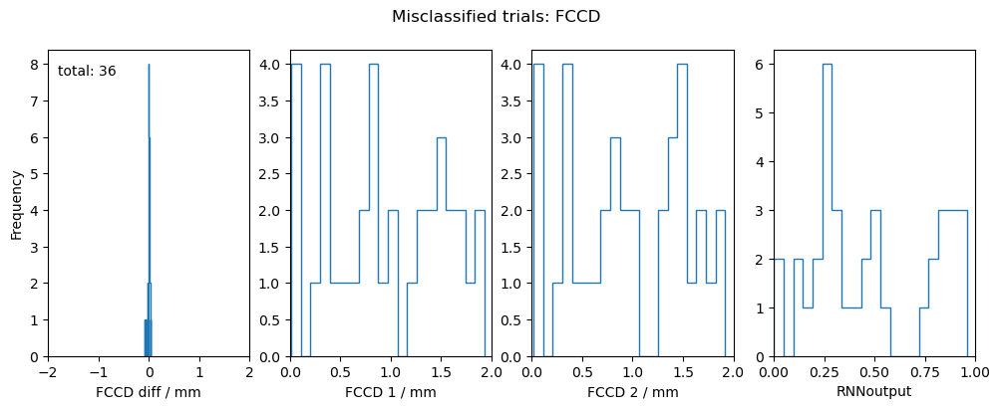

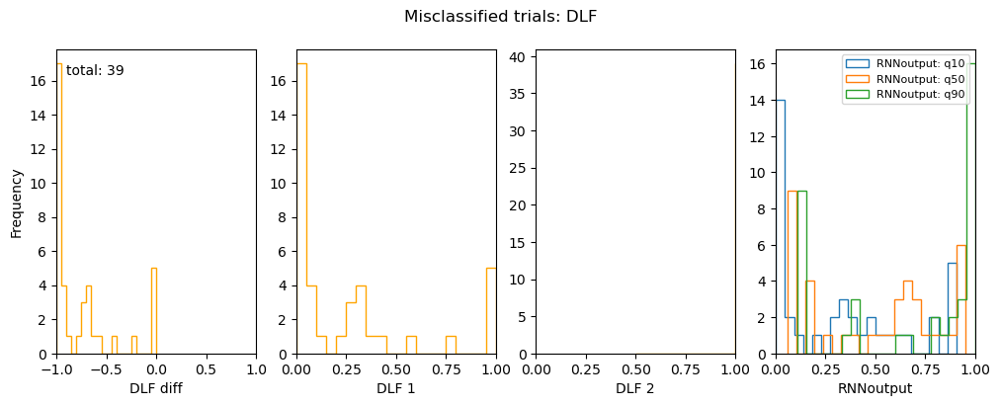

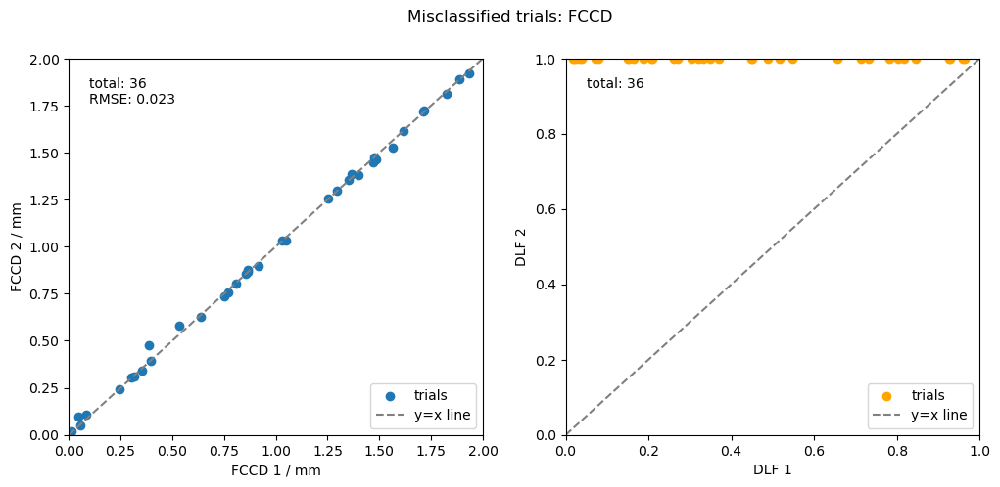

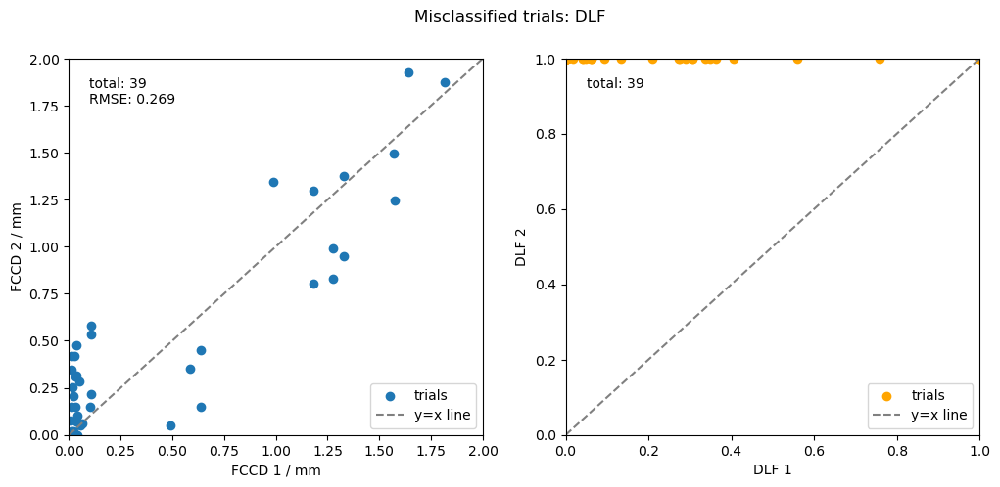

In [19]:
test_RNN(RNNclassifier_maxFCCDdiff0_5mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

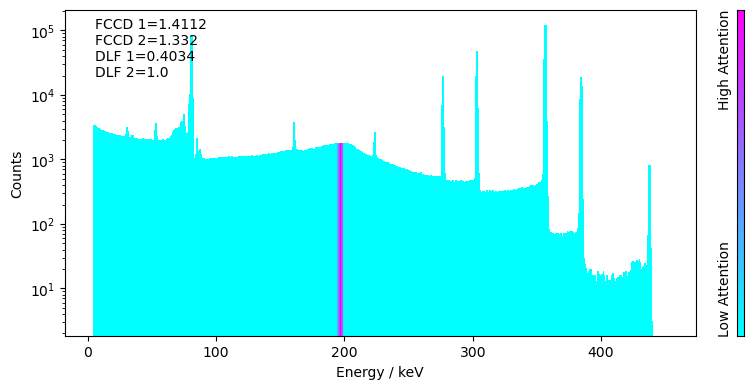

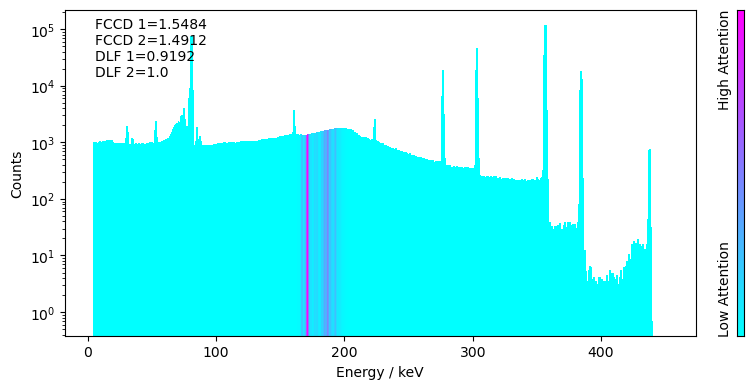

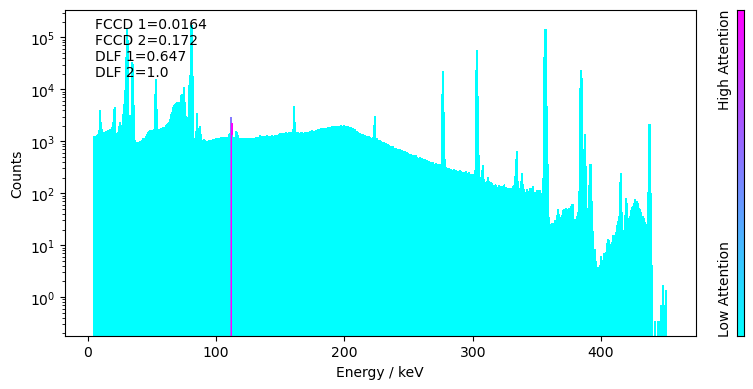

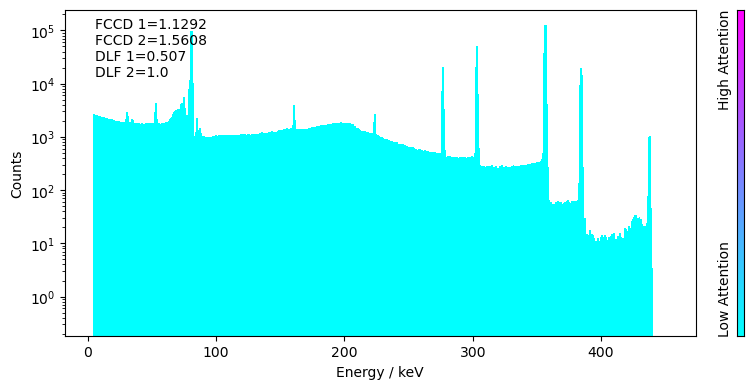

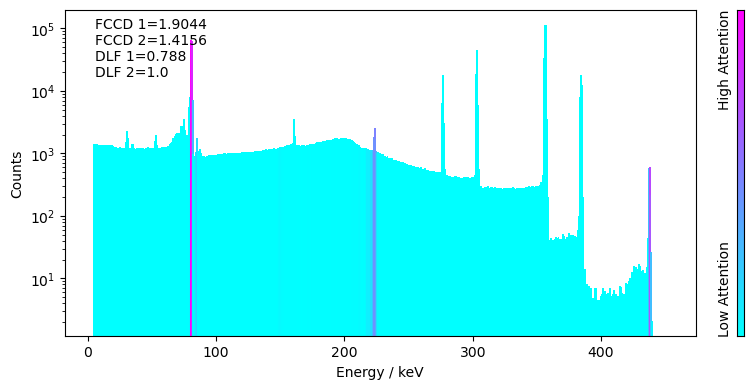

...

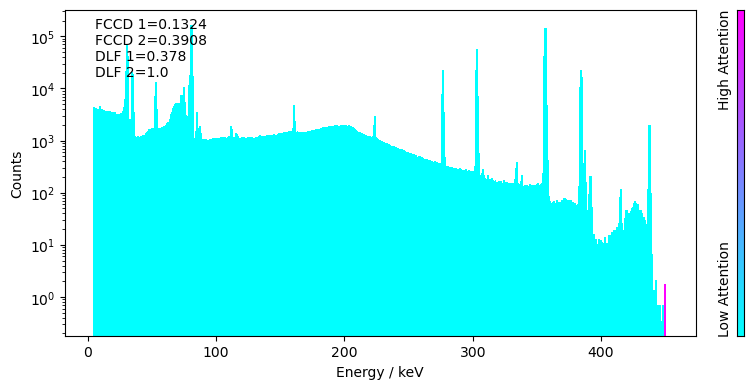

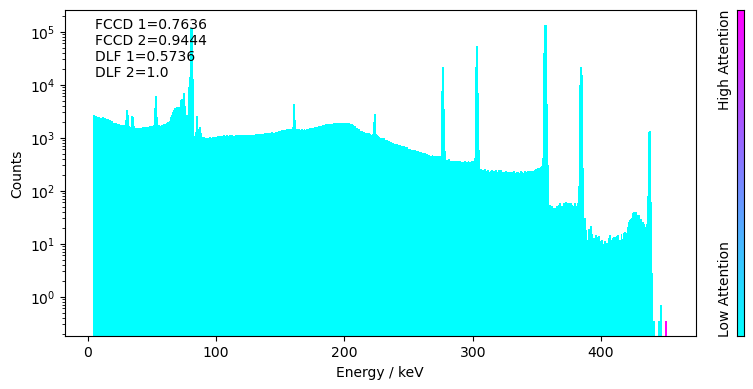

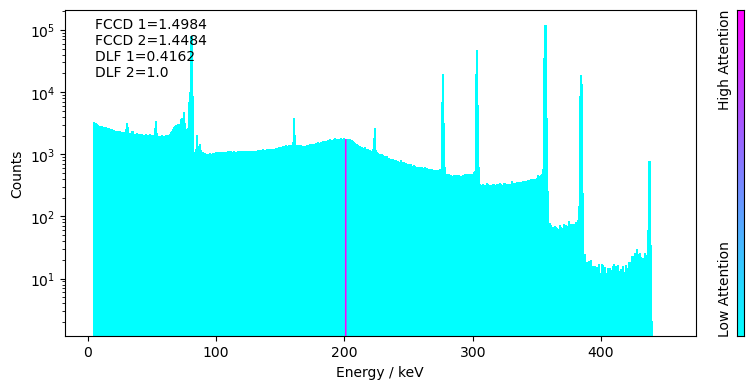

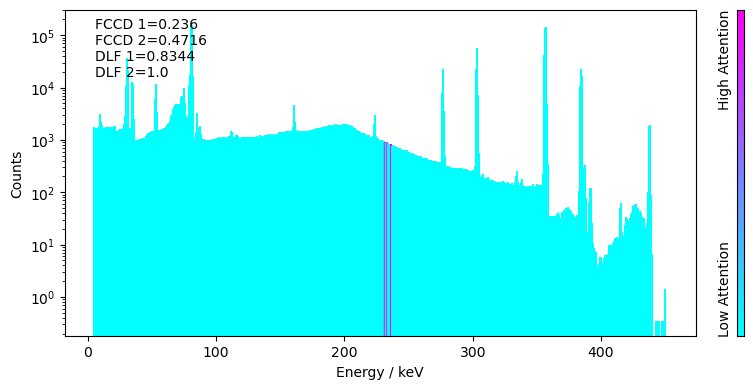

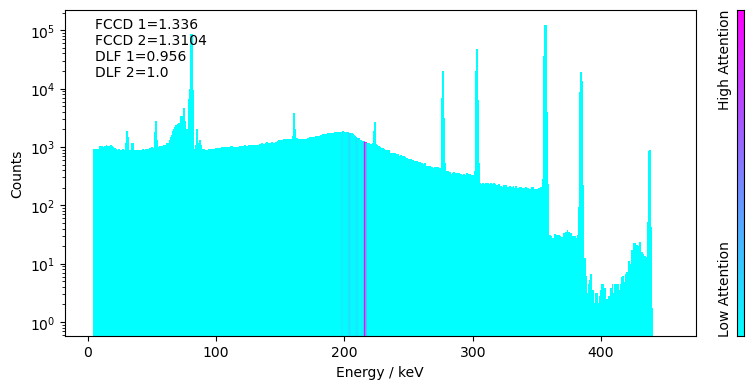

In [20]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)
    

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.95it/s]


saved average attention to csv file


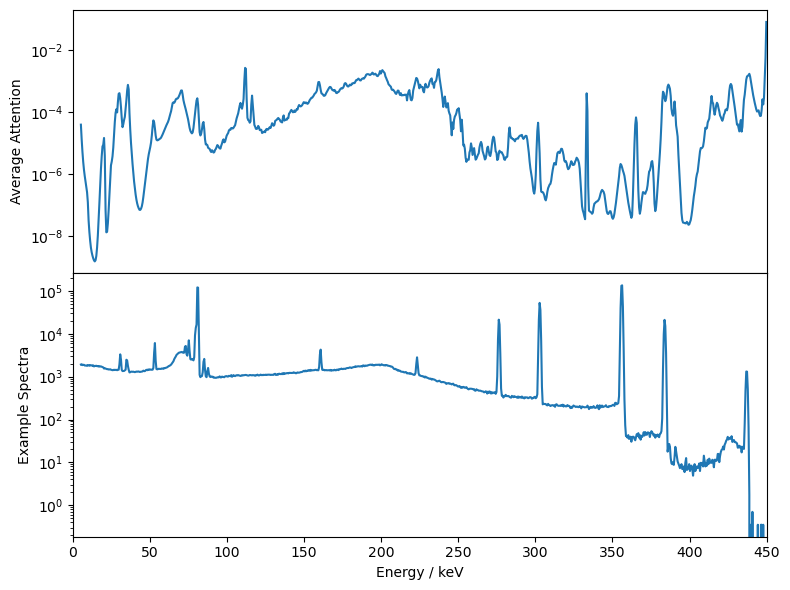

In [21]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)


## Testing - on full dataset

In [22]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:25<00:00, 195.36it/s]


(4908, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:11<00:00, 10.45it/s]


FCCD accuracies: 
total:  3000
TP:  1458
FP:  7
TN:  1523
FN:  12
accuracy:  0.9936666666666667
precision:  0.995221843003413
recall:  0.9918367346938776

DLF accuracies: 
accuracy_DLF:  0.9663333333333334

roc auc FCCD:  0.9997327820016896

Total # misclassified trials FCCD:  19  / 3000
Total # misclassified trials DLF:  101  / 3000


{'accuracy_FCCD': 0.9936666666666667,
 'precision_FCCD': 0.995221843003413,
 'recall_FCCD': 0.9918367346938776,
 'accuracy_DLF': 0.9663333333333334,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9997327820016896,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.43429332799024456,
  'RMSE_DLFmisclassified_FCCD': 1.2242197576617955,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 19,
  'NoMisclassifiedDLF': 101}}

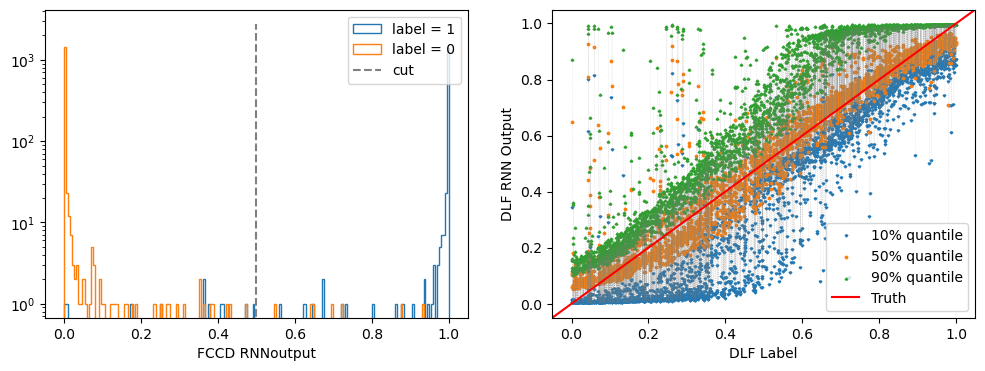

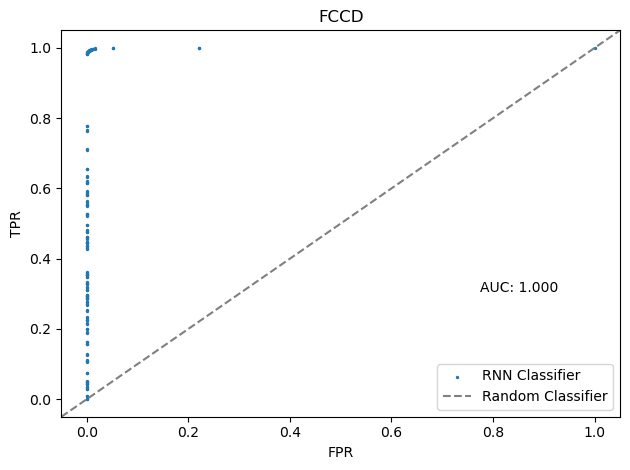

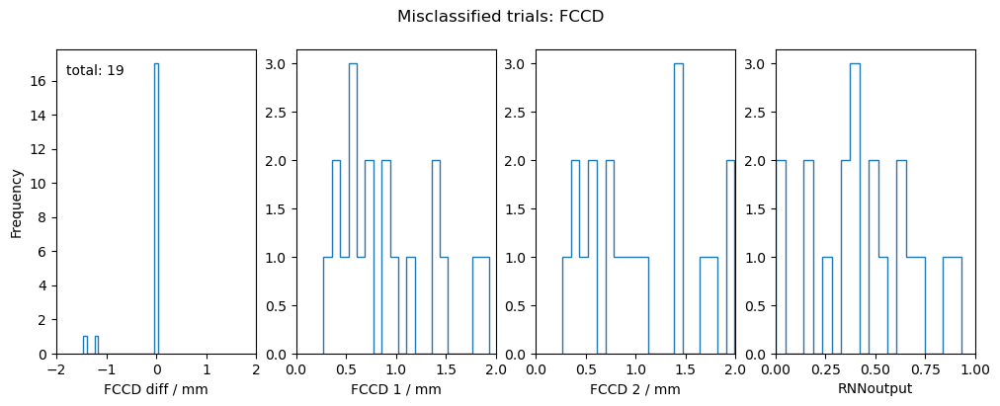

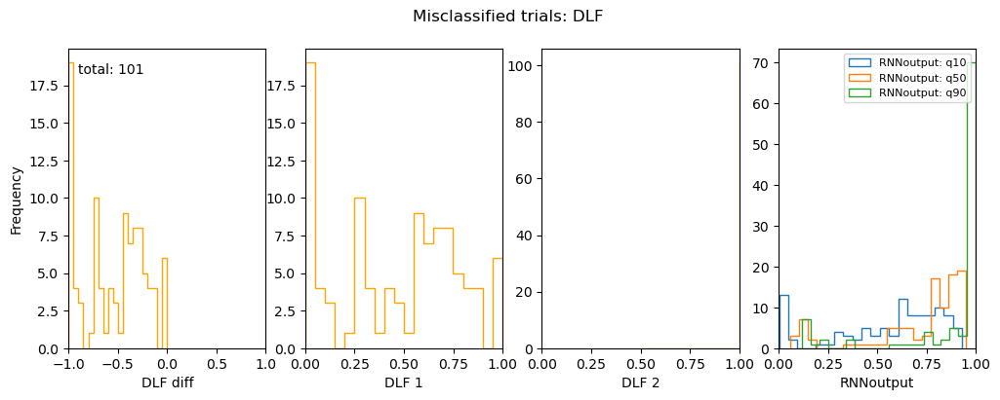

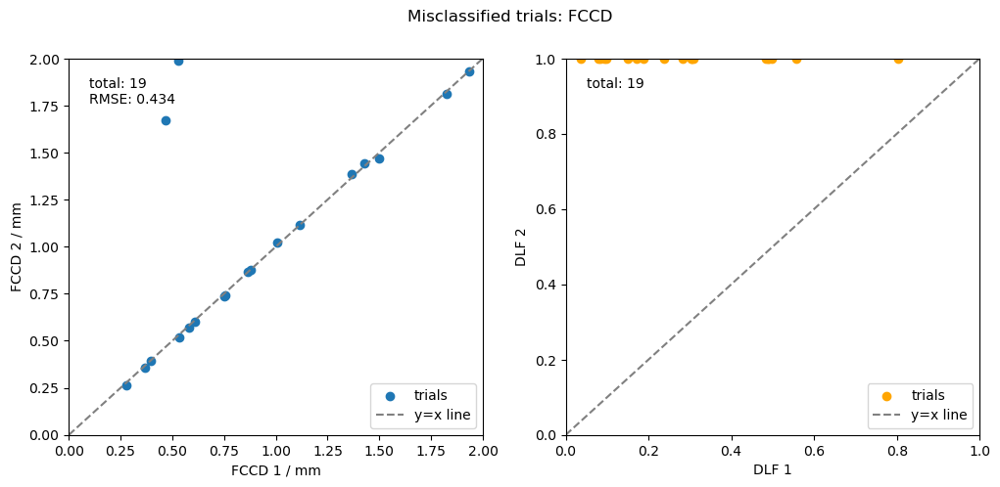

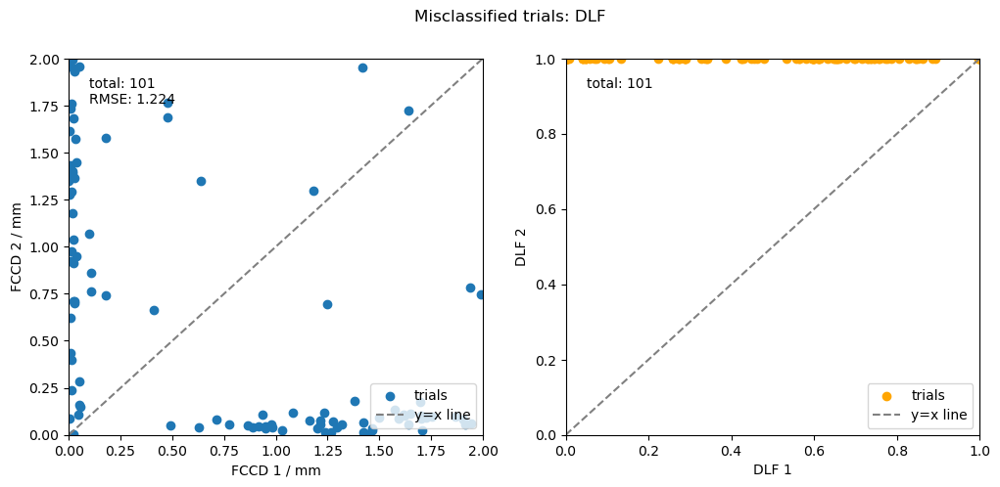

In [23]:
test_RNN(RNNclassifier_maxFCCDdiff0_5mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

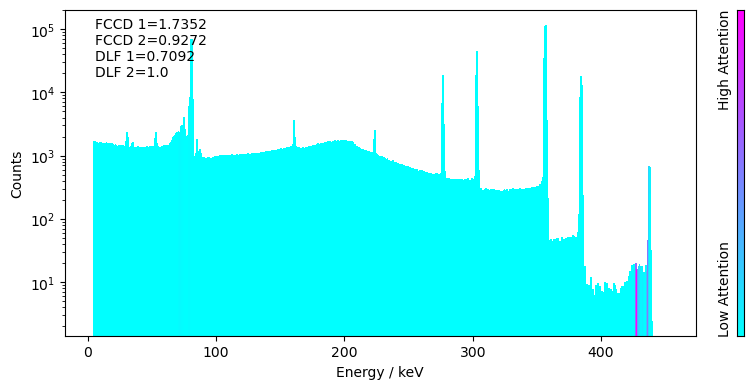

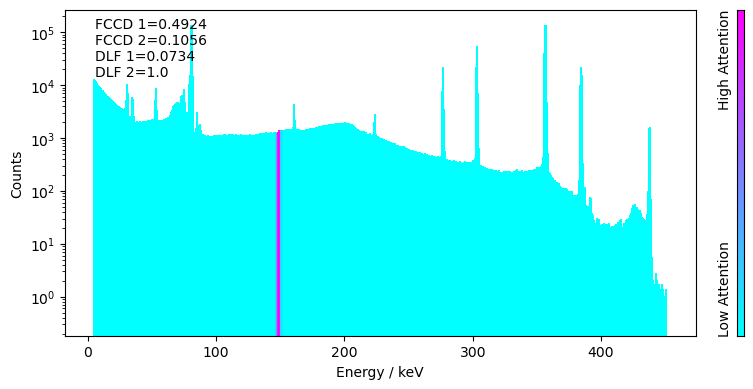

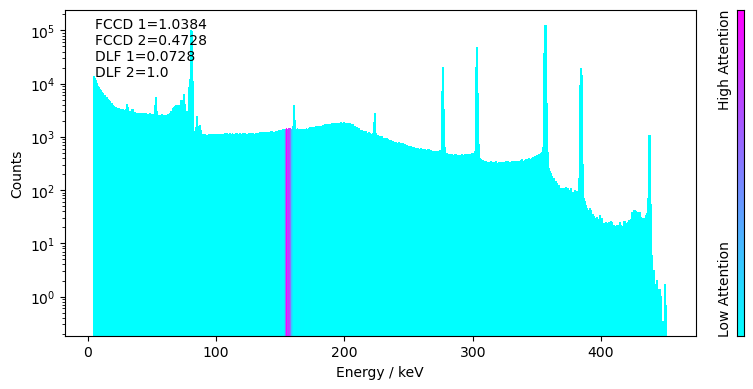

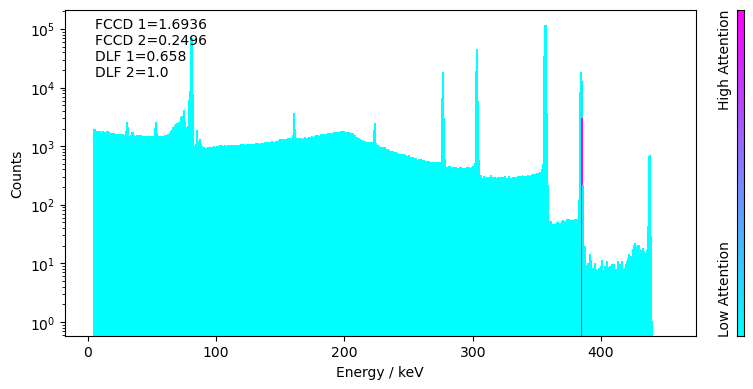

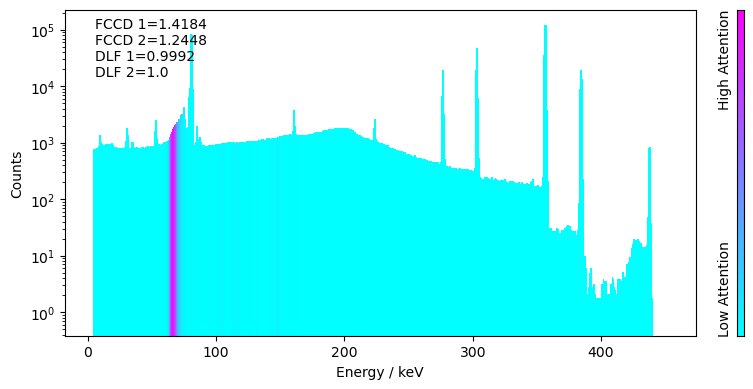

...

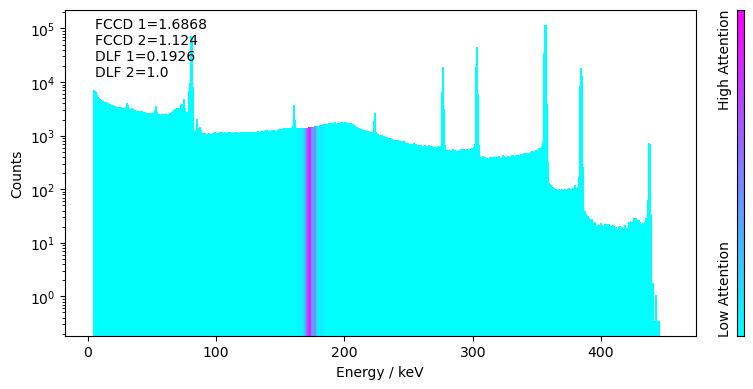

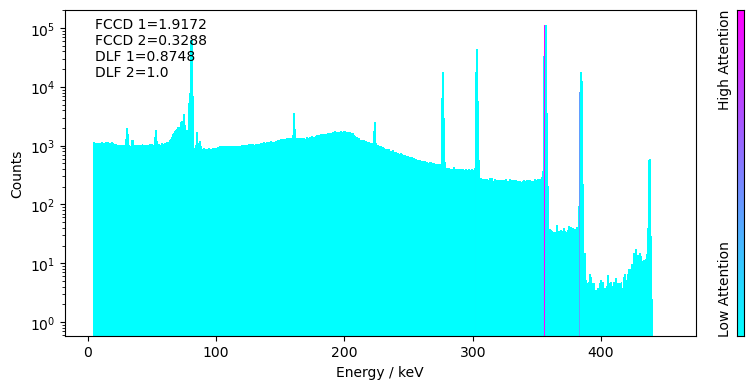

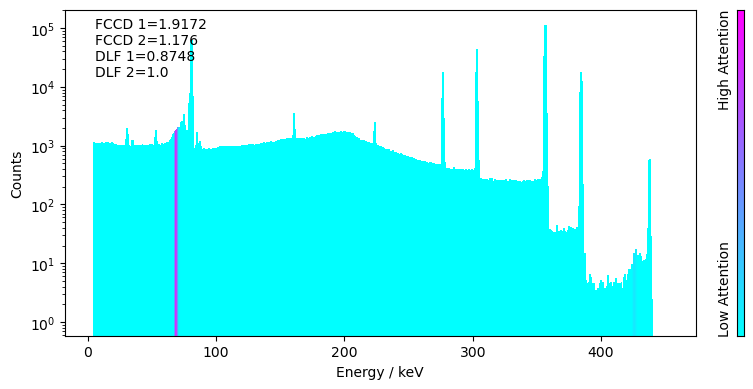

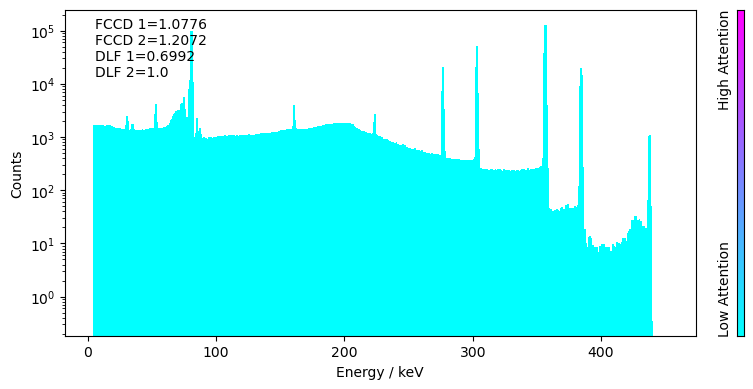

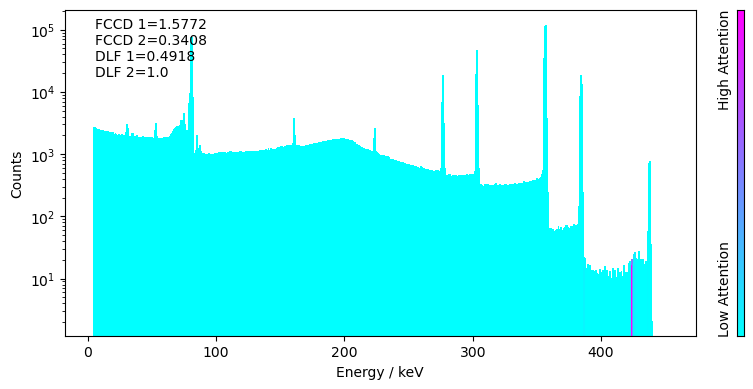

In [24]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 11.02it/s]


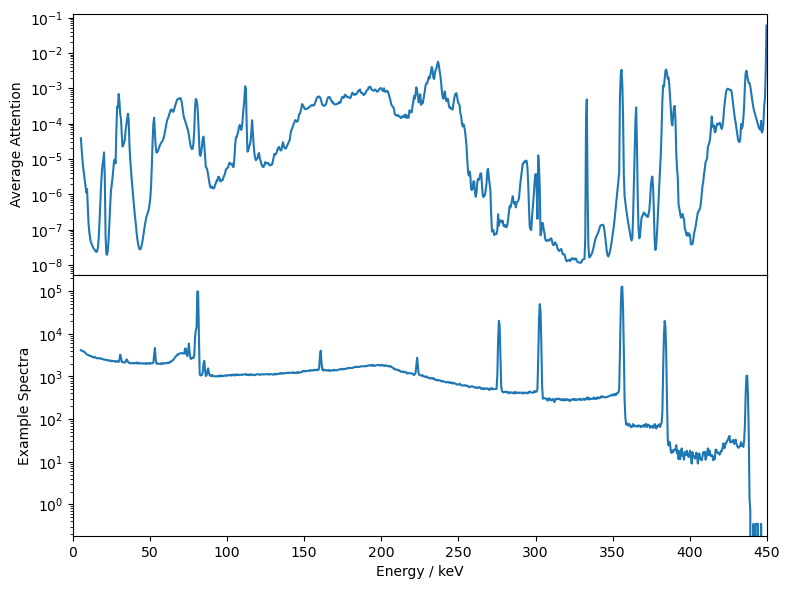

In [25]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)


# TRAINING 3: restircted dataset - Max FCCD diff = 0.25 mm

In [26]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.25
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxFCCDdiff=0.25mm

In [27]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly)


100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:26<00:00, 187.58it/s]


(4908, 890)


In [28]:
# Load saved model
RNNclassifier_maxFCCDdiff0_25mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_25mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_25mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.83it/s]


FCCD accuracies: 
total:  3000
TP:  1464
FP:  15
TN:  1494
FN:  27
accuracy:  0.986
precision:  0.9898580121703854
recall:  0.9818913480885312

DLF accuracies: 
accuracy_DLF:  0.9806666666666667

roc auc FCCD:  0.9980554855530355

Total # misclassified trials FCCD:  42  / 3000
Total # misclassified trials DLF:  58  / 3000


{'accuracy_FCCD': 0.986,
 'precision_FCCD': 0.9898580121703854,
 'recall_FCCD': 0.9818913480885312,
 'accuracy_DLF': 0.9806666666666667,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9980554855530355,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.05341595980514401,
  'RMSE_DLFmisclassified_FCCD': 0.10983993369664222,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 42,
  'NoMisclassifiedDLF': 58}}

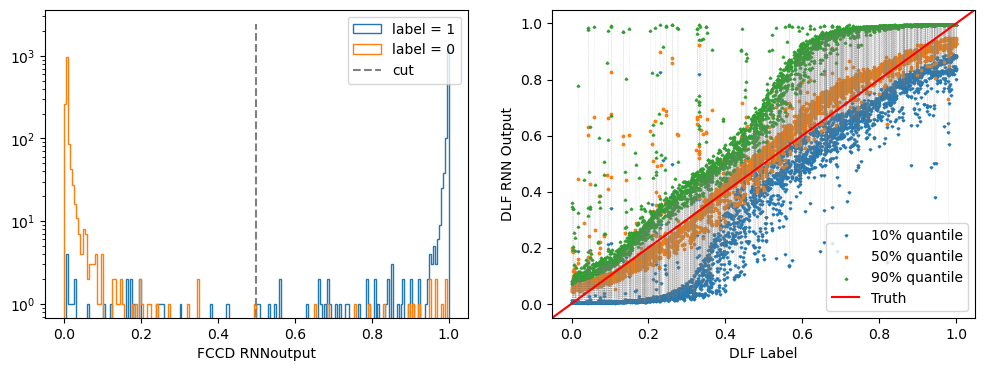

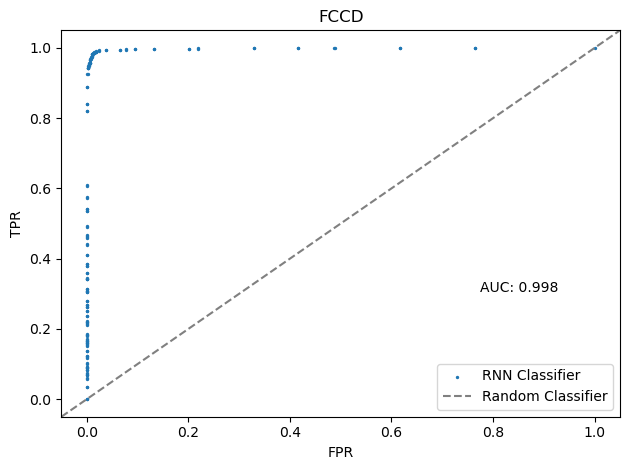

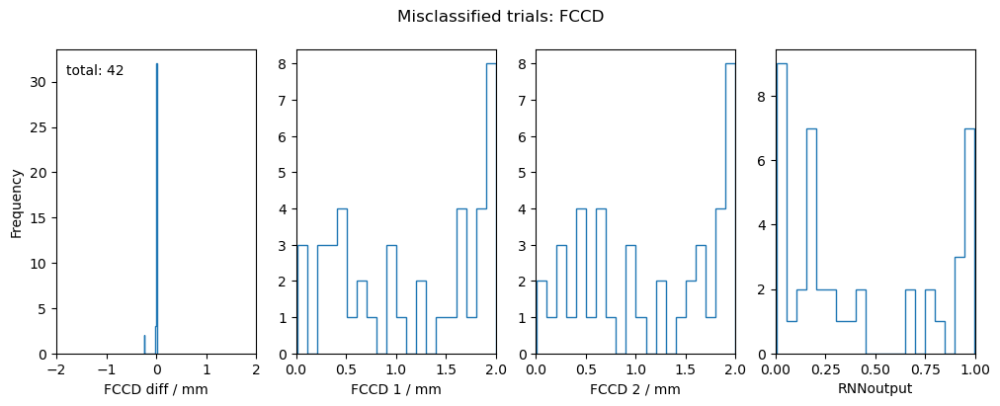

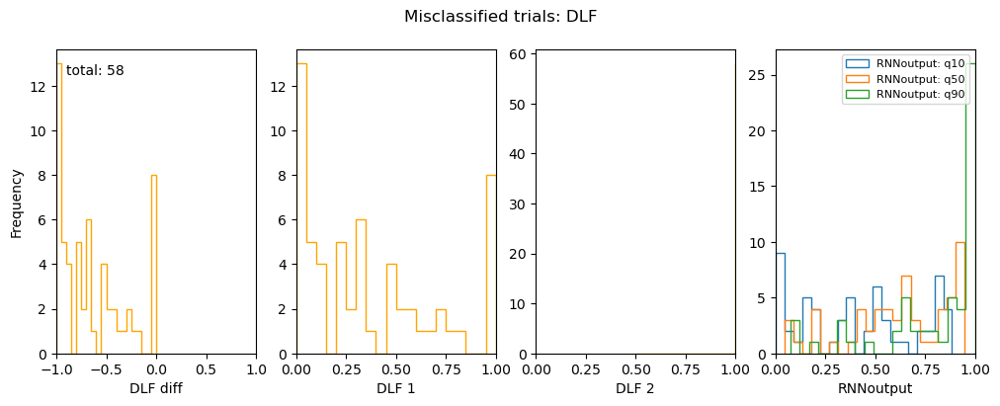

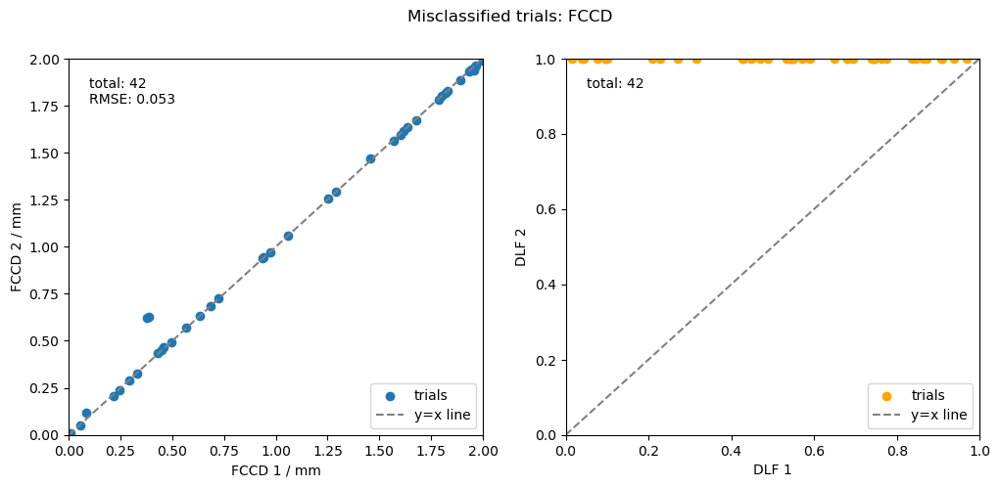

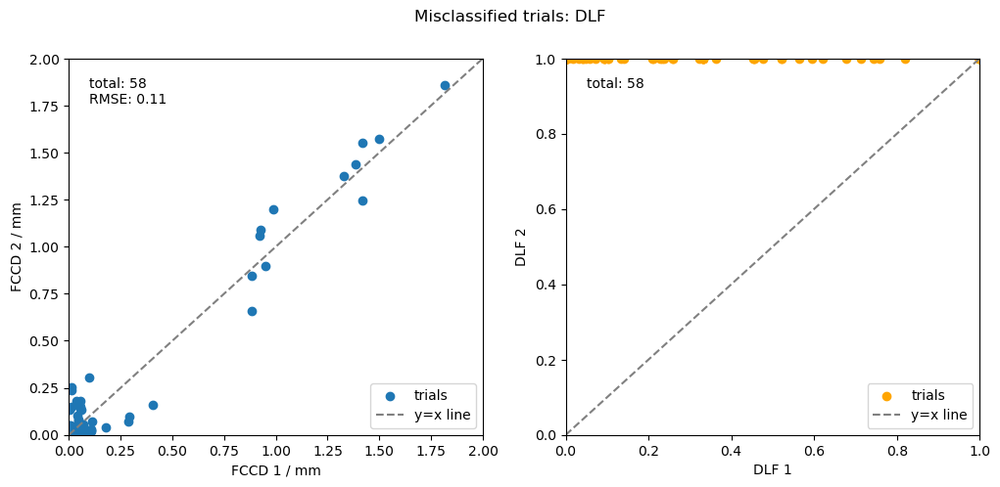

In [29]:
test_RNN(RNNclassifier_maxFCCDdiff0_25mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

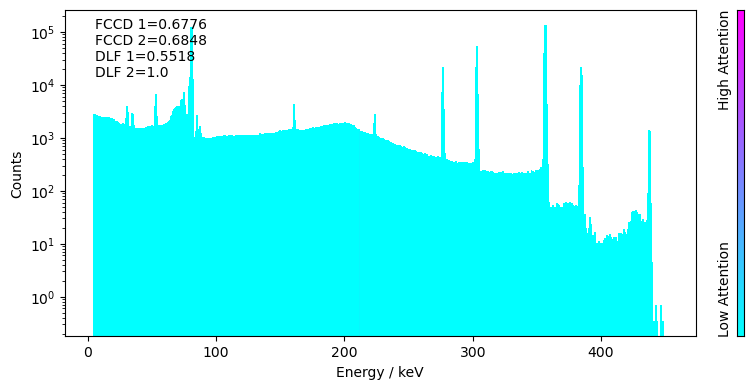

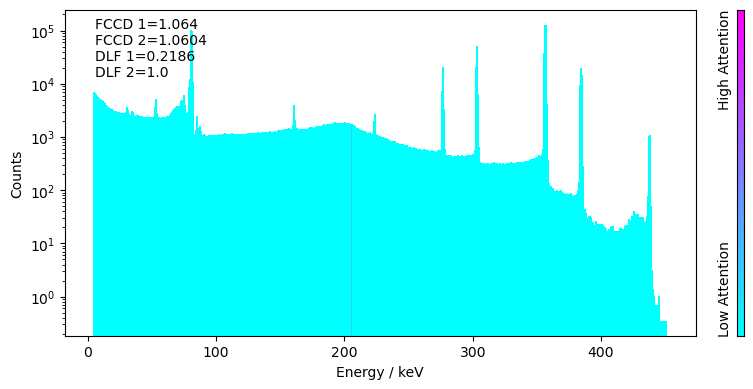

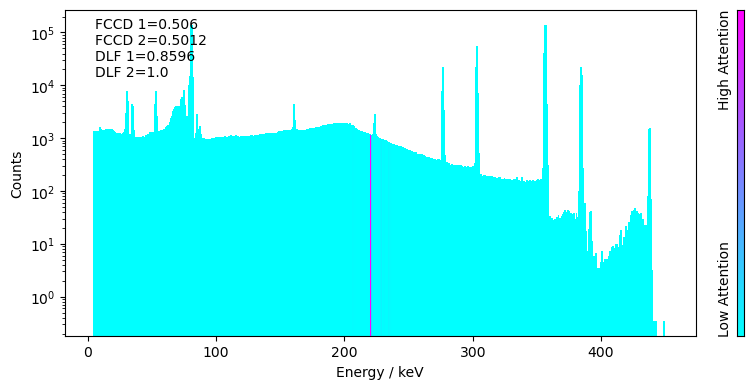

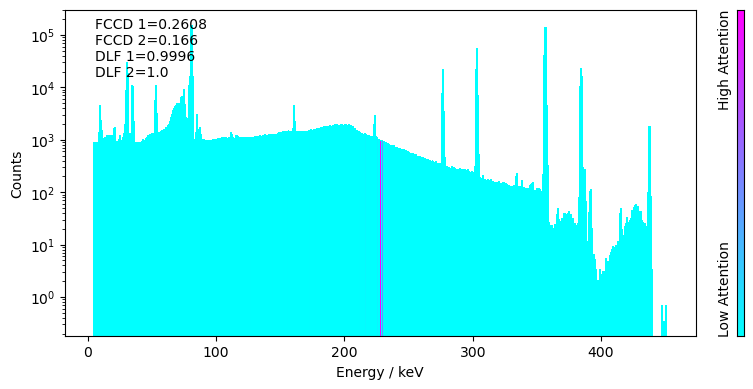

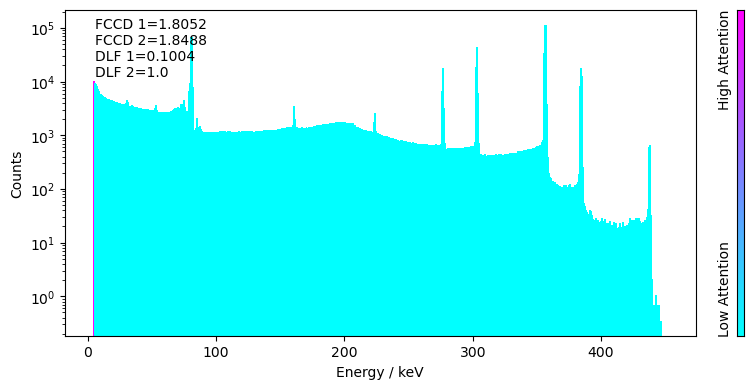

...

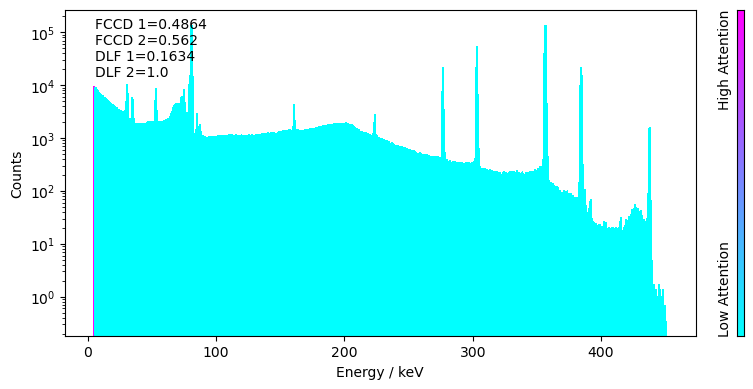

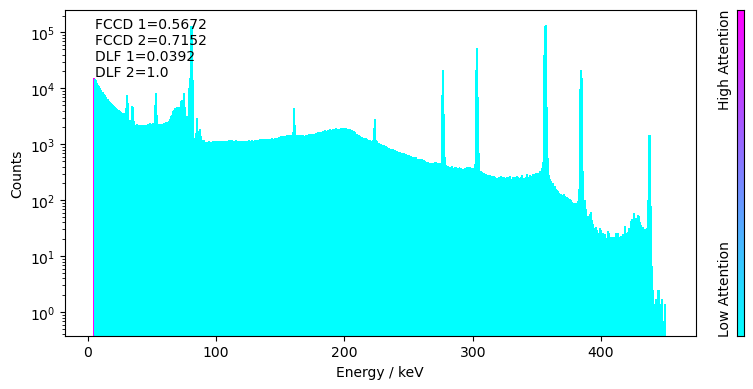

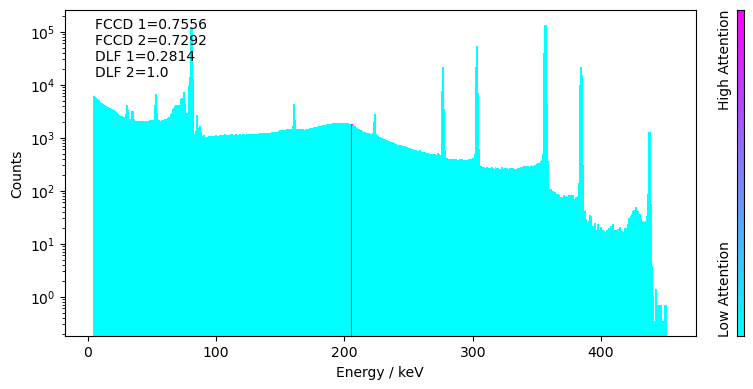

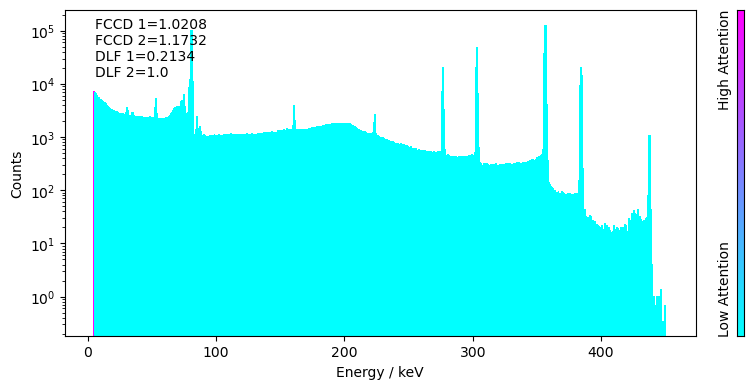

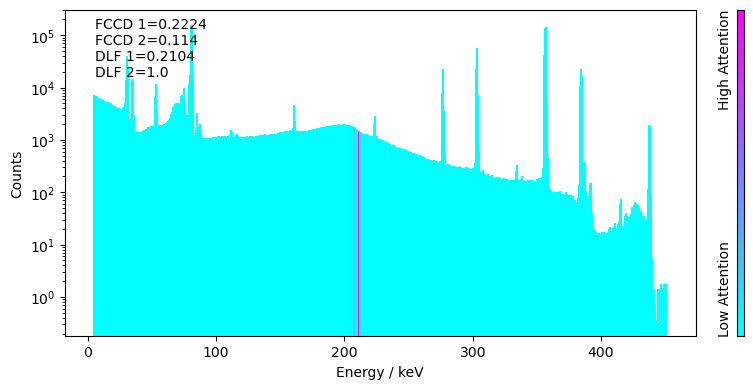

In [30]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:10<00:00, 10.64it/s]


saved average attention to csv file


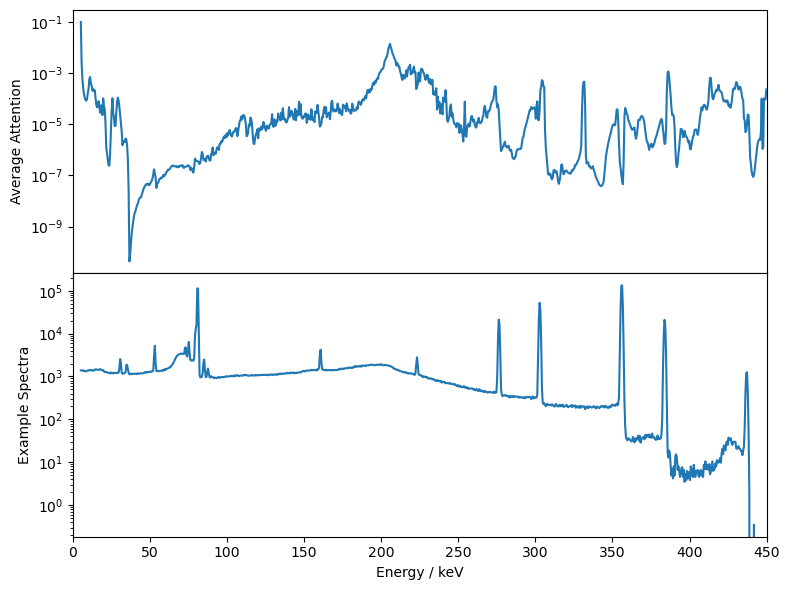

In [31]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)

## Testing - on full dataset

In [32]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:28<00:00, 171.72it/s]


(4908, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.74it/s]


FCCD accuracies: 
total:  3000
TP:  1370
FP:  362
TN:  1168
FN:  100
accuracy:  0.846
precision:  0.7909930715935335
recall:  0.9319727891156463

DLF accuracies: 
accuracy_DLF:  0.941

roc auc FCCD:  0.9614828153483617

Total # misclassified trials FCCD:  462  / 3000
Total # misclassified trials DLF:  177  / 3000


{'accuracy_FCCD': 0.846,
 'precision_FCCD': 0.7909930715935335,
 'recall_FCCD': 0.9319727891156463,
 'accuracy_DLF': 0.941,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9614828153483617,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 1.1005874978935026,
  'RMSE_DLFmisclassified_FCCD': 1.1890152921521873,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 462,
  'NoMisclassifiedDLF': 177}}

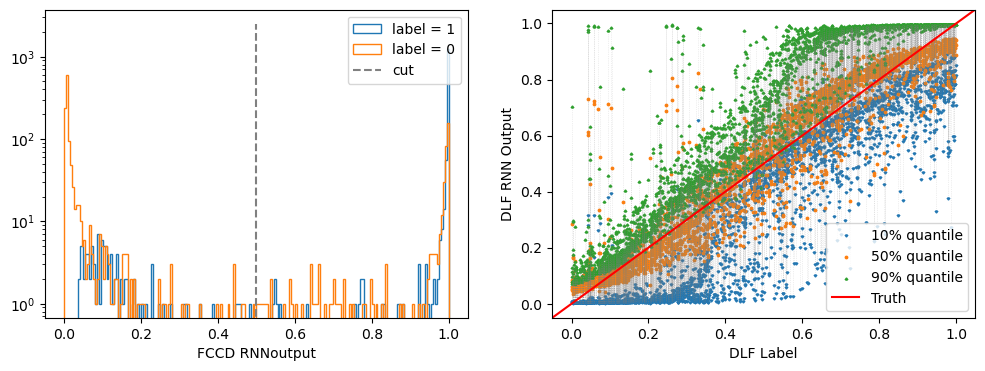

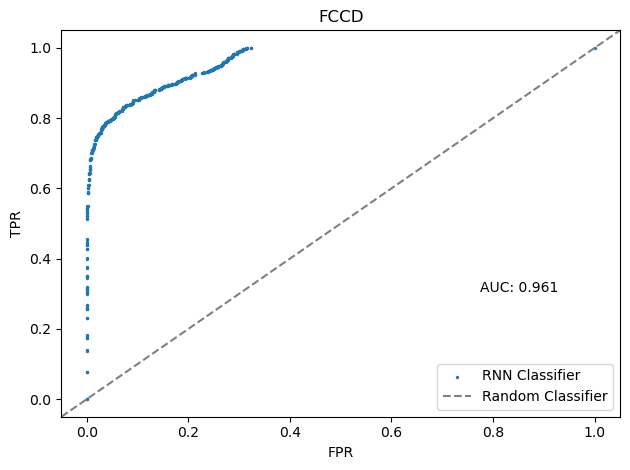

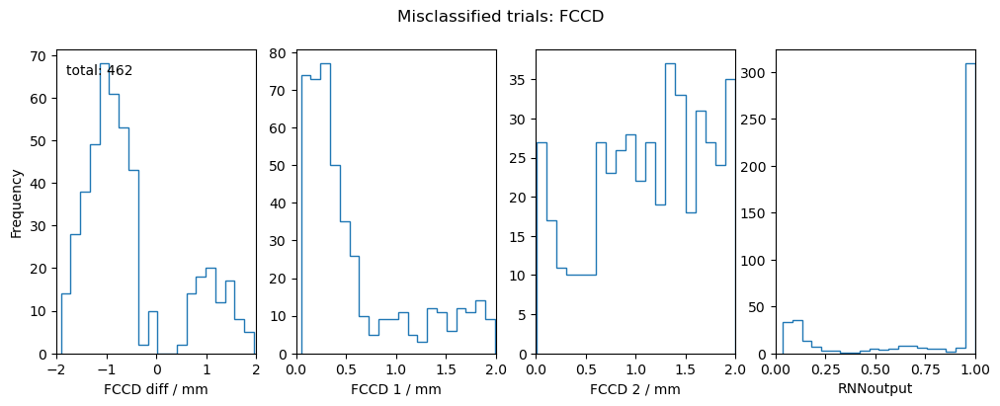

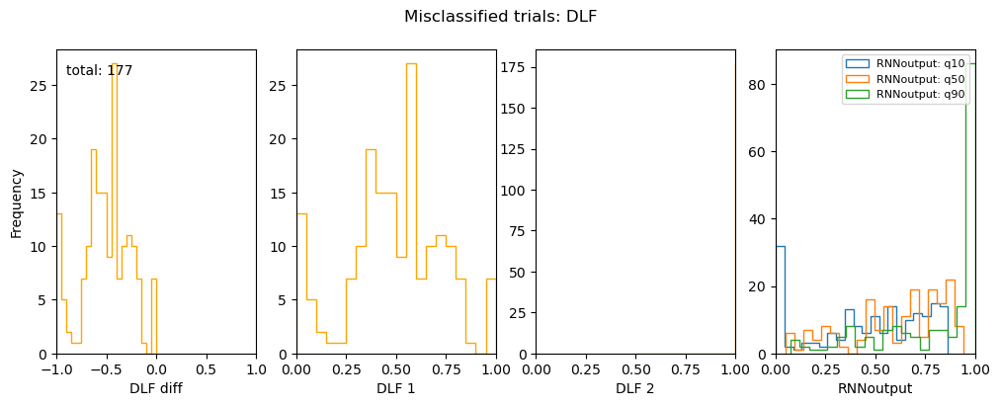

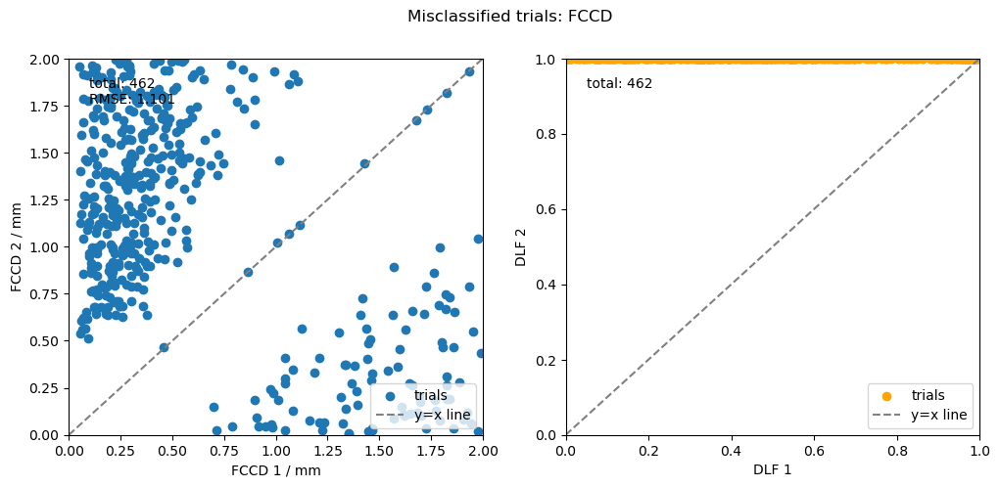

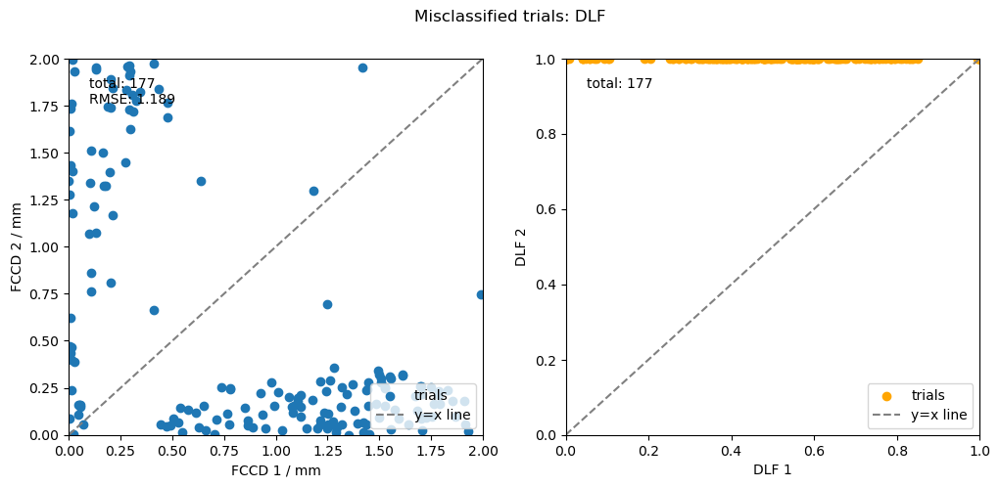

In [33]:
test_RNN(RNNclassifier_maxFCCDdiff0_25mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

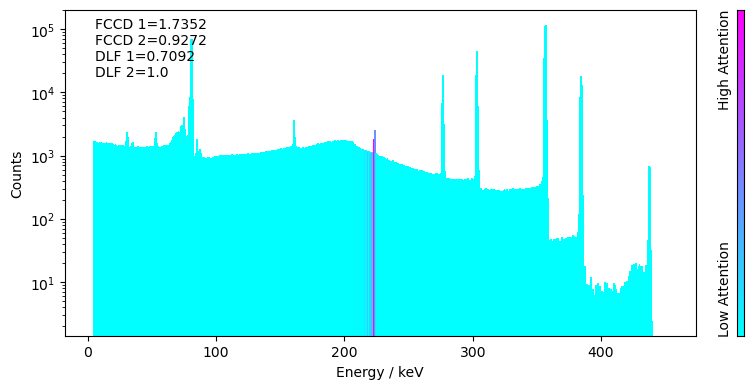

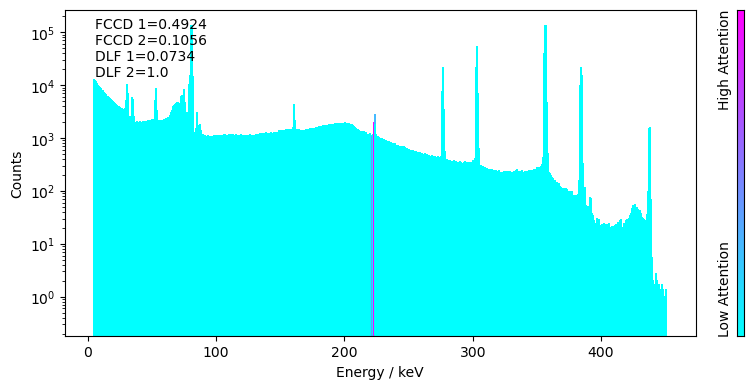

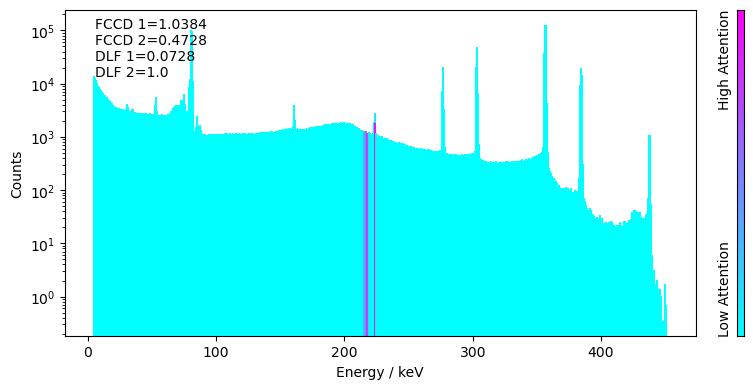

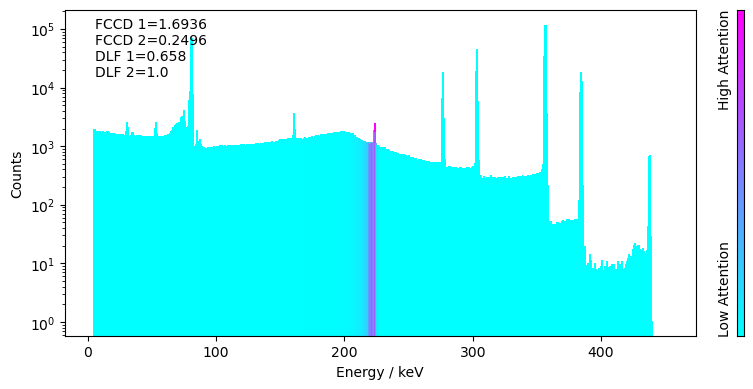

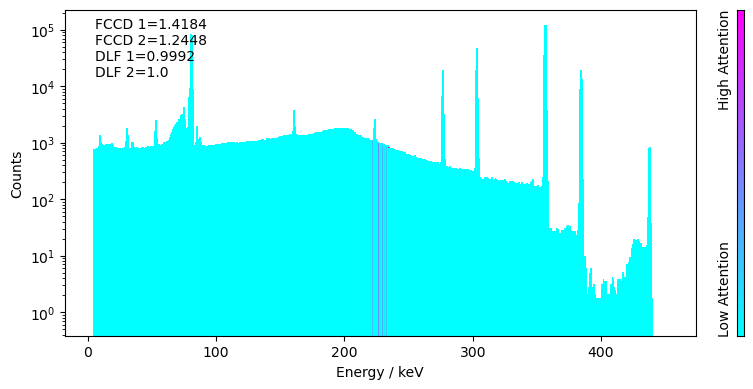

...

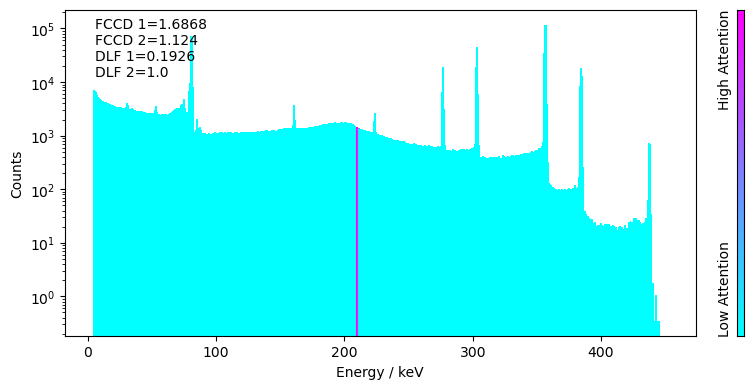

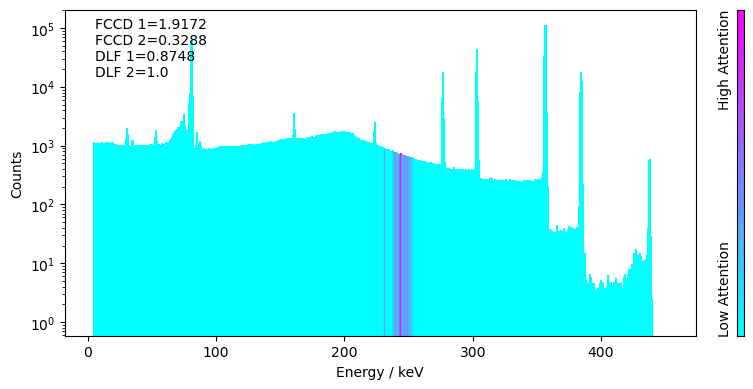

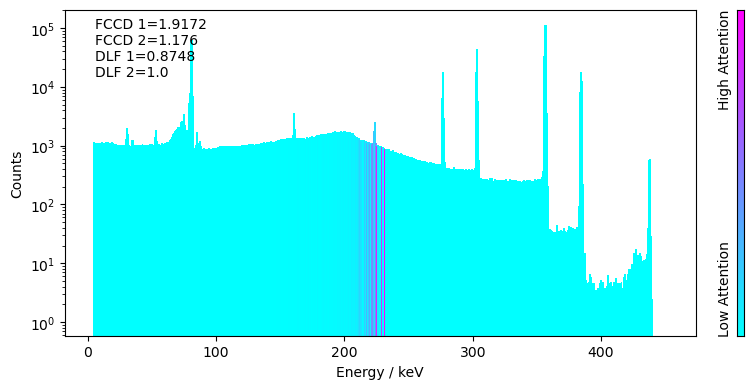

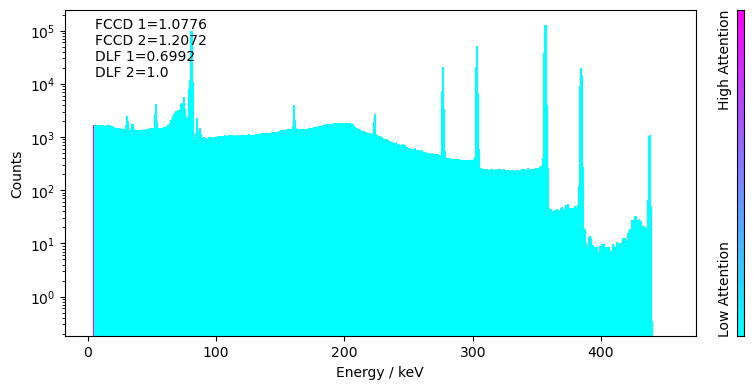

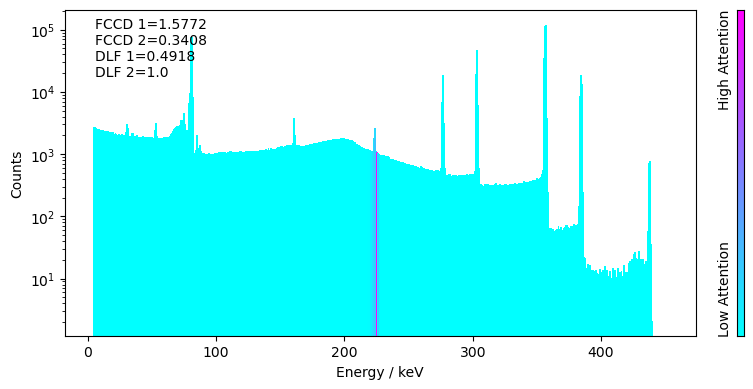

In [34]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.91it/s]


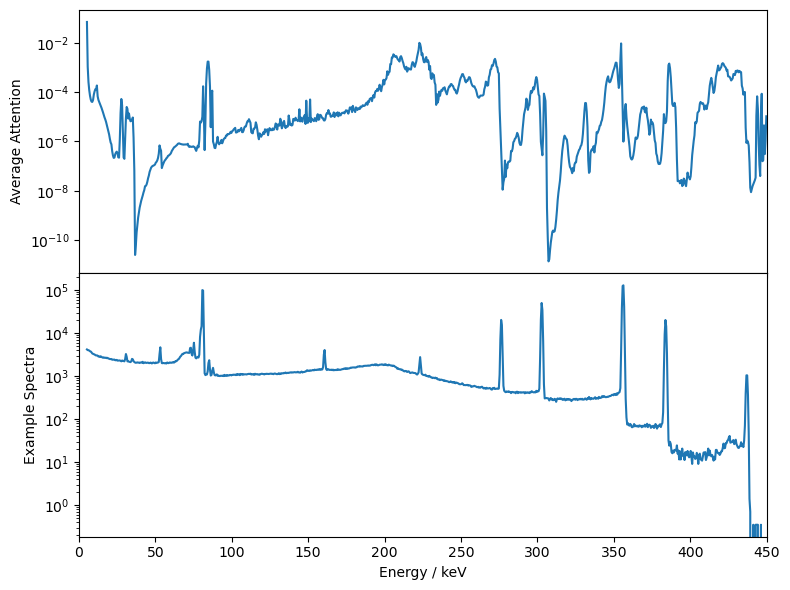

In [35]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)

# TRAINING 4: restircted dataset - Max FCCD diff = 0.1 mm

In [36]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.1
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxfccddiff = 0.1 mm

In [37]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly)


100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:23<00:00, 210.83it/s]


(4908, 890)


In [38]:
# Load saved model
RNNclassifier_maxFCCDdiff0_1mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_1mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_1mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.72it/s]


FCCD accuracies: 
total:  3000
TP:  1508
FP:  165
TN:  1310
FN:  17
accuracy:  0.9393333333333334
precision:  0.9013747758517633
recall:  0.9888524590163934

DLF accuracies: 
accuracy_DLF:  0.984

roc auc FCCD:  0.9952693525979438

Total # misclassified trials FCCD:  182  / 3000
Total # misclassified trials DLF:  48  / 3000


{'accuracy_FCCD': 0.9393333333333334,
 'precision_FCCD': 0.9013747758517633,
 'recall_FCCD': 0.9888524590163934,
 'accuracy_DLF': 0.984,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9952693525979438,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.02442592749653397,
  'RMSE_DLFmisclassified_FCCD': 0.05119160087358082,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 182,
  'NoMisclassifiedDLF': 48}}

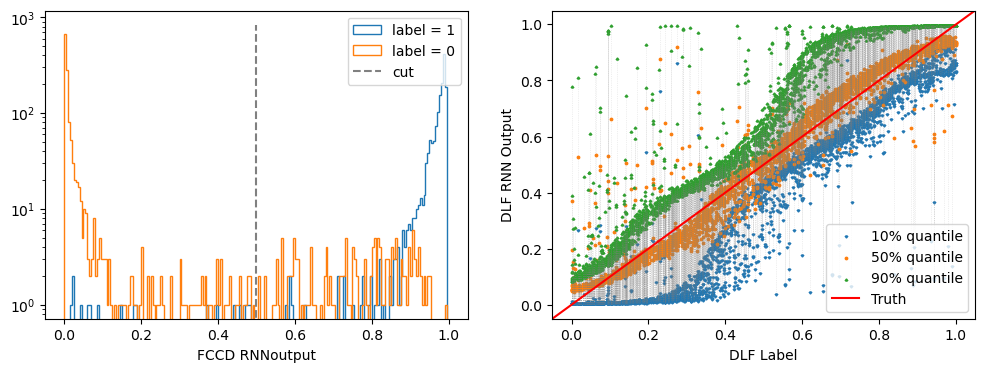

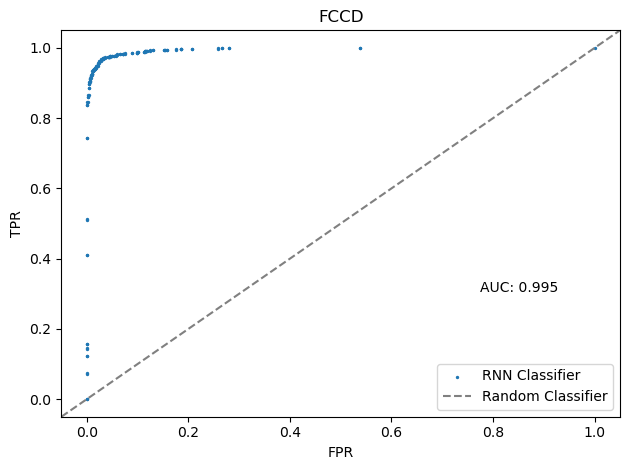

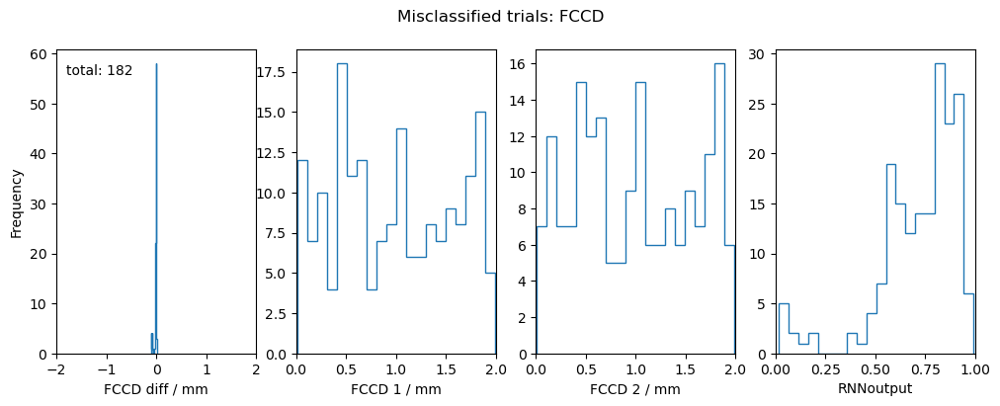

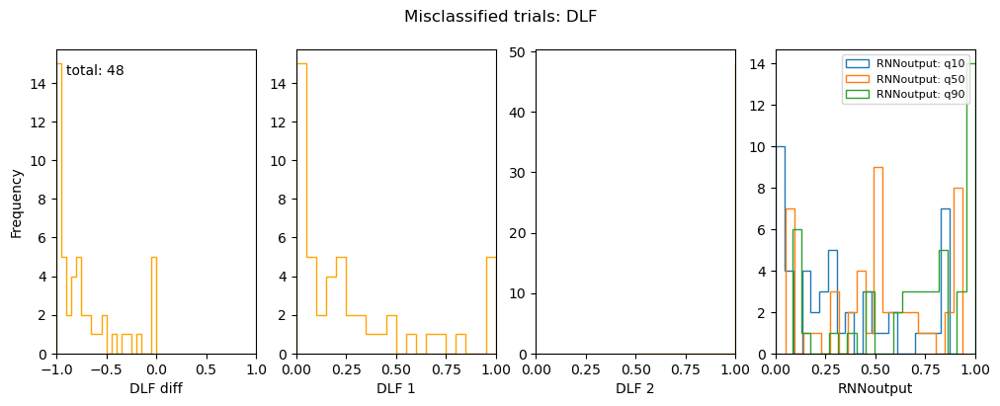

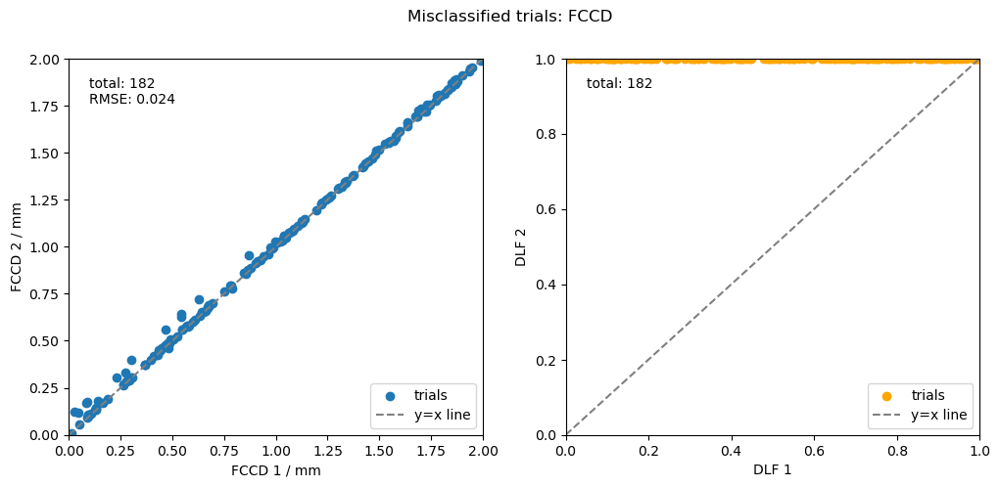

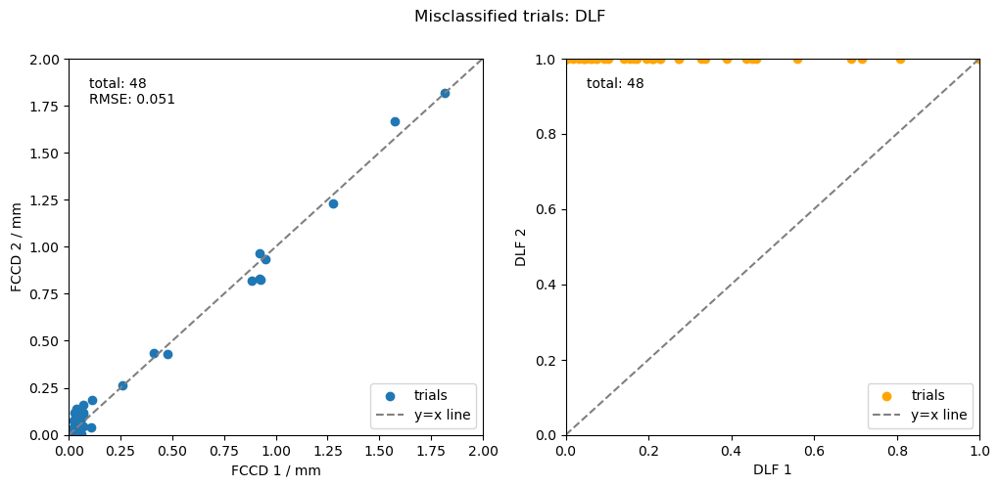

In [39]:
test_RNN(RNNclassifier_maxFCCDdiff0_1mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

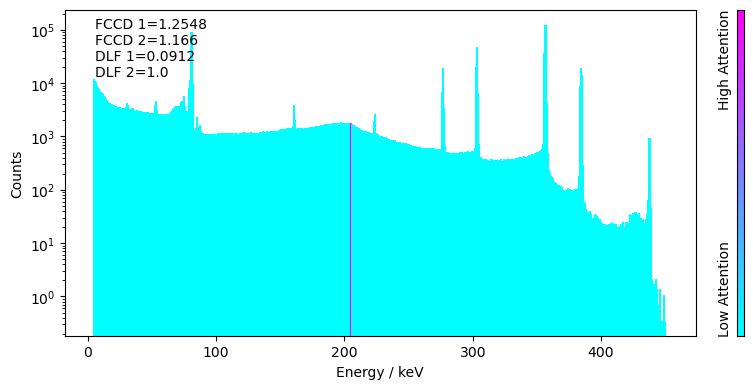

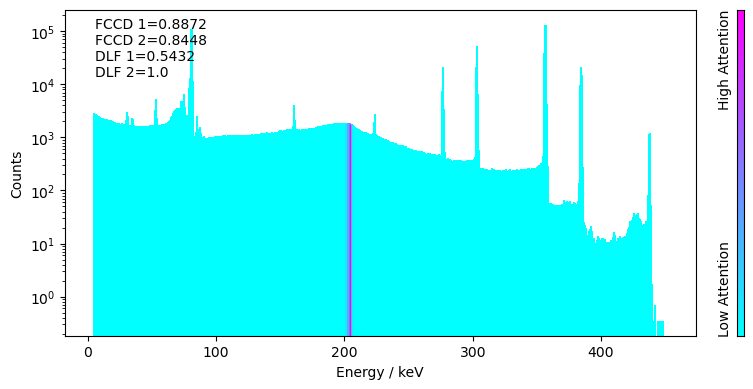

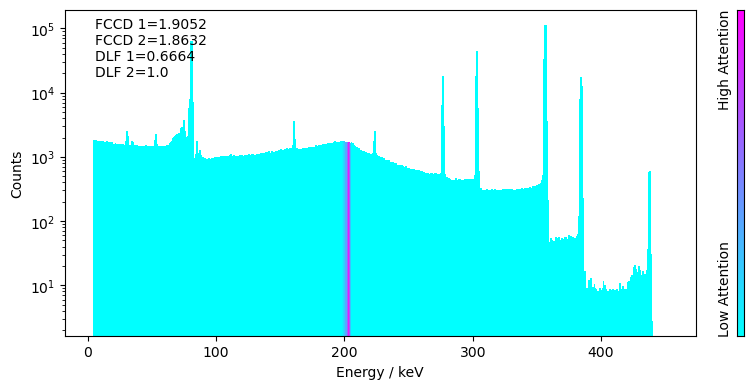

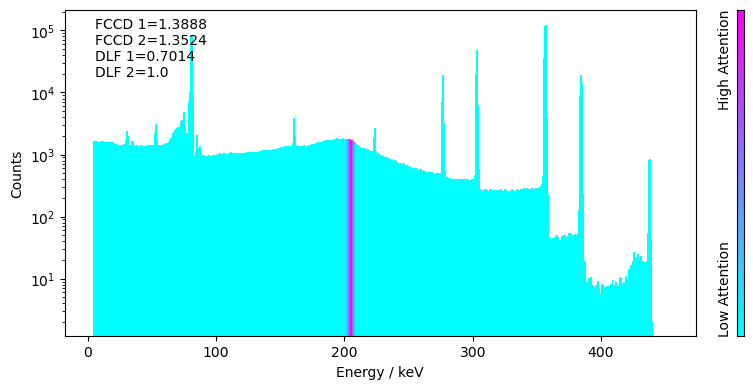

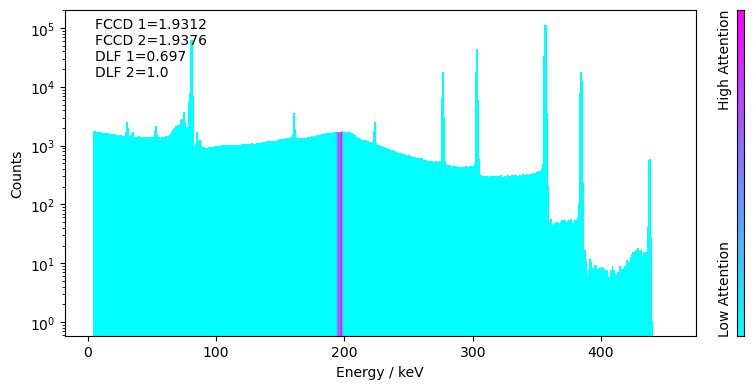

...

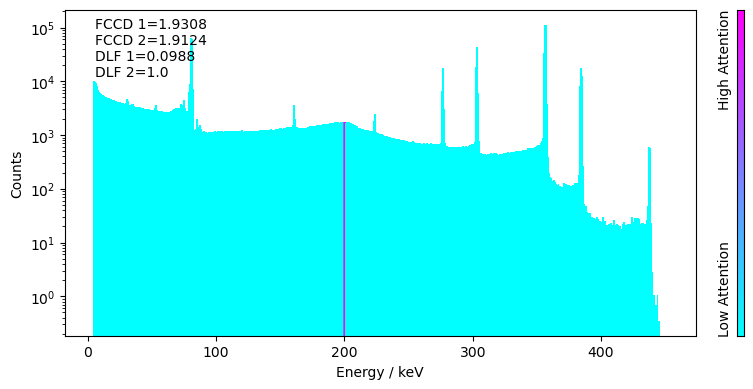

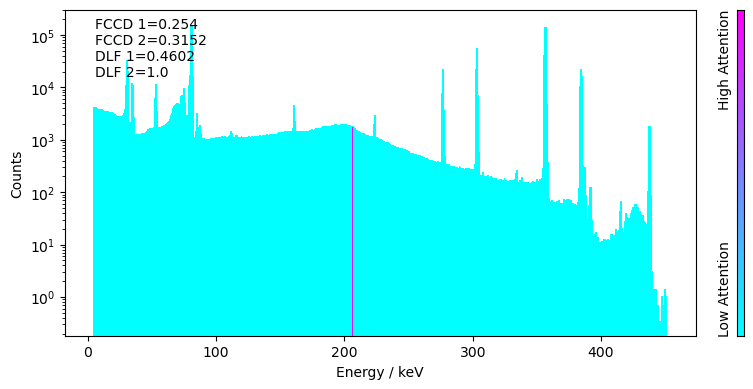

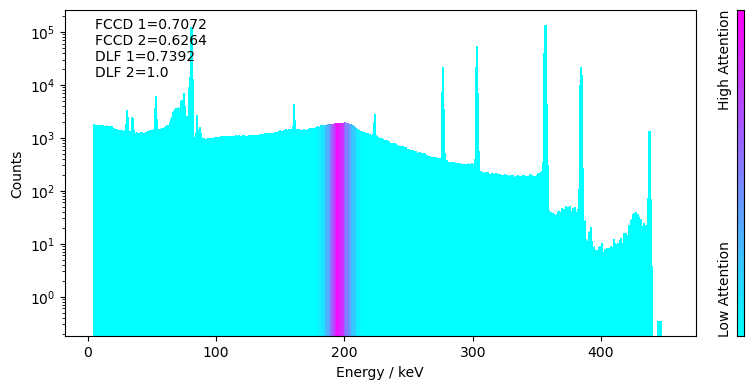

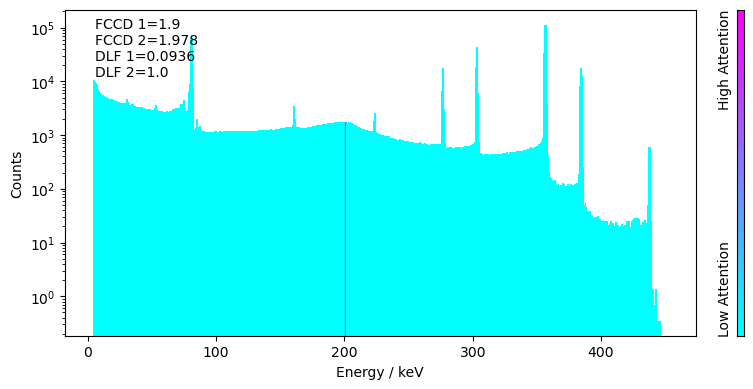

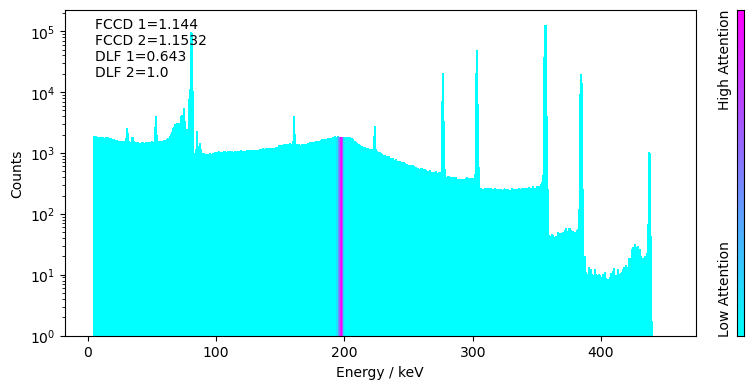

In [40]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.73it/s]


saved average attention to csv file


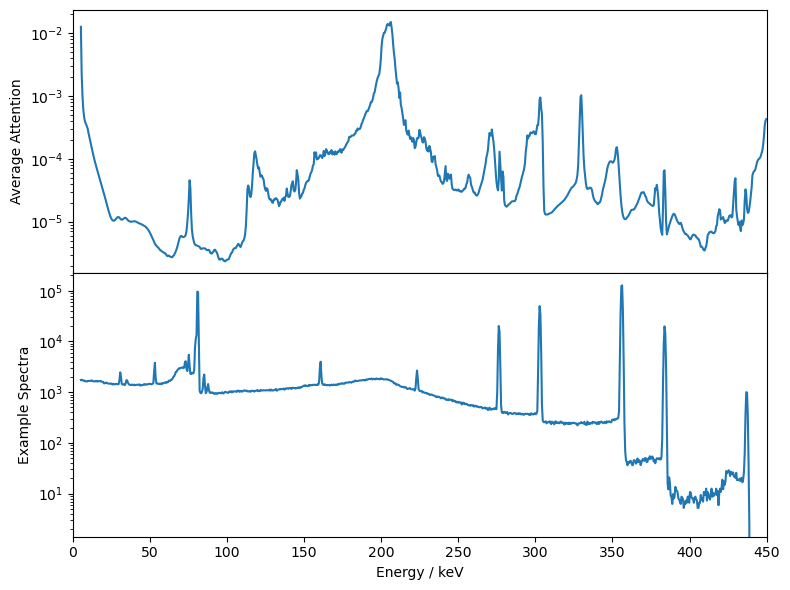

In [41]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)

## Testing on full dataset

In [42]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:27<00:00, 180.68it/s]

(4908, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.73it/s]


FCCD accuracies: 
total:  3000
TP:  1391
FP:  775
TN:  755
FN:  79
accuracy:  0.7153333333333334
precision:  0.6421975992613111
recall:  0.9462585034013605

DLF accuracies: 
accuracy_DLF:  0.89

roc auc FCCD:  0.6532135076252723

Total # misclassified trials FCCD:  854  / 3000
Total # misclassified trials DLF:  330  / 3000


{'accuracy_FCCD': 0.7153333333333334,
 'precision_FCCD': 0.6421975992613111,
 'recall_FCCD': 0.9462585034013605,
 'accuracy_DLF': 0.89,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.6532135076252723,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 1.0727603336670597,
  'RMSE_DLFmisclassified_FCCD': 1.0735110264355872,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 854,
  'NoMisclassifiedDLF': 330}}

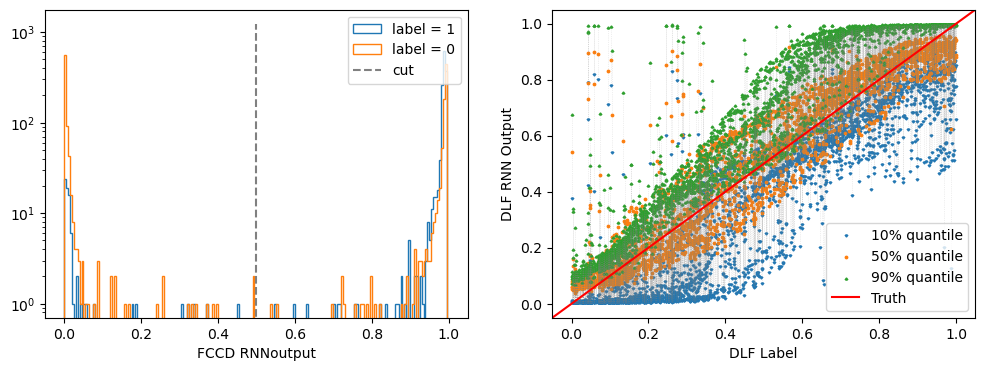

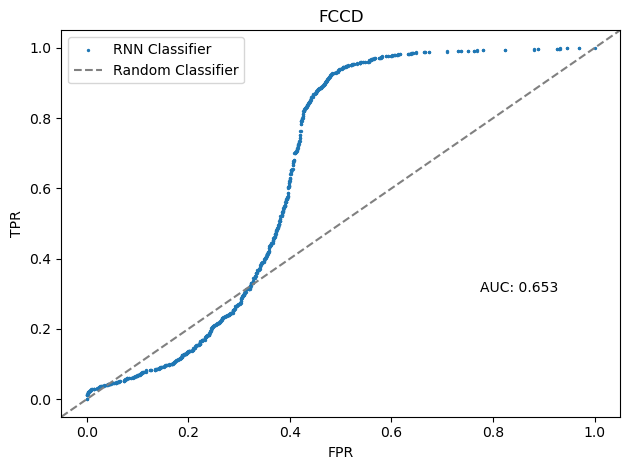

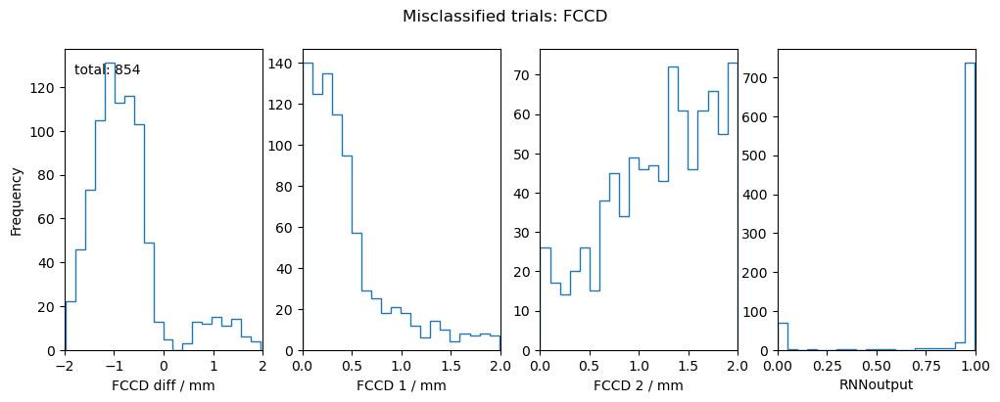

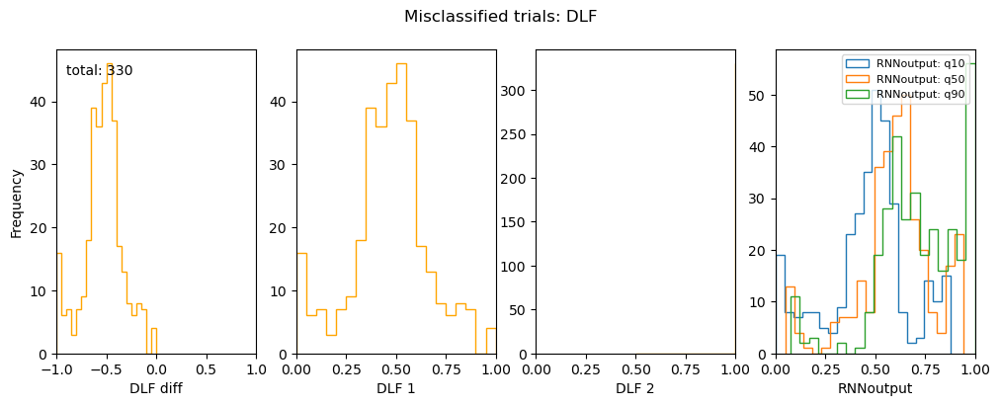

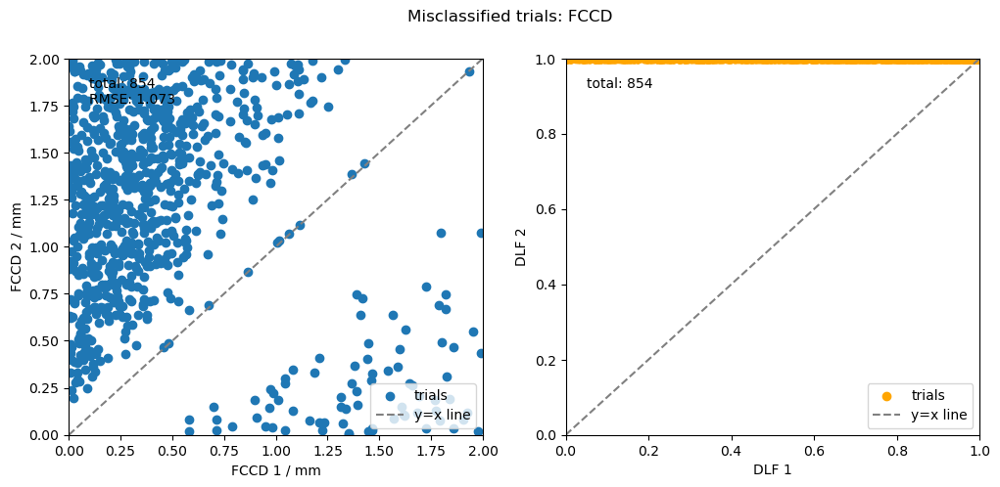

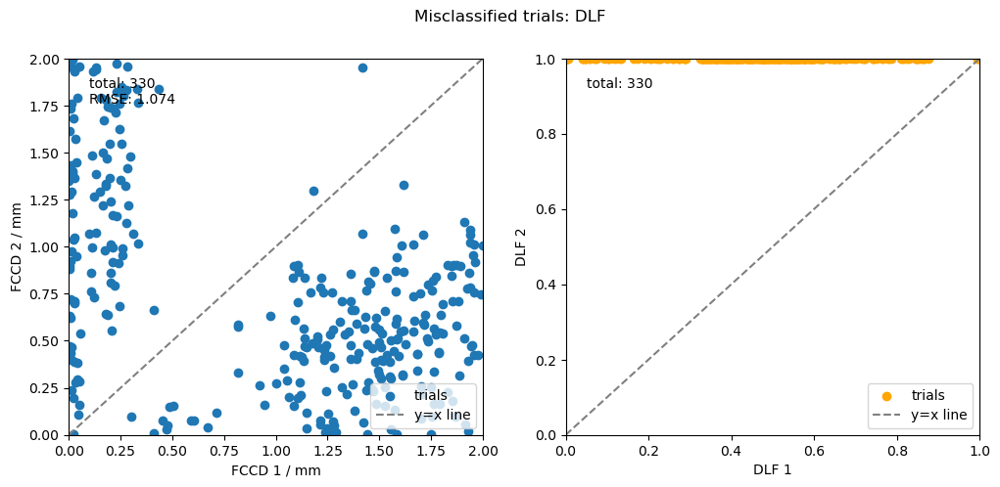

In [43]:
test_RNN(RNNclassifier_maxFCCDdiff0_1mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

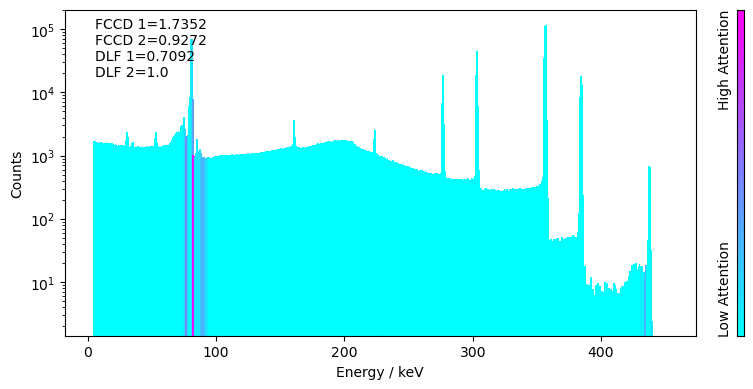

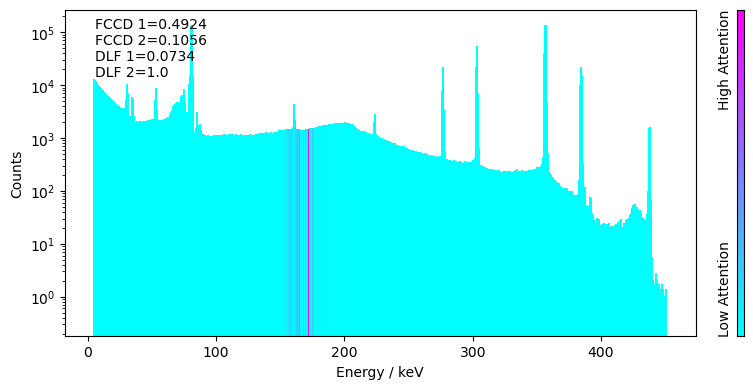

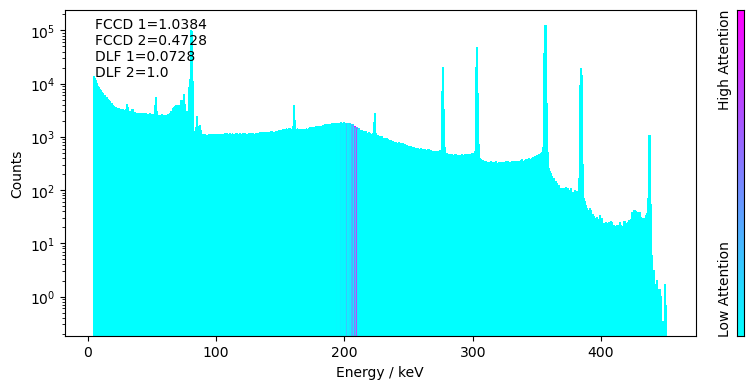

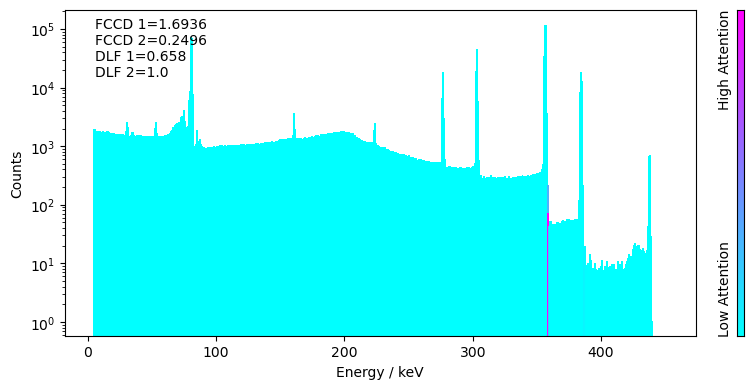

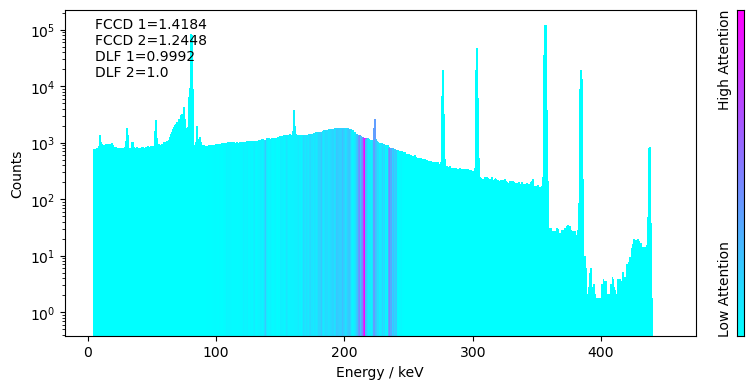

...

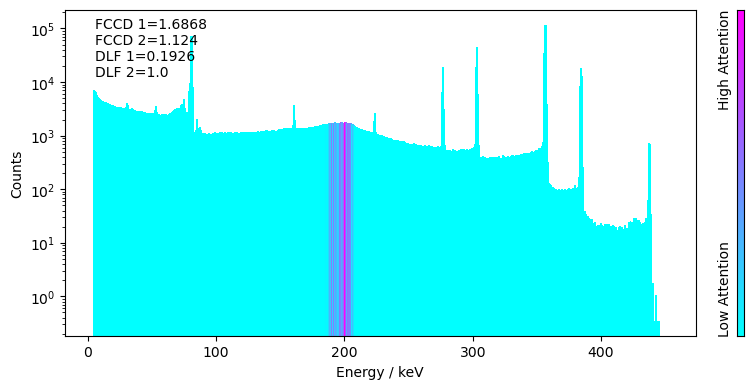

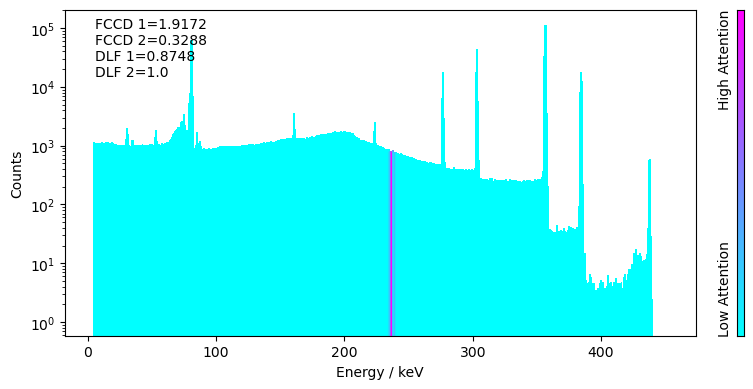

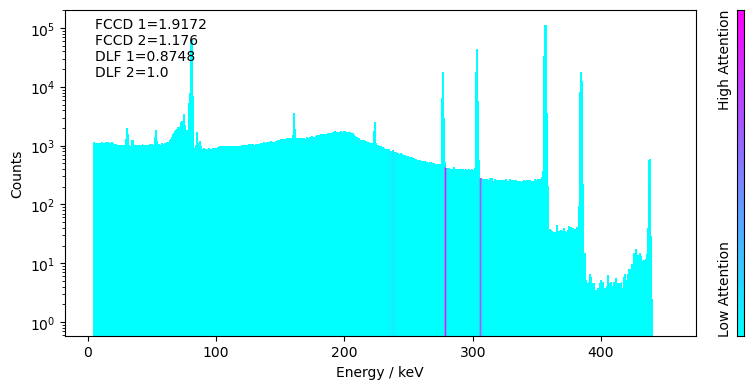

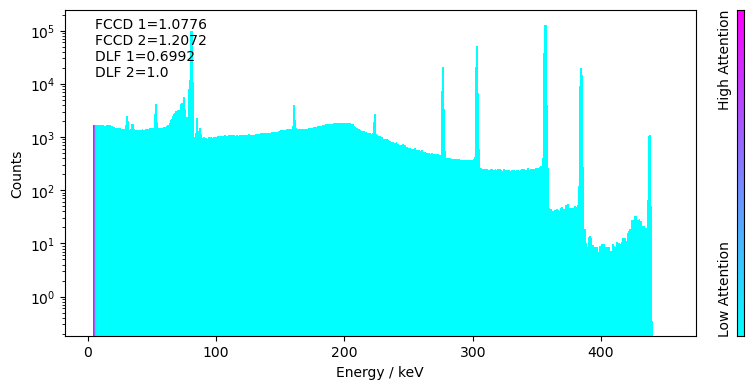

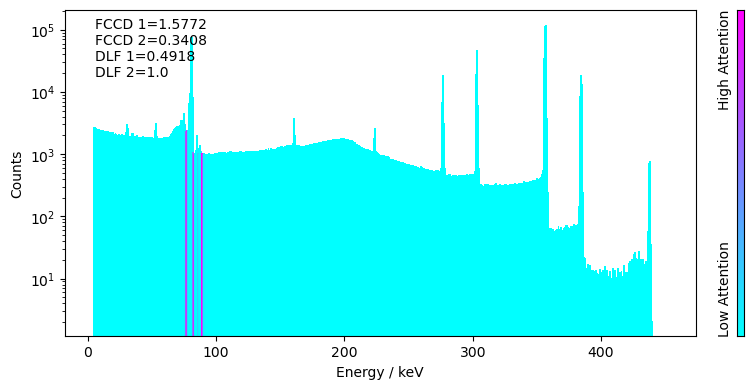

In [44]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.73it/s]


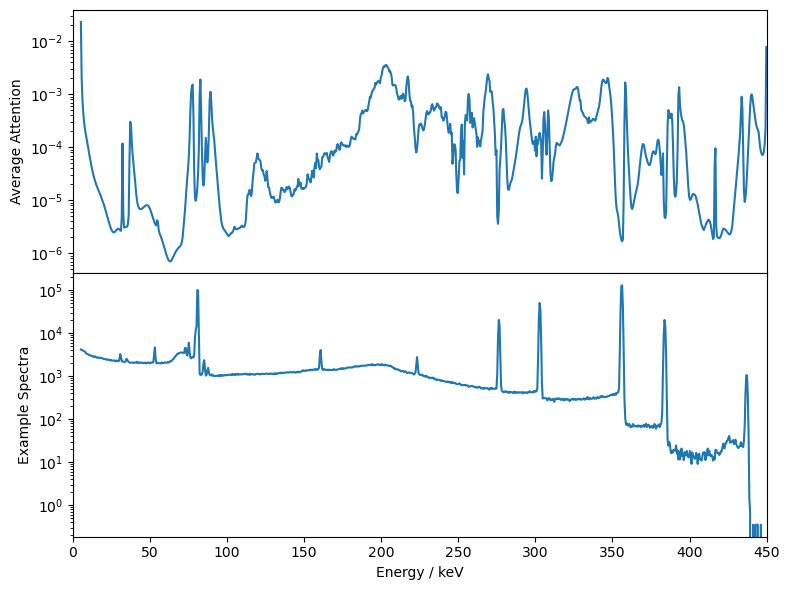

In [45]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)

# TRAINING 5: restircted dataset - Max FCCD diff = 0.05 mm

In [46]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.05
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxfccddiff =0.05 mm

In [47]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:27<00:00, 178.12it/s]


(4908, 890)


In [48]:
# Load saved model
RNNclassifier_maxFCCDdiff0_05mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_05mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_05mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.83it/s]


FCCD accuracies: 
total:  3000
TP:  1474
FP:  158
TN:  1343
FN:  25
accuracy:  0.939
precision:  0.9031862745098039
recall:  0.9833222148098733

DLF accuracies: 
accuracy_DLF:  0.98

roc auc FCCD:  0.9918426630411835

Total # misclassified trials FCCD:  183  / 3000
Total # misclassified trials DLF:  60  / 3000


{'accuracy_FCCD': 0.939,
 'precision_FCCD': 0.9031862745098039,
 'recall_FCCD': 0.9833222148098733,
 'accuracy_DLF': 0.98,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.9918426630411835,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.006923911210297792,
  'RMSE_DLFmisclassified_FCCD': 0.025362544562142555,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 183,
  'NoMisclassifiedDLF': 60}}

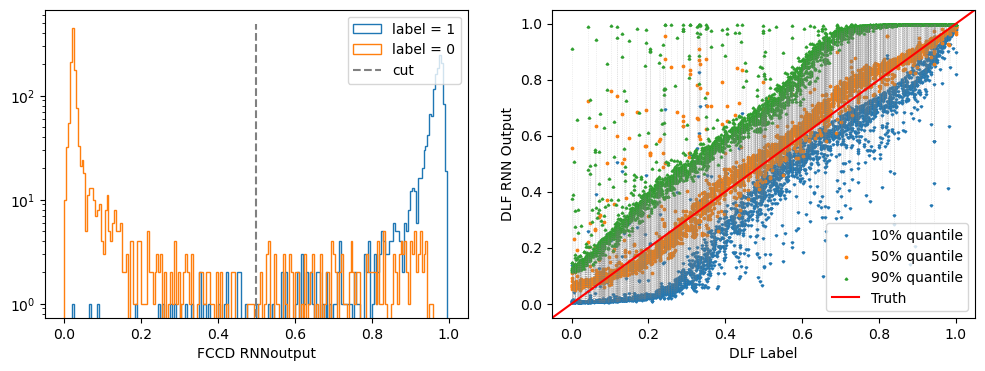

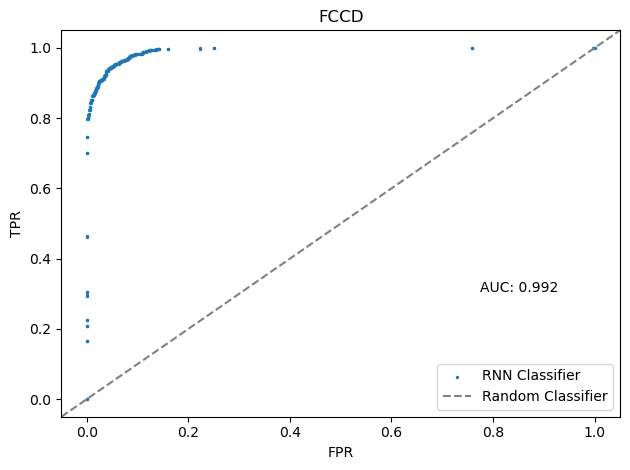

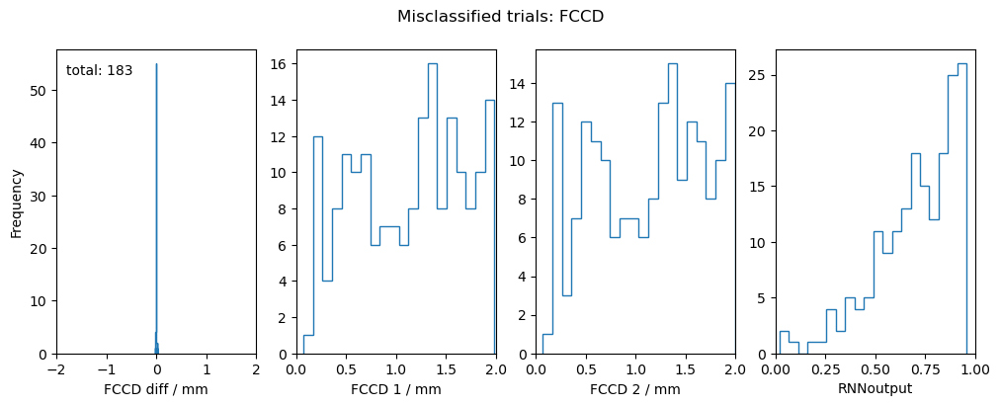

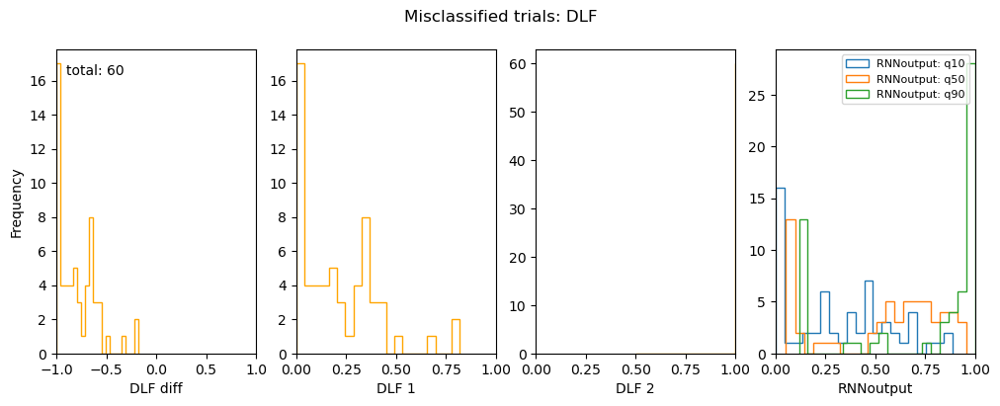

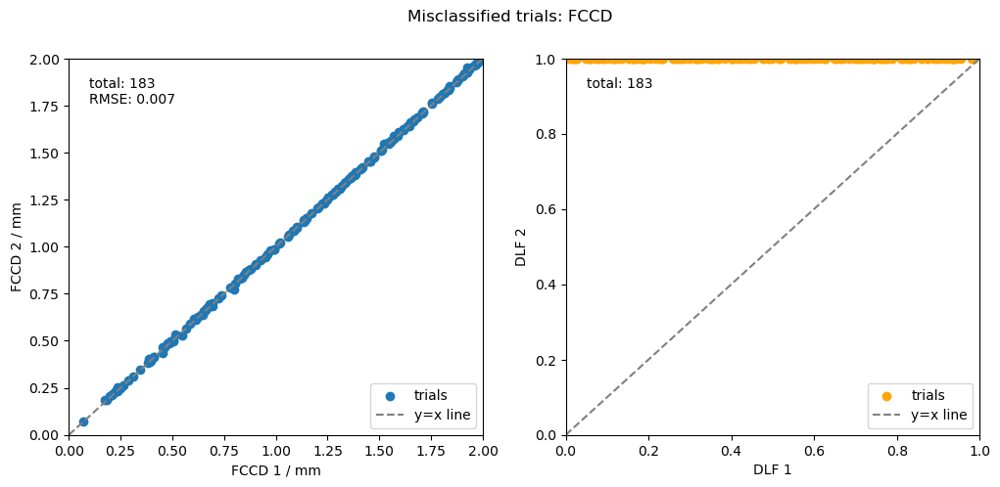

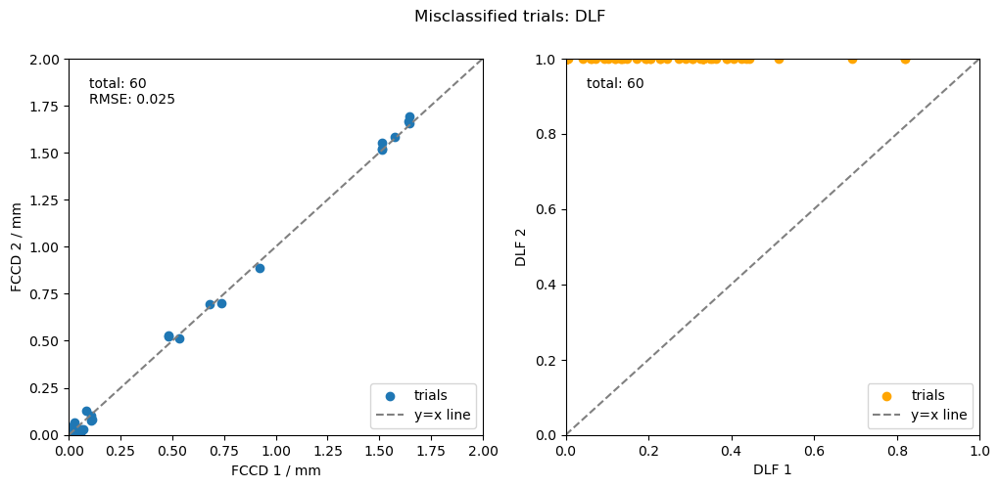

In [49]:
test_RNN(RNNclassifier_maxFCCDdiff0_05mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

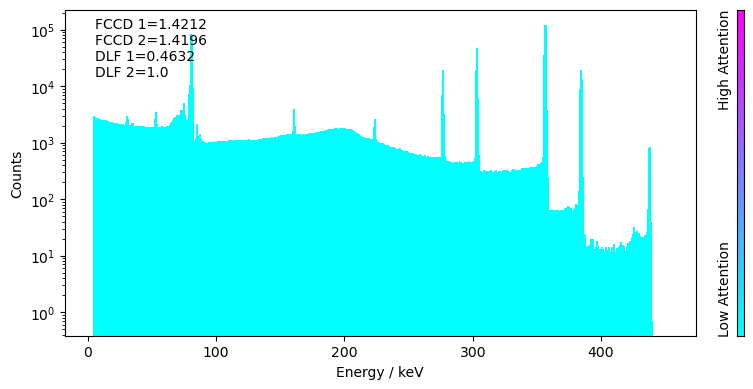

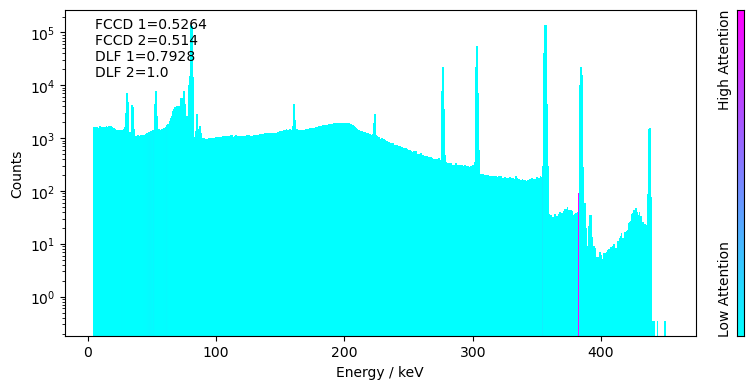

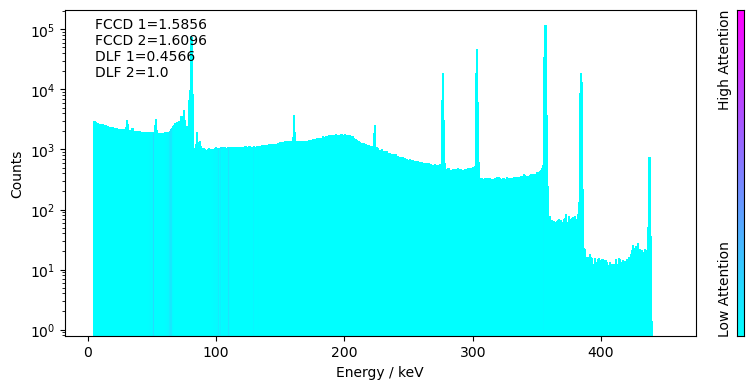

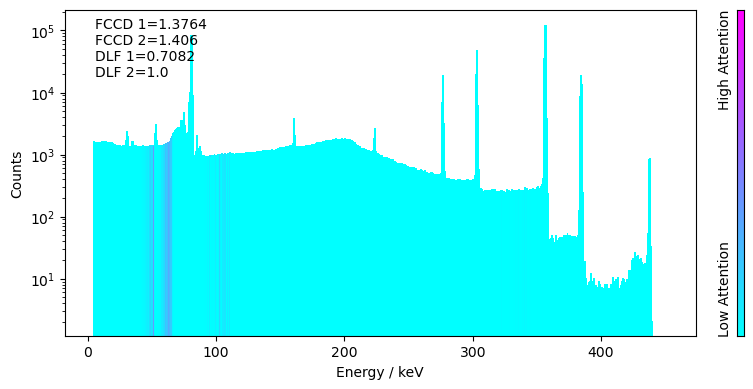

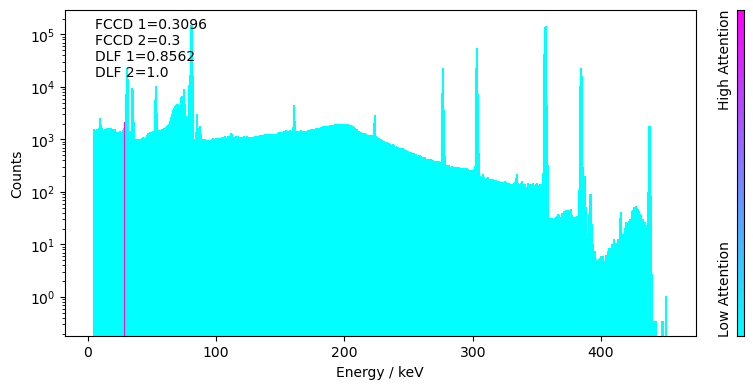

...

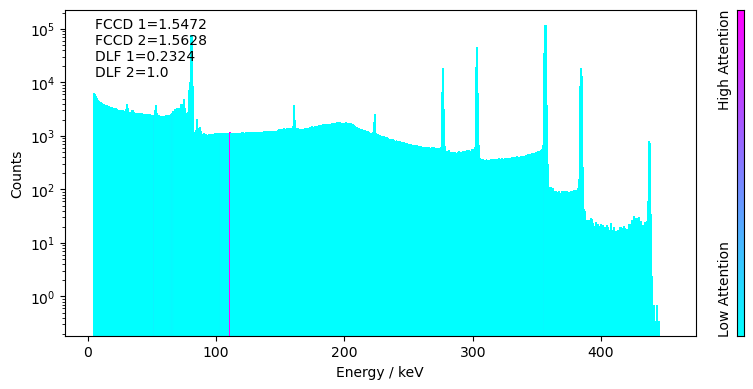

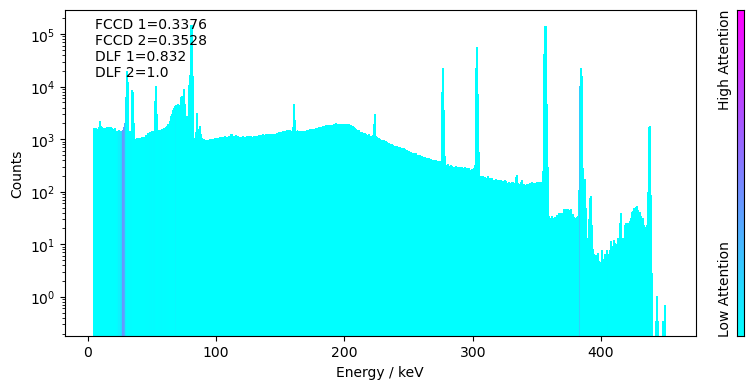

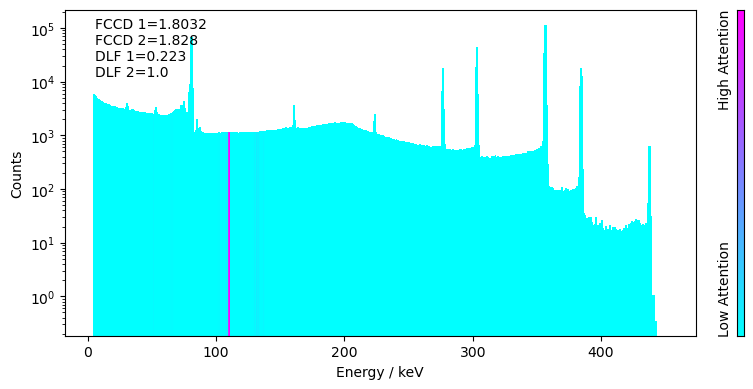

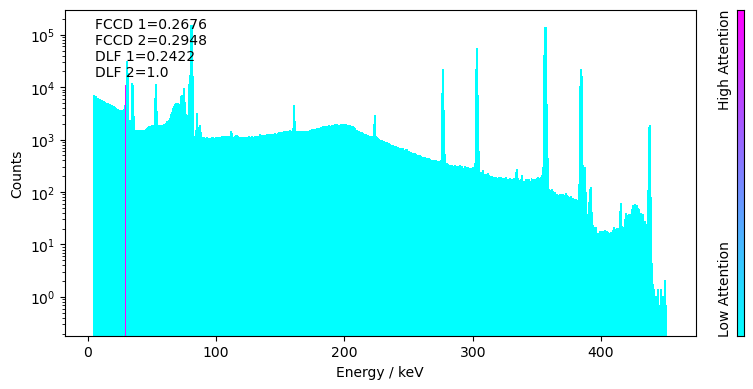

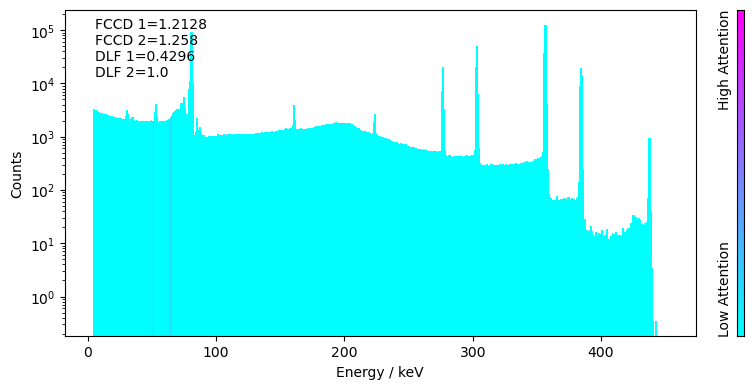

In [50]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:07<00:00, 11.12it/s]


saved average attention to csv file


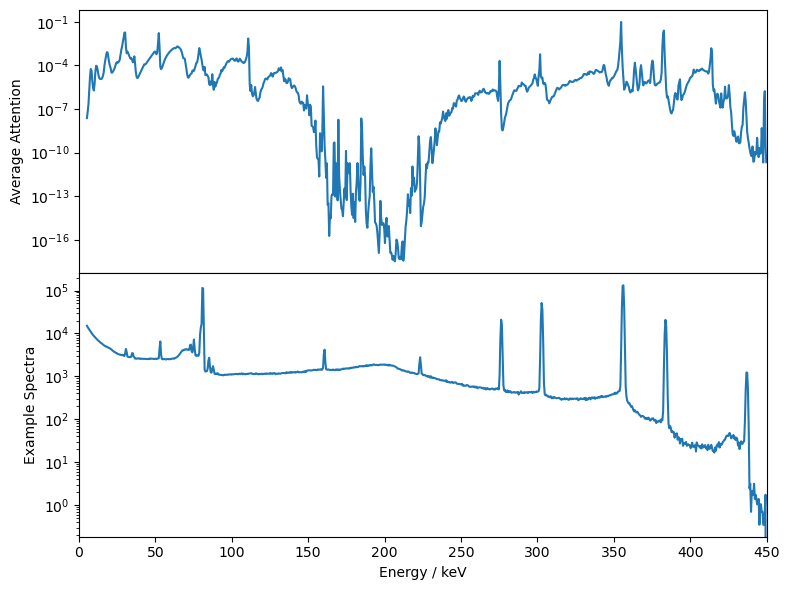

In [51]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)

## Testing - on full dataset

In [52]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:26<00:00, 185.43it/s]


(4908, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:10<00:00, 10.70it/s]


FCCD accuracies: 
total:  3000
TP:  1190
FP:  20
TN:  1510
FN:  280
accuracy:  0.9
precision:  0.9834710743801653
recall:  0.8095238095238095

DLF accuracies: 
accuracy_DLF:  0.9723333333333334

roc auc FCCD:  0.8849775465741853

Total # misclassified trials FCCD:  300  / 3000
Total # misclassified trials DLF:  83  / 3000


{'accuracy_FCCD': 0.9,
 'precision_FCCD': 0.9834710743801653,
 'recall_FCCD': 0.8095238095238095,
 'accuracy_DLF': 0.9723333333333334,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.8849775465741853,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 1.1023984013050818,
  'RMSE_DLFmisclassified_FCCD': 1.1952813443069348,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 300,
  'NoMisclassifiedDLF': 83}}

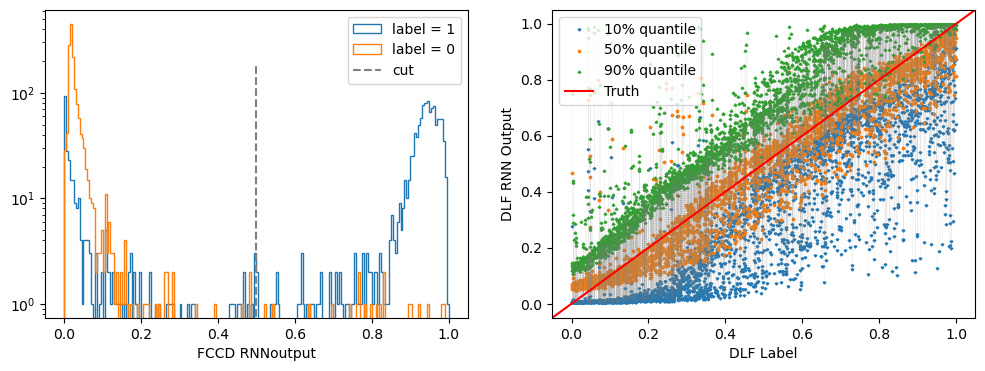

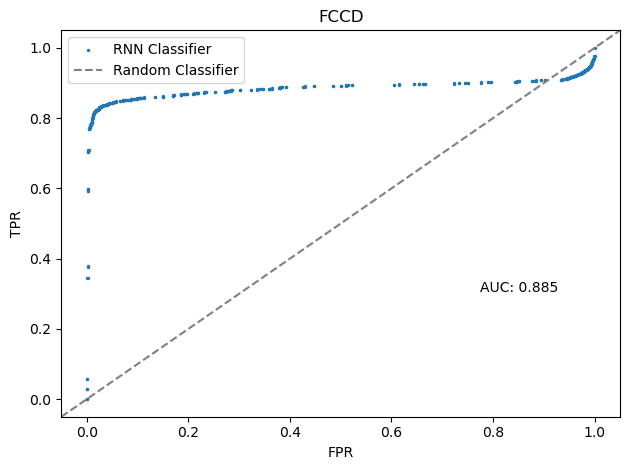

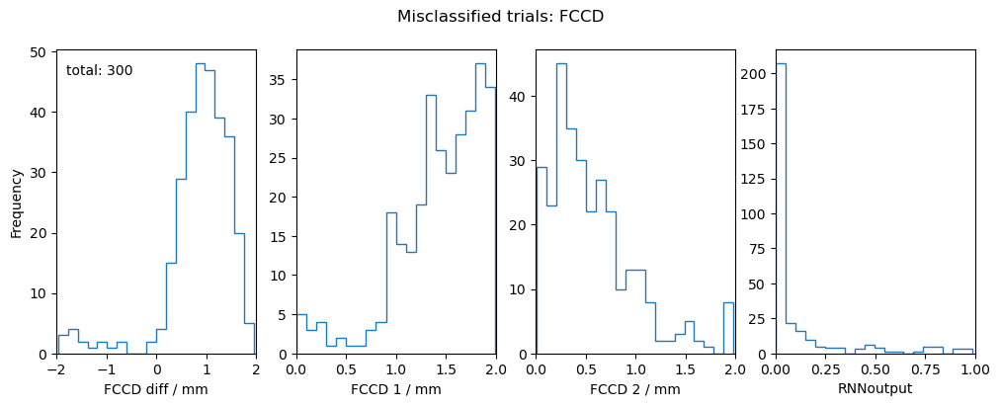

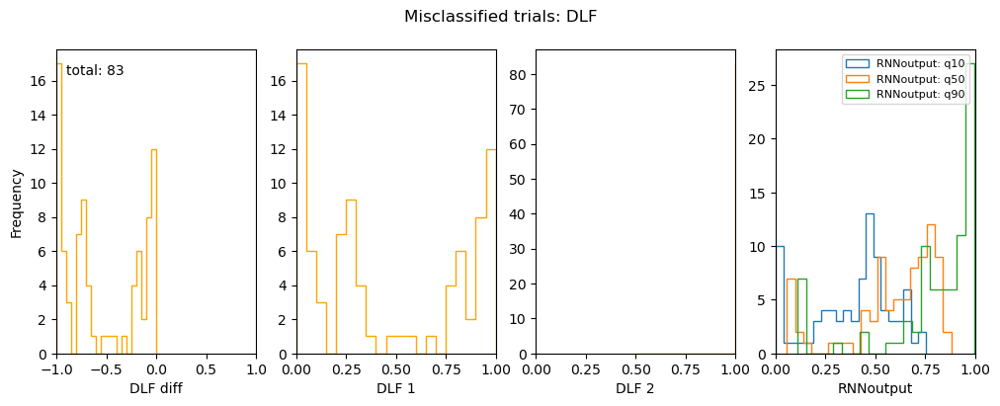

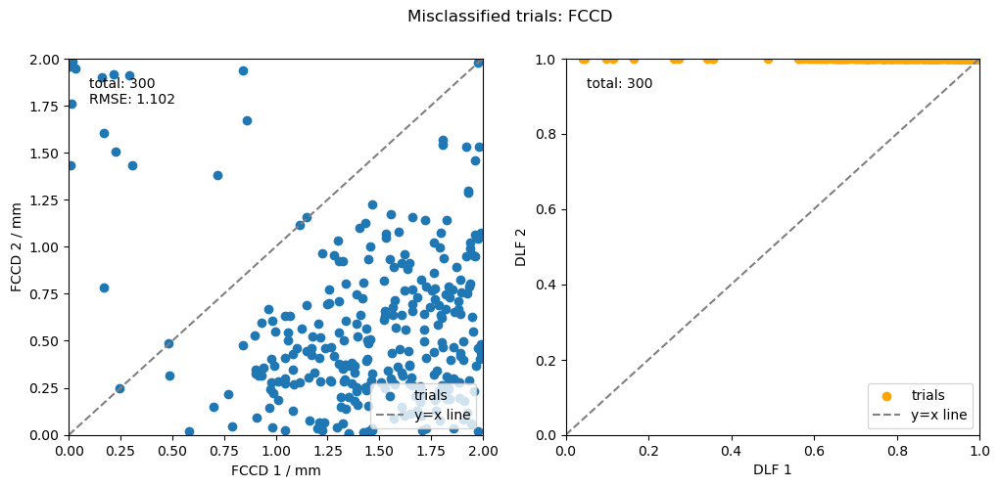

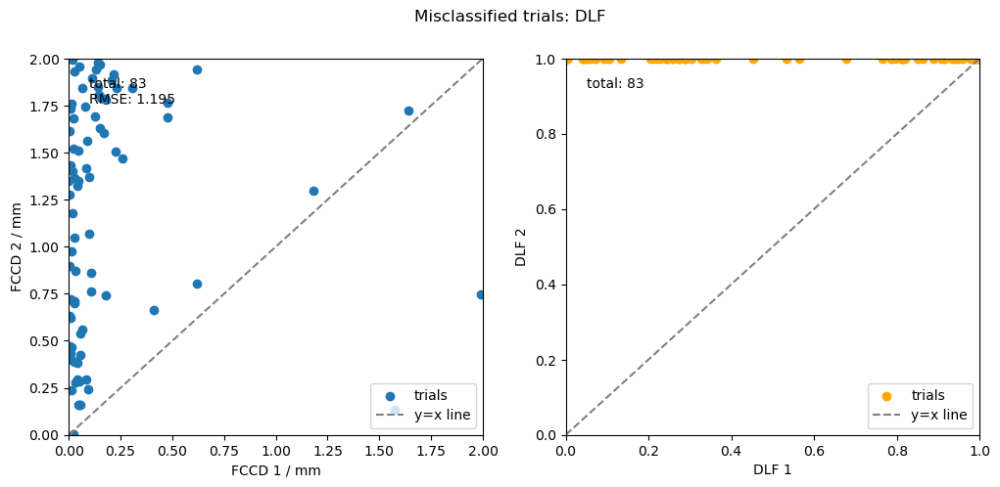

In [53]:
test_RNN(RNNclassifier_maxFCCDdiff0_05mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

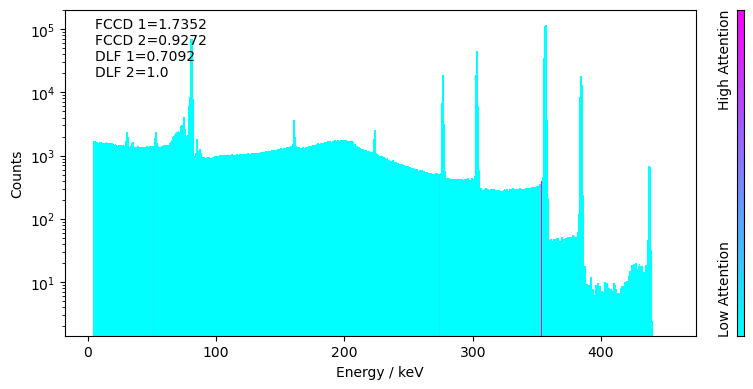

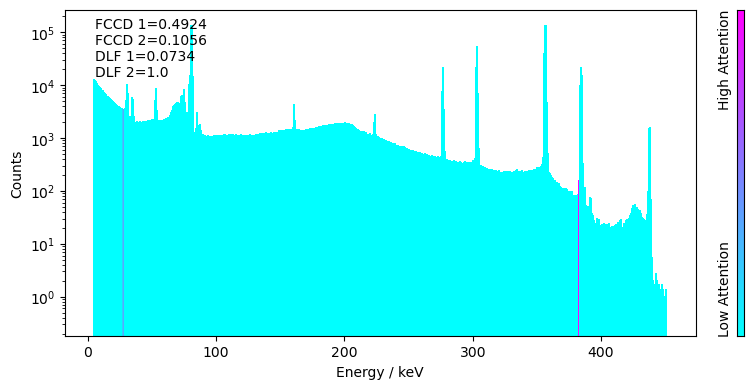

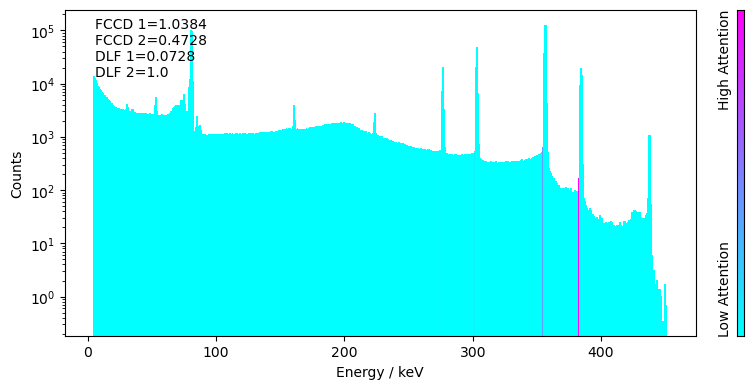

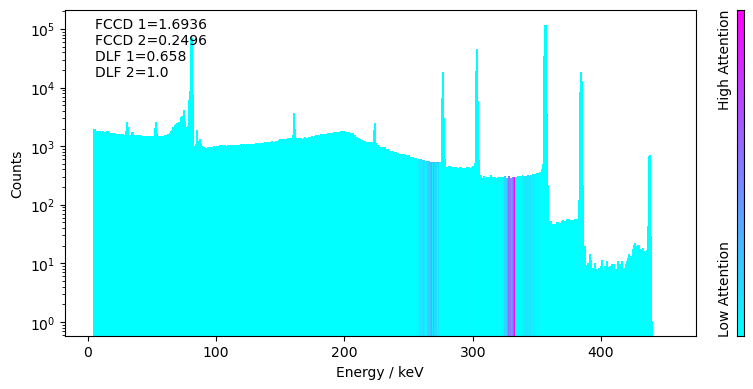

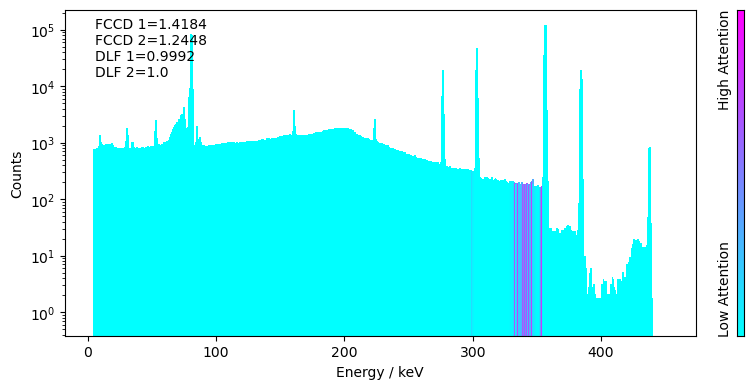

...

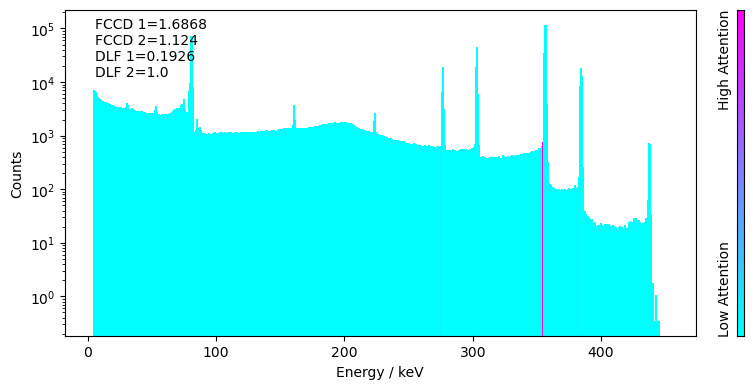

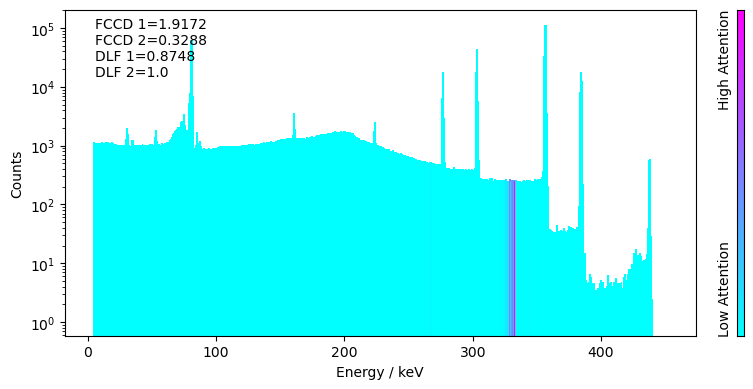

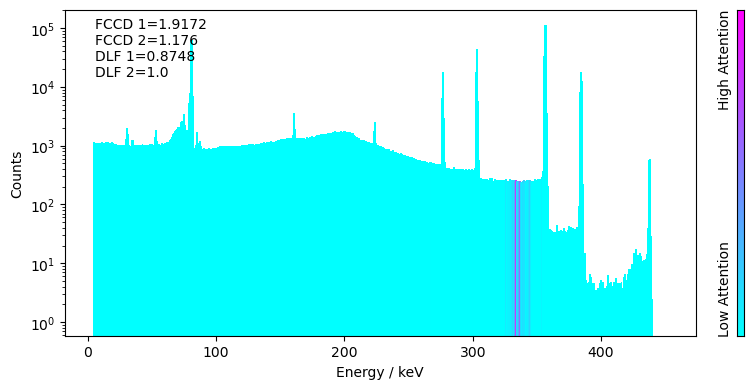

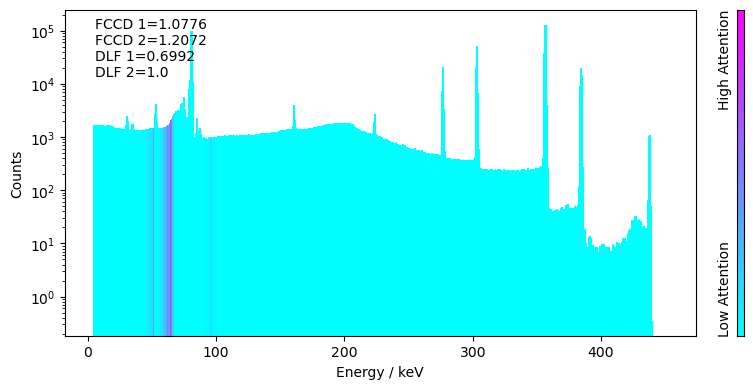

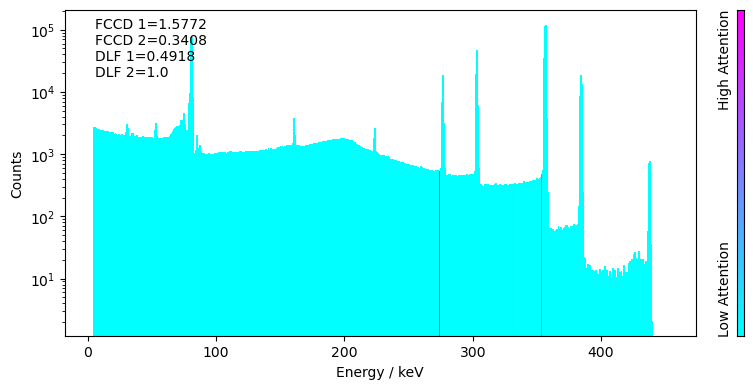

In [54]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:09<00:00, 10.76it/s]


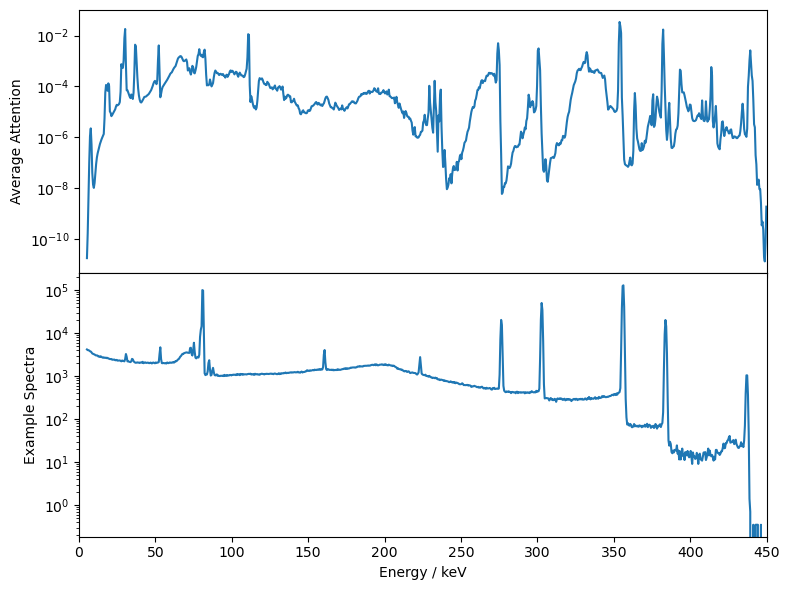

In [55]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)

# TRAINING 6: restircted dataset - Max FCCD diff = 0.01 mm

In [56]:
NUM_EPOCHS = 20 #can try increasing
LEARNING_RATE = 0.005 #0.01 #try modifying learning rate #0.001 too low for 30 epochs, 0.01 may be too high
dataset_size = 10000 #10000
maxFCCDdiff = 0.01
maxDLFdiff = 1.0 #i.e. no restriction
RNN_ID ="RNN_MC2DLF1_"+str(NUM_EPOCHS)+"epochs_LR"+str(LEARNING_RATE)+"_maxFCCDdiff"+str(maxFCCDdiff)+"mm_"+str(dataset_size)+"trials"

#initialise directories to save
if not os.path.exists(CodePath+"/saved_models/"+RNN_ID+"/plots/"):
    os.makedirs(CodePath+"/saved_models/"+RNN_ID+"/plots/")

## Testing - on maxfccddiff =0.01 mm

In [57]:
#Load restricted dataset
BATCH_SIZE = 4 
restrict_dict = {"maxFCCDdiff": maxFCCDdiff, "maxDLFdiff": maxDLFdiff}
train_loader, test_loader, dataset = load_data(BATCH_SIZE, restrict_dataset=True, restrict_dict = restrict_dict, 
                                               size=dataset_size, path_MC2 = MC_PATH_FCCDonly)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:27<00:00, 180.59it/s]

(4908, 890)


In [58]:
# Load saved model
RNNclassifier_maxFCCDdiff0_01mm = RNN(dataset.get_histlen(),4)
model_path = CodePath+"/saved_models/"+RNN_ID+"/"+RNN_ID+".pkl"
RNNclassifier_maxFCCDdiff0_01mm.load_state_dict(torch.load(model_path))
RNNclassifier_maxFCCDdiff0_01mm.eval()

RNN(
  (RNNLayer): GRU(1, 256, num_layers=2, batch_first=True, dropout=0.2, bidirectional=True)
  (fcnet): FCNet(
    (fcnet): Sequential(
      (0): Linear(in_features=1024, out_features=256, bias=True)
      (1): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.01)
      (3): Dropout(p=0.2, inplace=False)
      (4): Linear(in_features=256, out_features=4, bias=True)
    )
  )
  (attention_weight): Linear(in_features=512, out_features=512, bias=False)
)

Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:10<00:00, 10.58it/s]


FCCD accuracies: 
total:  3000
TP:  801
FP:  376
TN:  1031
FN:  792
accuracy:  0.6106666666666667
precision:  0.6805437553101105
recall:  0.5028248587570622

DLF accuracies: 
accuracy_DLF:  0.9823333333333333

roc auc FCCD:  0.6794112122554656

Total # misclassified trials FCCD:  1168  / 3000
Total # misclassified trials DLF:  53  / 3000


{'accuracy_FCCD': 0.6106666666666667,
 'precision_FCCD': 0.6805437553101105,
 'recall_FCCD': 0.5028248587570622,
 'accuracy_DLF': 0.9823333333333333,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.6794112122554656,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 0.005403005252026379,
  'RMSE_DLFmisclassified_FCCD': 0.0046469304130953935,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 1168,
  'NoMisclassifiedDLF': 53}}

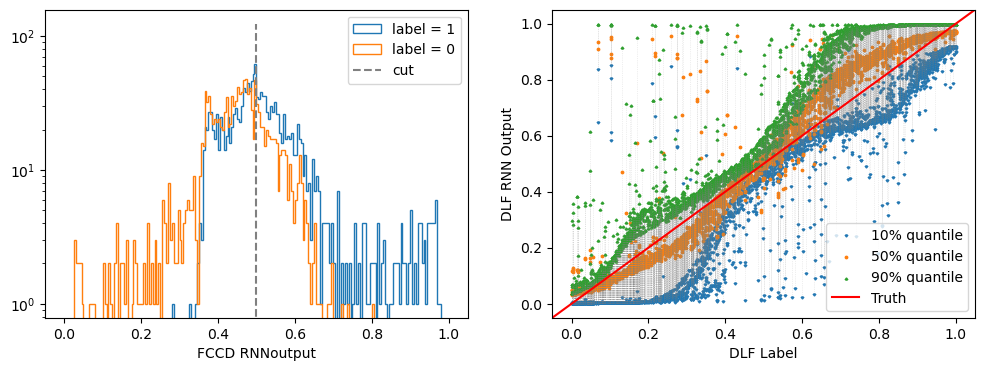

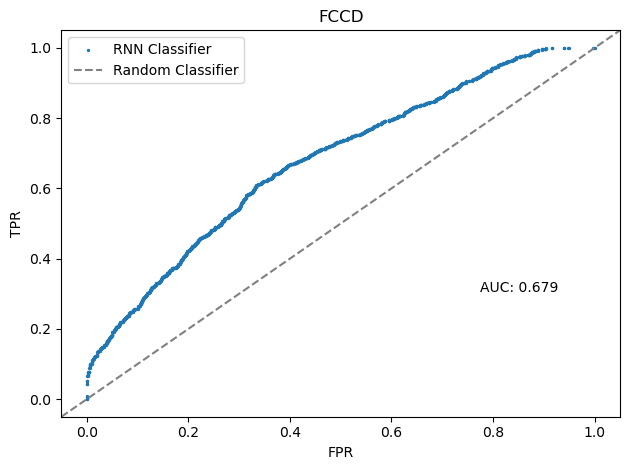

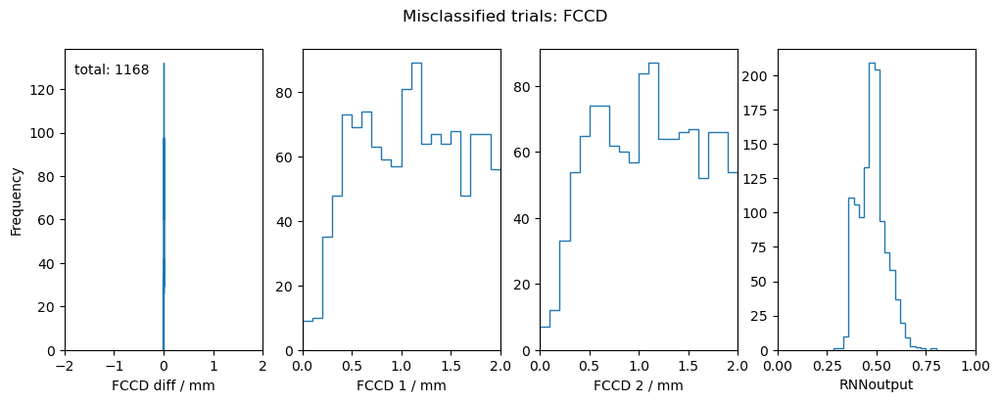

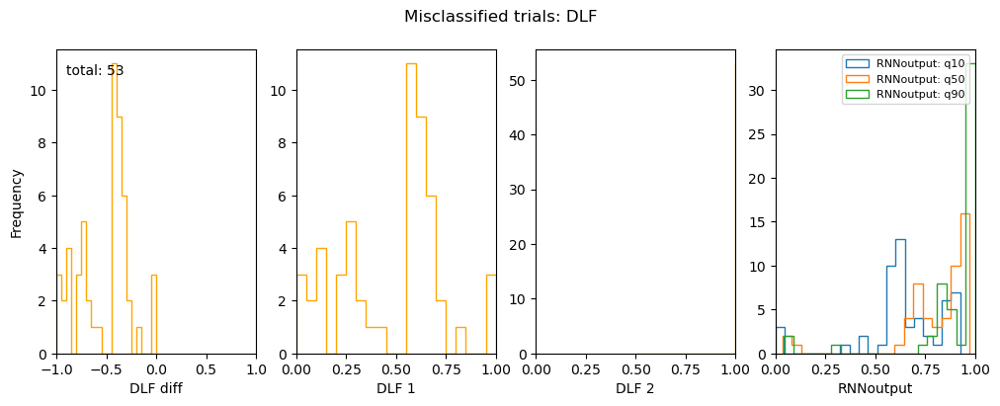

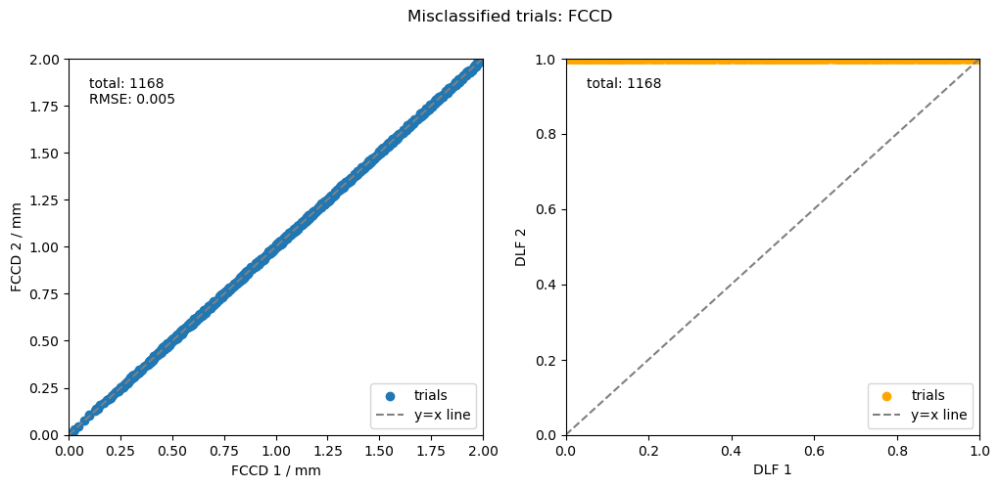

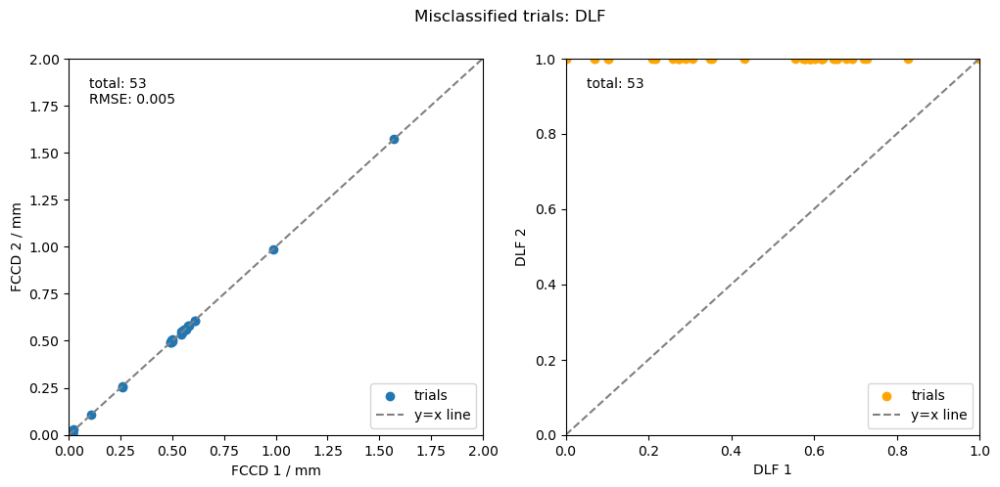

In [59]:
test_RNN(RNNclassifier_maxFCCDdiff0_01mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True)

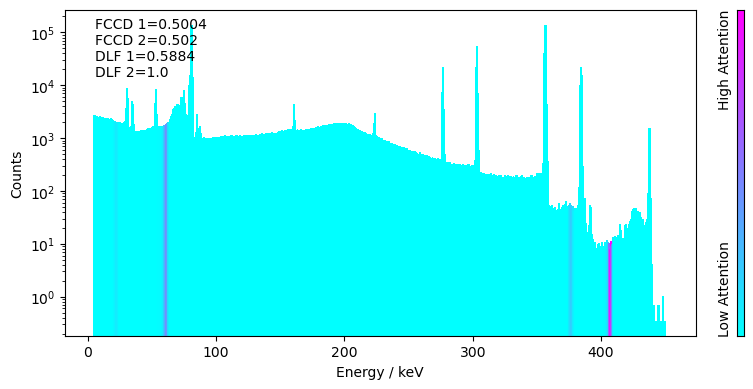

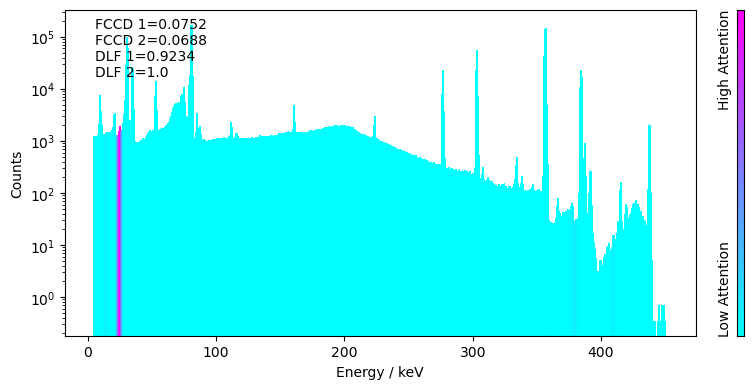

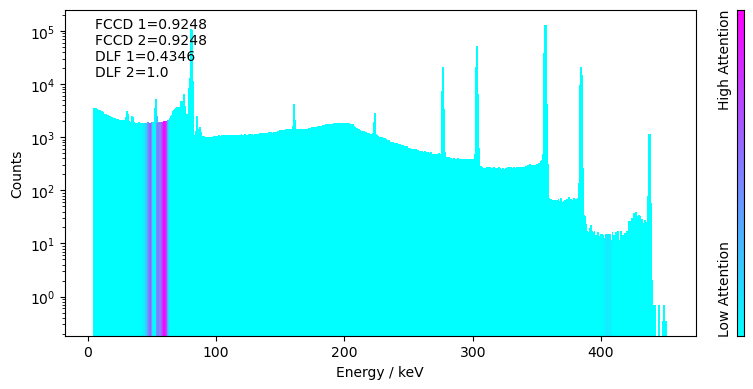

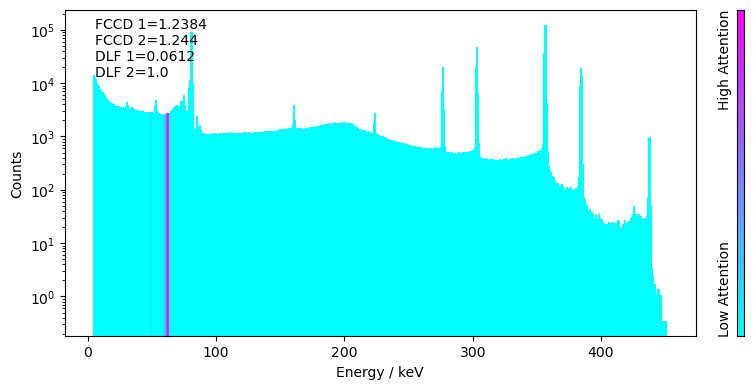

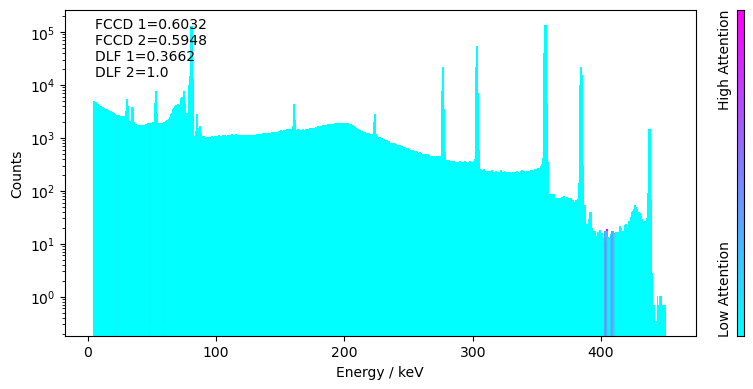

...

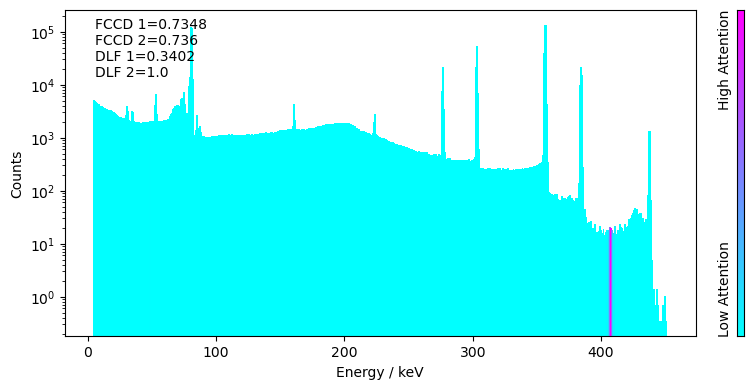

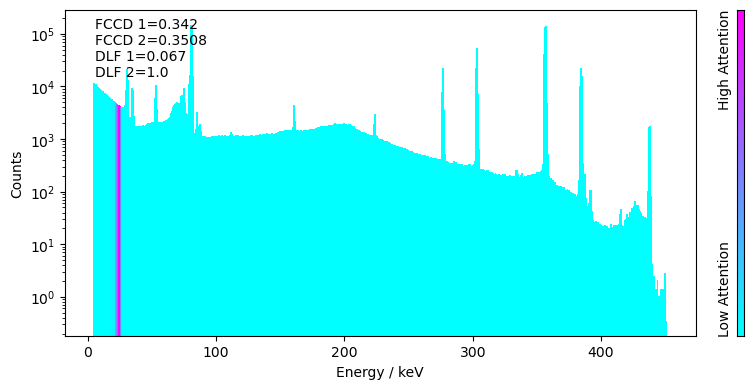

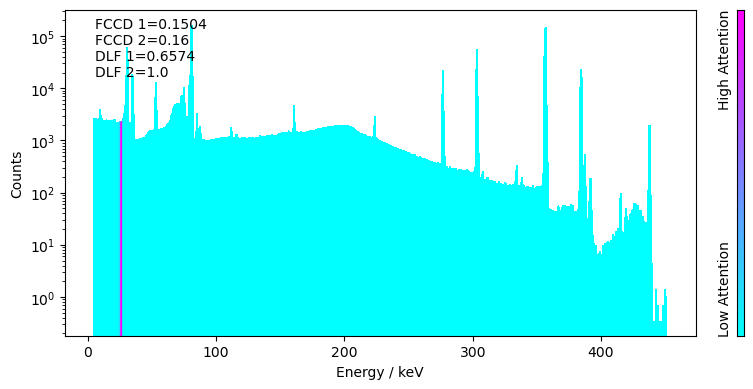

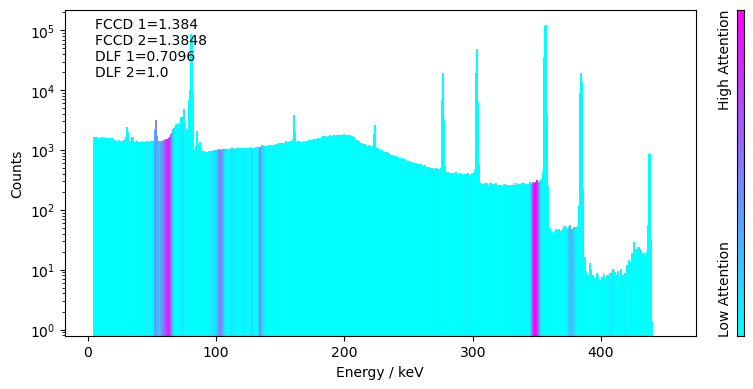

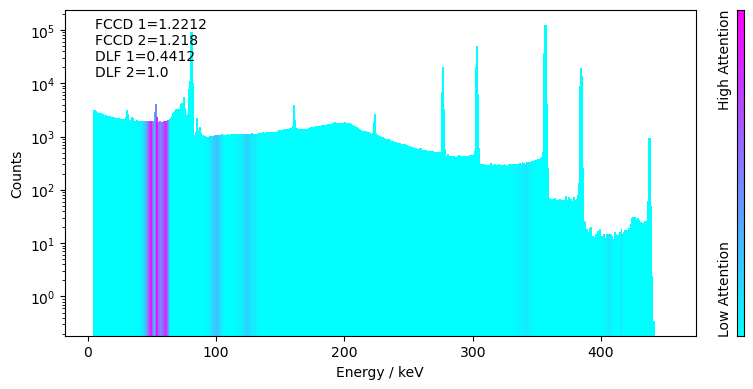

In [60]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True)

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:04<00:00, 11.72it/s]


saved average attention to csv file


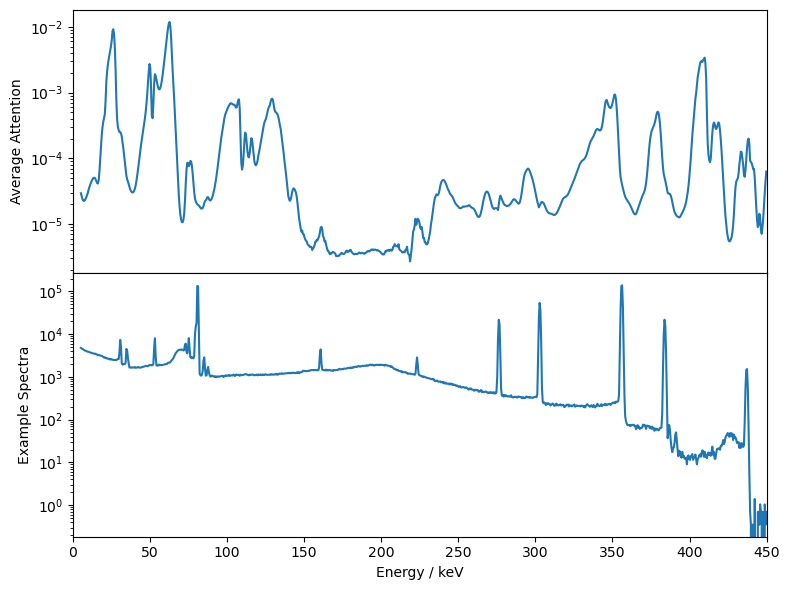

In [61]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True)

## Testing - on full dataset

In [62]:
#load full dataset
BATCH_SIZE = 4 
train_loader, test_loader, dataset = load_data(BATCH_SIZE, size=dataset_size, path_MC2 = MC_PATH_FCCDonly)

100%|███████████████████████████████████████████████████████████████████████████████████████████| 4908/4908 [00:24<00:00, 196.64it/s]


(4908, 890)


Quantile regression loss function on DLF?:  True
FCCDonly?:  False
Selected decision thresholds: FCCD =  0.5 , DLF =  0.5


100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.90it/s]


FCCD accuracies: 
total:  3000
TP:  1244
FP:  483
TN:  1047
FN:  226
accuracy:  0.7636666666666667
precision:  0.7203242617255357
recall:  0.8462585034013606

DLF accuracies: 
accuracy_DLF:  0.8803333333333333

roc auc FCCD:  0.8205379929749679

Total # misclassified trials FCCD:  709  / 3000
Total # misclassified trials DLF:  359  / 3000


{'accuracy_FCCD': 0.7636666666666667,
 'precision_FCCD': 0.7203242617255357,
 'recall_FCCD': 0.8462585034013606,
 'accuracy_DLF': 0.8803333333333333,
 'decision_thresholds': [0.5, 0.5],
 'roc_auc_FCCD': 0.8205379929749679,
 'RMSEmisclassified': {'RMSE_FCCDmisclassified_FCCD': 1.07106593929541,
  'RMSE_DLFmisclassified_FCCD': 1.1034549795123427,
  'totalTrials': 3000,
  'NoMisclassifiedFCCD': 709,
  'NoMisclassifiedDLF': 359}}

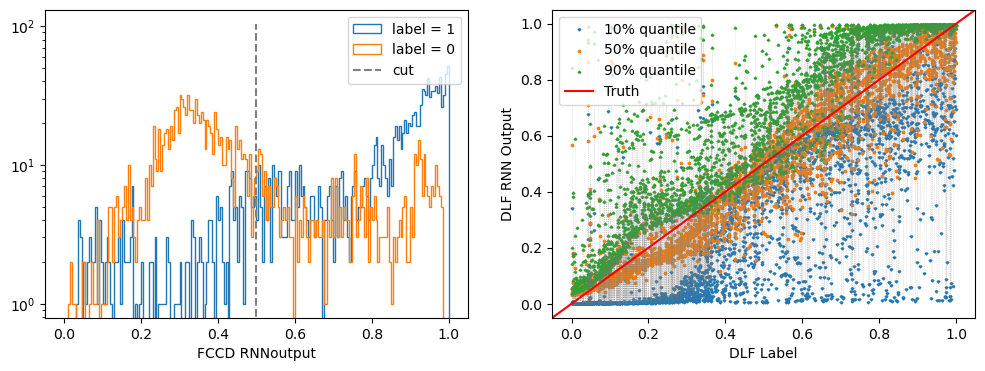

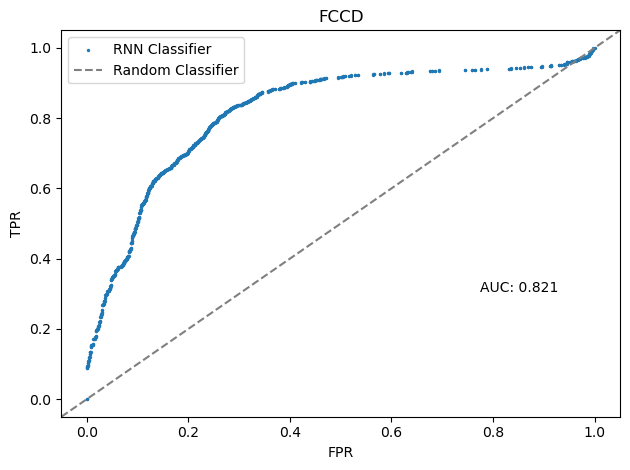

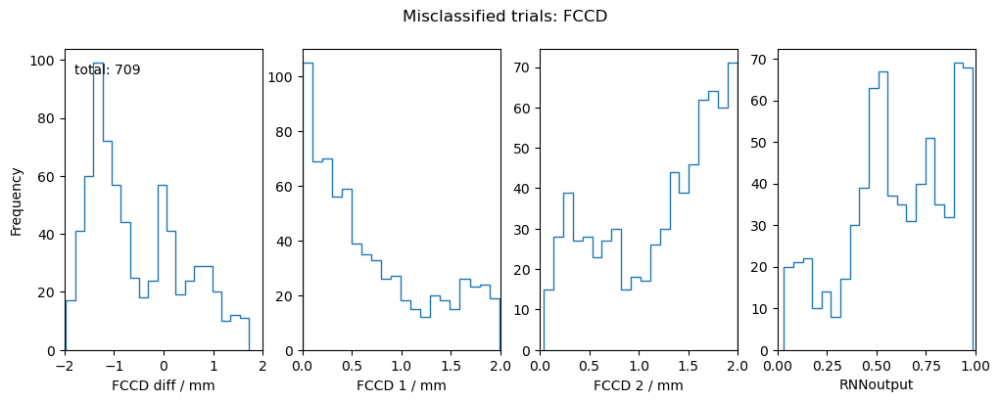

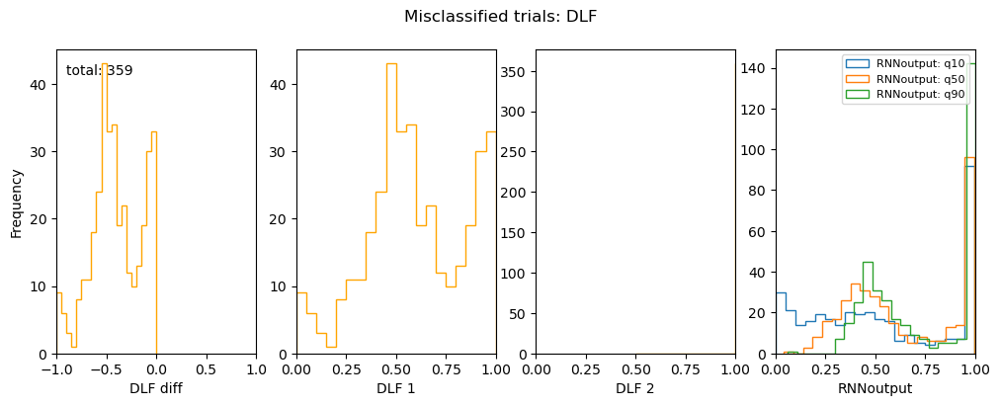

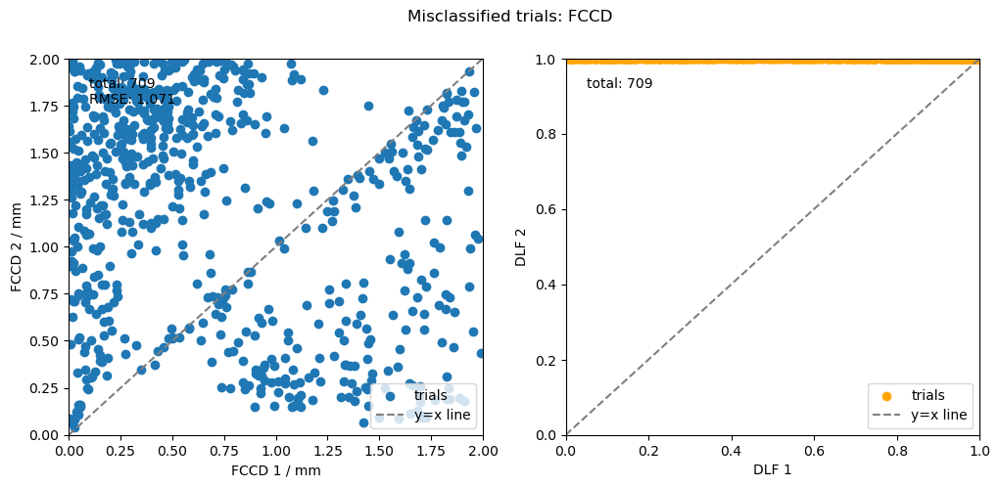

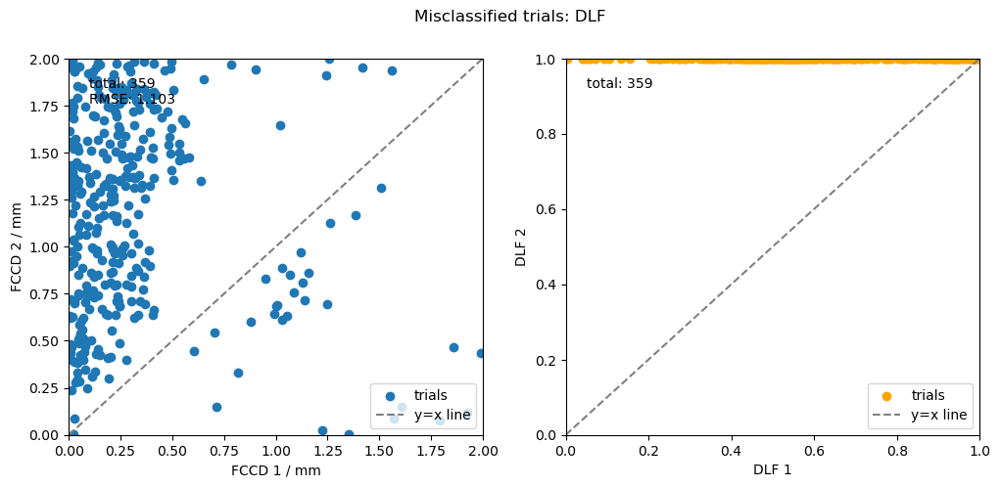

In [63]:
test_RNN(RNNclassifier_maxFCCDdiff0_01mm , test_loader, RNN_ID=RNN_ID, 
                                      misclassified_trials_plots = True, save_results = True, roc_curve=True,
                                     quantileRegressionDLF=True, train_restricted_test_fulldataset = True)

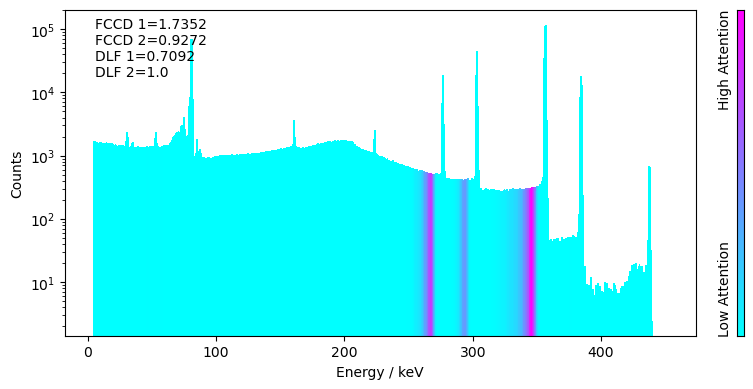

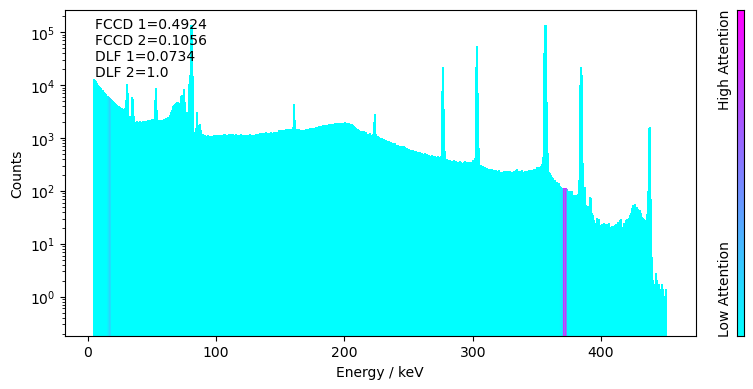

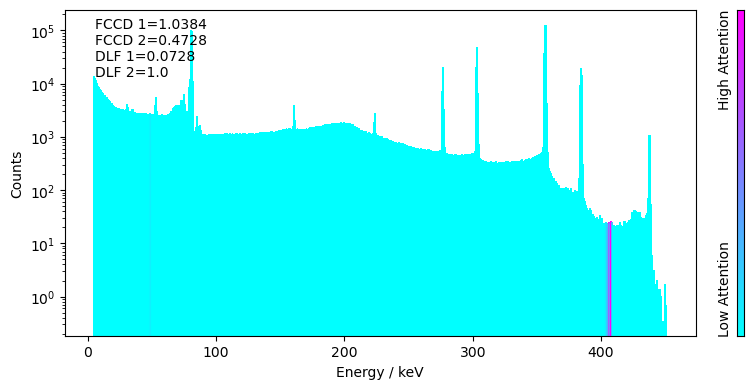

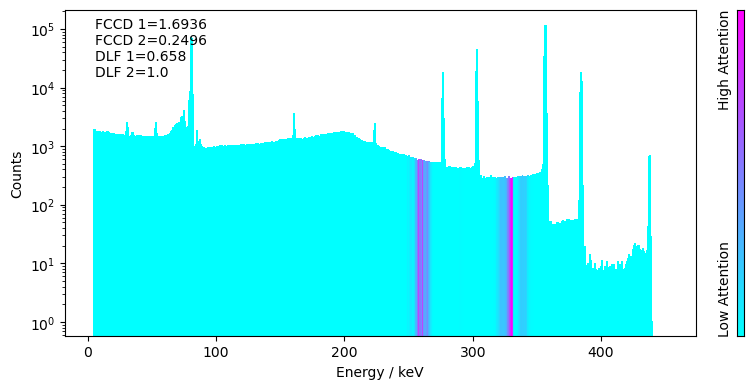

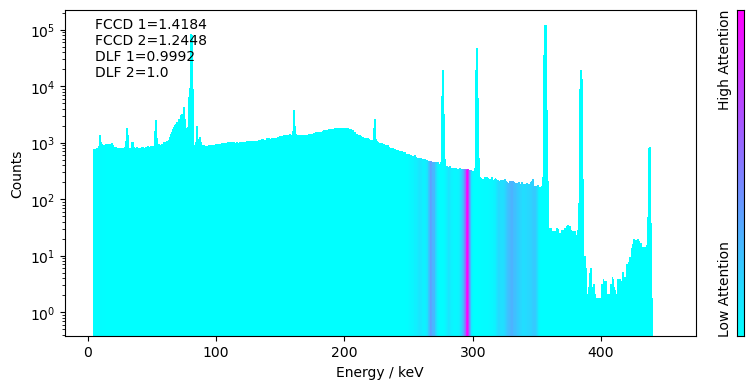

...

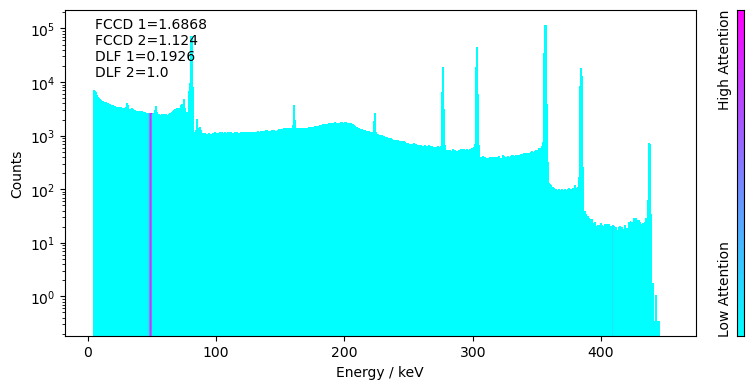

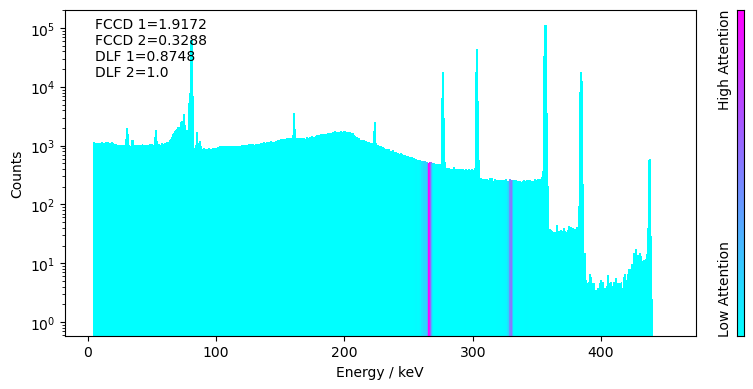

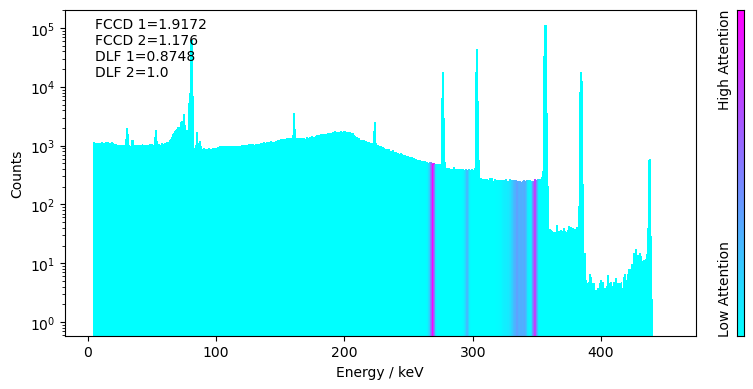

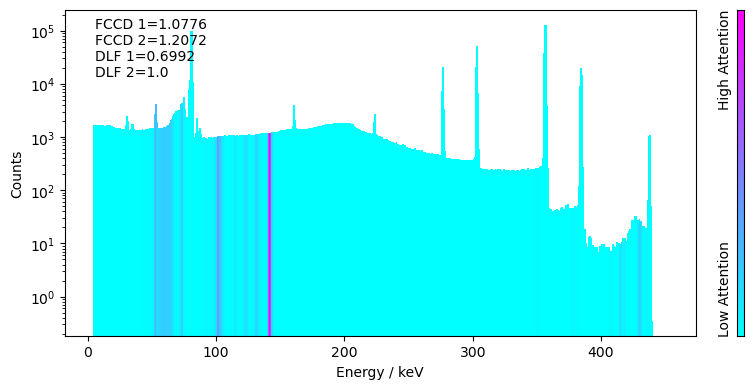

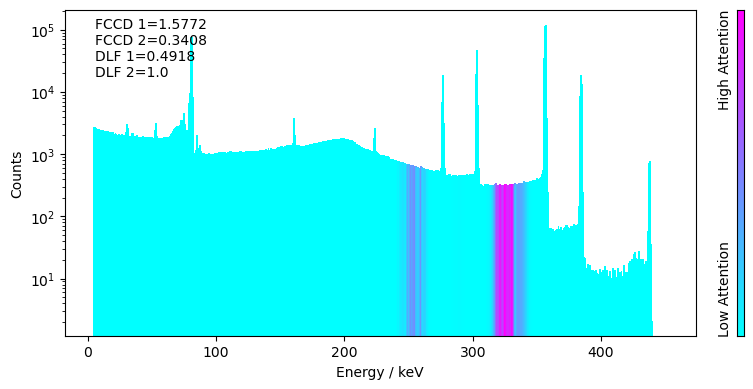

In [64]:
#Plot multple attention scores
plot_multiple_attention(dataset, test_loader, model_path, attention_mechanism="normal", RNN_ID=RNN_ID, 
                        save_plots = True, quantileRegressionDLF=True, train_restricted_test_fulldataset = True)
    

100%|██████████████████████████████████████████████████████████████████████████████████████████████| 750/750 [01:08<00:00, 10.99it/s]


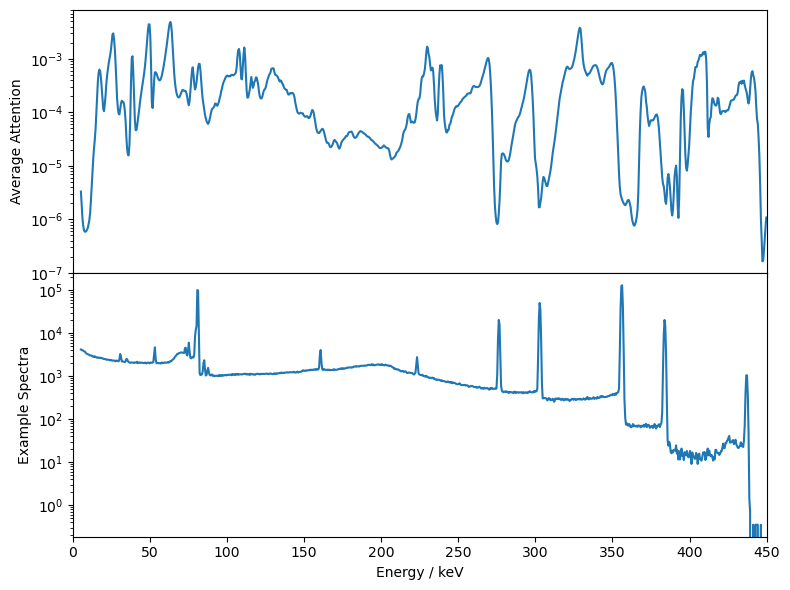

In [65]:
#Plot average attention score
average_attention = plot_average_attention(dataset, test_loader, model_path, attention_mechanism="normal", 
                                           RNN_ID=RNN_ID, save_plots = True, quantileRegressionDLF=True,
                                          train_restricted_test_fulldataset = True)